<h1><center> monxeana.ipynb </center></h1>

<br>
<br>
<br>
<br>
<br>

Last Modified: By Daniel Baur on 14nd July 2020

This jupyter notebook is used for the analysis of data recorded with the MonXe radon emanation chamber.

<br>

### Table of Contents


0. **[Stuff](#0.-Stuff)**<br>
    0.1 [Imports](#0.1-Imports)<br>
    0.2 [Definitions](#0.2-Definitions)<br>


1. **[MCA Data Processing](#1.-MCA-Data-Processing)**<br>
    1.1 [Raw Data > Raw Energy Spectrum](#1.1-Raw-Data->-Raw-Energy-Spectrum)<br>
    1.2 [Raw Energy Spectrum > Fitted Energy Spectrum](#1.2-Raw-Energy-Spectrum->-Fitted-Energy-Spectrum)<br>
    1.3 [Fitted Energy Spectrum > Peak Data](#1.3-Fitted-Energy-Spectrum->-Peak-Data)<br>


2. **[Analysis](#2.-Analysis)**<br>
    2.0 [Definitions](#1.0-Definitions)<br>

<br>
<br>
<br>
<br>
<br>

# 0. Stuff

## 0.1 Imports


In [1]:

# including the monxe_software libraries
import getpass
import sys
username = getpass.getuser()
if username == "daniel":
    print("Logged in as 'daniel'.")
    pathstring_miscellaneous_figures = "/home/daniel/Desktop/arbeitsstuff/20180705__monxe/monxe_software/miscfig/"
    pathstring_monxeana = "/home/daniel/Desktop/arbeitsstuff/20180705__monxe/monxe_software/monxeana/"
elif username == "monxe":
    print("Logged in as 'monxe'.")
    pathstring_miscellaneous_figures = "/home/monxe/Desktop/other_stuff/Miscellaneous_Figures/"
    pathstring_monxeana = "/home/monxe/Desktop/monxe_software/"
elif username == "jo":
    print("Logged in as 'jo'.")
    pathstring_miscellaneous_figures = "/home/jo/monxe/monxe_software/miscfig/"
    pathstring_monxeana = "/home/jo/monxe/monxe_software/monxeana"
sys.path.append(pathstring_miscellaneous_figures)
sys.path.append(pathstring_monxeana) 
import monxeana
import Miscellaneous_Figures as miscfig

try:
    import monxeana
    import Miscellaneous_Figures as miscfig
    print("Successfully imported 'monxeana' and 'miscellaneous_figures'.")
except:
    print("Both 'monxeana' and 'miscellaneous_figures' could not be imported.")

# my own fuctions

#sys.path.append('/home/jo/monxe/monxe_measurements/20200821__background_dv_vac/')
from analysis_monxe import *

# matplotlib, numpy, scipy
import matplotlib as mpl
import matplotlib.pyplot as plt
try:
    plt.style.use('file://' +pathstring_miscellaneous_figures +"danielsmplstyle.mplstyle")
    print("Successfully imported 'danielsmplstyle.mplstyle'.")
except:
    print("'danielsmplstyle.mplstyle' could not be imported.")
import numpy as np
from scipy import stats
from scipy.special import binom as binomcoeff
from scipy.optimize import curve_fit
from scipy.integrate import quad


# other
import datetime
import pprint
import itertools
import math
import os
from matplotlib.ticker import AutoMinorLocator
import subprocess
import json



Logged in as 'jo'.
Successfully imported 'monxeana' and 'miscellaneous_figures'.
Successfully imported 'danielsmplstyle.mplstyle'.


## 0.2 Definitions

In [2]:

# obtaining the 'runname' from the current working directory
runname = os.path.split(os.path.join(os.getcwd()))[1]
print("run name: ", runname)


run name:  20200821__background_dv_vac



<br>
<br>
<br>
<br>
<br>

# 1. MCA Data Processing

<br>

Within this section the data obtained from time distribution of the detected alpha pulses is processed in order to generate data corresponding to individual isotope populations:


1.  **Raw Data > Raw Energy Spectrum**<br>
The raw energy spectrum is generated from the raw data (i.e. time and adc count per event).


2.  **Raw Energy Spectrum > Fitted Energy Spectrum > Peak Data**<br>
The raw energy spectrum is then rebinned and fitted with Crystal Ball functions. Once the fit is completed the isotope data is extracted for each individual peak (i.e. energy, counts, etc...).


<br>



<br>

## 1.1 Raw Data > Raw Energy Spectrum


/home/jo/monxe/monxe_software/monxeana/monxeana.py:311: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if counts_errors != "":
/home/jo/monxe/monxe_software/monxeana/monxeana.py:324: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if counts_errors != "":


---------------------------------------
--- General Measurement Information ---
---------------------------------------
measurement duration: 4.413 days
recorded events: 312 (ch0: 14)
---------------------------------------


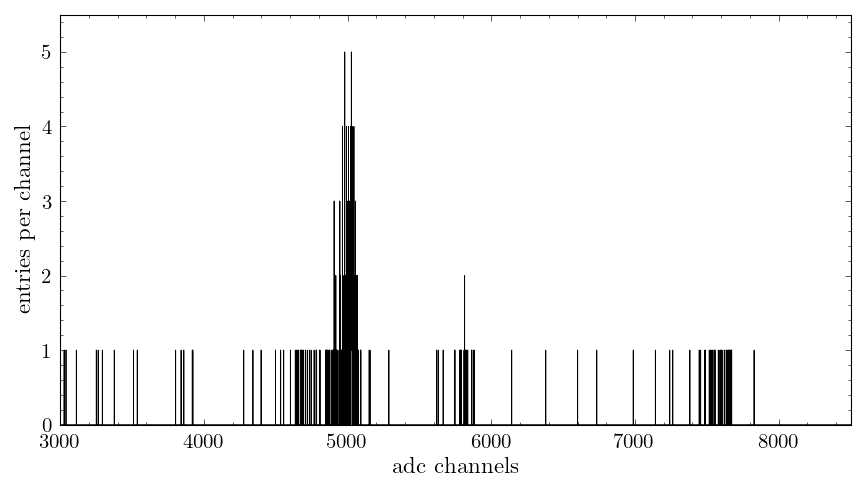

In [3]:

# loading the raw data (i.e. timestamp + adc channel)
data_raw = monxeana.get_timestamp_data(runname=runname)
data_raw_wf_original = monxeana.get_timestamp_data(runname=runname, flag_extractwaveforms = True)


# generating histogram data from the 
data_histogram = monxeana.get_histogram_data_from_timestamp_data(timestamp_data=data_raw)#, flag_extractwaveforms = True)


flag_executethiscell = True
if flag_executethiscell == True:

    # figure formatting
    fig, ax1 = plt.subplots(figsize=miscfig.image_format_dict["16_9"]["figsize"], dpi=150)
    xlim = [0, monxeana.n_adc_channels]
    xlim = [3000, 8500]
    ylim = [0,1.1*(max(data_histogram["counts"][(data_histogram["bin_centers"]>=xlim[0]) & (data_histogram["bin_centers"]<=xlim[1])] ))]
    ax1.set_xlim(xlim)
    ax1.set_ylim(ylim)
    #ax1.set_yscale('log')
    ax1.set_xlabel("adc channels")
    ax1.set_ylabel("entries per channel")

    # plotting stepized histogram data
    bin_centers, counts, counts_errors, bin_centers_mod, counts_mod = monxeana.stepize_histogram_data(
        bincenters=data_histogram["bin_centers"],
        counts=data_histogram["counts"],
        counts_errors=data_histogram["counts_errors"],
        flag_addfirstandlaststep=True)
    plt.plot(
        bin_centers_mod,
        counts_mod,
        linewidth = 0.4,
        color=monxeana.color_histogram,
        linestyle='-',
        zorder=1,
        label="fdfa")

    # errors
    #plt.fill_between(
    #    bin_centers,
    #    counts-counts_errors,
    #    counts+counts_errors,
    #    color=monxeana.color_histogram_error,
    #    alpha=1,
    #    zorder=0,
    #    interpolate=True)

    # annotations
    #monxeana.annotate_documentation_json(
    #    annotate_ax=ax1,
    #    filestring_documentation_json = "./documentation.json",
    #    text_fontsize = 11,
    #    text_color = "black",
    #    text_x_i = 0.03,
    #    text_y_i = 0.75,
    #    text_parskip = 0.09,
    #    #flag_keys = ["amplifier", "start", "end"],
    #    flag_addduration=True,
    #    flag_print_comment=False,
    #    flag_orientation="left"
    #)
    #plt.legend()


    # saving the output plot
    #plt.show()
    if xlim == [0, monxeana.n_adc_channels]:
        fig.savefig(monxeana.pathstring_output_relative +monxeana.filename_histogram_png +"__raw.png")
    else:
        fig.savefig(monxeana.pathstring_output_relative +monxeana.filename_histogram_png +"__raw__zoom.png")


    # printing the output
    monxeana.print_general_measurement_data(list_file_data=data_raw)

## 1.2 Raw Energy Spectrum > Fitted Energy Spectrum > Peak Data

/home/jo/monxe/monxe_software/monxeana/monxeana.py:311: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if counts_errors != "":
/home/jo/monxe/monxe_software/monxeana/monxeana.py:324: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if counts_errors != "":



########################################
peak: 0
########################################

isotope_data
   label : 210Po
   latex_label : $^{210}\mathrm{Po}$
   energy_in_MeV : 6.0

fit_data
   mu : 5011.322821468969
   sigma : 32.46099276646006
   alpha : 1.3497678953893995
   n : 1.5187354228040815
   N : 29.309277181619443

fit_data_errors
   mu : 3.846289567046117
   sigma : 3.4391602830649433
   alpha : 0.38189682595685603
   n : 0.8845512906954395
   N : 3.5247534993007923

graph_data
   np.ndarray of length 4000

resolution
   resolution_in_percent : 1.525341694623816
   resolution_error : 0.16161034456869958

counts
   left_border_adc : 4621.790908271449
   right_border_adc : 5108.705799768349
   counts : 195




########################################
peak: 1
########################################

isotope_data
   label : 218Po
   latex_label : $^{218}\mathrm{Po}$
   energy_in_MeV : 6.0

fit_data
   mu : 5812.793583688289
   sigma : 20.219681579109487
   alpha : 1.86516972

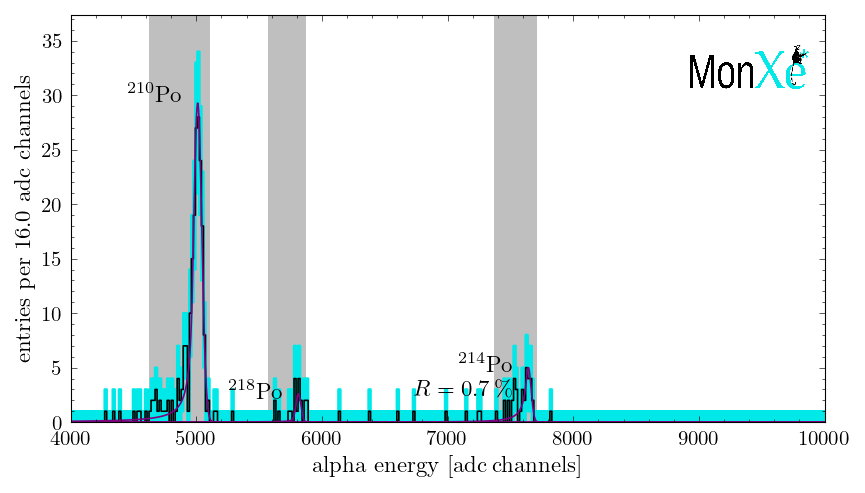

In [4]:


flag_executethiscell = True
if flag_executethiscell == True:


    # generating rebinned histogram data
    data_histogram_rebinned = monxeana.get_histogram_data_from_timestamp_data(
        timestamp_data = data_raw,
        number_of_bins = int(monxeana.n_adc_channels/16))

    # figure formatting
    fig, ax1 = plt.subplots(figsize=miscfig.image_format_dict["16_9"]["figsize"], dpi=150)
    y_lim = [0, 1.1*(max(data_histogram_rebinned["counts"]) + max(data_histogram_rebinned["counts_errors"]))]
    ax1.set_ylim(y_lim)
    x_lim = [4000, 10000]
    x_width = x_lim[1] -x_lim[0]
    y_width = y_lim[1] -y_lim[0]
    ax1.set_xlim(x_lim)
    #ax1.set_yscale('log')
    ax1.set_xlabel("alpha energy $[\mathrm{adc\,channels}]$")
    binwidth = float(data_histogram_rebinned['bin_centers'][2]-data_histogram_rebinned['bin_centers'][1])
    ax1.set_ylabel("entries per " +f"{binwidth:.1f}" +" adc channels")


    # data fitting
    # 'monxeana.fit_range_mult_crystal_ball()' outputs a dictionary containing the fit parameters for the respective peaks
    fit_param_dict = monxeana.fit_range_mult_crystal_ball(
        n = 3, # <--------------------------------------------- EDIT THIS!
        histogram_data = data_histogram_rebinned,
        fit_range = [4000, 9000],
        p0 = (5000, 25, 1, 1, 100, 5600, 25, 1, 1, 100, 7600, 25, 1, 1, 100)) # mu, sigma, alpha, n, N 
    monxeana.add_graph_data_to_fpd(fit_parameter_dictionary=fit_param_dict) # adding plottable graph data to 'fit_param_dict'


    # defining the isotope data corresponding to the peaks
    peak_data_dict = {
        "0": {
            "isotope_data" : {
                "label" : "210Po",
                "latex_label" : r"$^{210}\mathrm{Po}$",
                "energy_in_MeV" : 6.0,
            }
        },
        "1": {
            "isotope_data" : {
                "label" : "218Po",
                "latex_label" : r"$^{218}\mathrm{Po}$",
                "energy_in_MeV" : 6.0,
            }
        },
        "2": {
            "isotope_data" : {
                "label" : "214Po",
                "latex_label" : r"$^{214}\mathrm{Po}$",
                "energy_in_MeV" : 6.0,
            }
        },
    }


    # merging the 'fit_param_dict' into 'peak_data_dict'
    for i in range(len([*peak_data_dict])):
        peak_data_dict[str(i)].update(fit_param_dict[str(i)])


    # peak data calculations (i.e. determine resolution, number of counts, etc...)
    monxeana.calc_peak_data(peak_data_dictionary=peak_data_dict, timestamp_data_ndarray=data_raw)

    
    # plotting the stepized histogram
    bin_centers, counts, counts_errors, bin_centers_mod, counts_mod = monxeana.stepize_histogram_data(
        bincenters=data_histogram_rebinned["bin_centers"],
        counts=data_histogram_rebinned["counts"],
        counts_errors=data_histogram_rebinned["counts_errors"],
        flag_addfirstandlaststep = True)
    plt.plot(
        bin_centers_mod,
        counts_mod,
        linewidth=monxeana.linewidth_histogram_std,
        color=monxeana.color_histogram,
        linestyle='-',
        zorder=1,
        label="fdfa")


    # plotting the Poissonian errors
    plt.fill_between(
        bin_centers,
        counts-counts_errors,
        counts+counts_errors,
        color=monxeana.color_histogram_error,
        alpha=1,
        zorder=0,
        interpolate = True)


    # plotting the fit data
    for key, val in peak_data_dict.items():
        plt.plot(
            peak_data_dict[key]["graph_data"]["x"],
            peak_data_dict[key]["graph_data"]["y"],
            linewidth = monxeana.linewidth_histogram_std,
            color = "purple",
            linestyle = '-',
            zorder = 1,
            label = key)


    # annotationg the MonXe logo
    miscfig.image_onto_plot(
        filestring = "monxe_logo__transparent_bkg.png",
        ax=ax1,
        position=(x_lim[0]+0.90*(x_lim[1]-x_lim[0]),y_lim[0]+0.87*(y_lim[1]-y_lim[0])),
        pathstring = pathstring_miscellaneous_figures +"monxe_logo/",
        zoom=0.02,
        zorder=0)


    # annotating
    for key, val in peak_data_dict.items():
        plt.text(
            x = peak_data_dict[key]["fit_data"]["mu"] -0.02*x_width,
            y = 1.02*monxeana.function_crystal_ball_one(x=peak_data_dict[key]["fit_data"]["mu"], **peak_data_dict[key]["fit_data"]) ,
            #transform = ax1.transAxes,
            s = peak_data_dict[key]["isotope_data"]["latex_label"],
            color = "black",
            fontsize = 11,
            verticalalignment = 'center',
            horizontalalignment = 'right')


    # annotating 
    plt.text(
        x = peak_data_dict["2"]["fit_data"]["mu"] -0.02*x_width,
        y = 1.02*monxeana.function_crystal_ball_one(x=peak_data_dict["2"]["fit_data"]["mu"], **peak_data_dict["2"]["fit_data"]) -0.06*y_width,
        #transform = ax1.transAxes,
        s = r"$R=" +f"{peak_data_dict['2']['resolution']['resolution_in_percent']:.1f}" +r"\,\%$",
        color = "black",
        fontsize = 11,
        verticalalignment = 'center',
        horizontalalignment = 'right')


    # annotating 
    for key, val in peak_data_dict.items():
        ax1.axvspan(peak_data_dict[key]["counts"]["left_border_adc"], peak_data_dict[key]["counts"]["right_border_adc"], alpha=0.5, linewidth=0, color='grey', zorder=-50)


    # printing the legend
    #plt.legend()




    # saving and printing the output
    #plt.show()
    fig.savefig(monxeana.pathstring_output_relative +monxeana.filename_histogram_png +"__fit.png")
    #fig.savefig("/home/daniel/Desktop/arbeitsstuff/20200420__conferences_workshops_excursions/20200909__darwin_collaboration_meeting_2020/talk_monxe/images/" +monxeana.filename_histogram_png +"__fit.png")
    monxeana.print_peak_data_dict_contents(pdd = peak_data_dict)


<br>
<br>
<br>
<br>
<br>

# 2. Analysis

In [5]:
# copy data because i'm to lazy to run all cell in case i need the original data

data_raw_wf = data_raw_wf_original.copy()

In [6]:
# use functions from analysis_monxe.py for analysis
# calculate height from baseline to max sample

poped_wf = filter_400(data_raw_wf, return_poped_wf=True)
print('filter done')
calc_baseline(data_raw_wf)
print('baseline done')
calc_height(data_raw_wf)
print('calc height done')
fit_expo(data_raw_wf)
print('first fit done')

filter done
baseline done
calc height done
first fit done


In [12]:
# fit

fit(data_raw_wf)

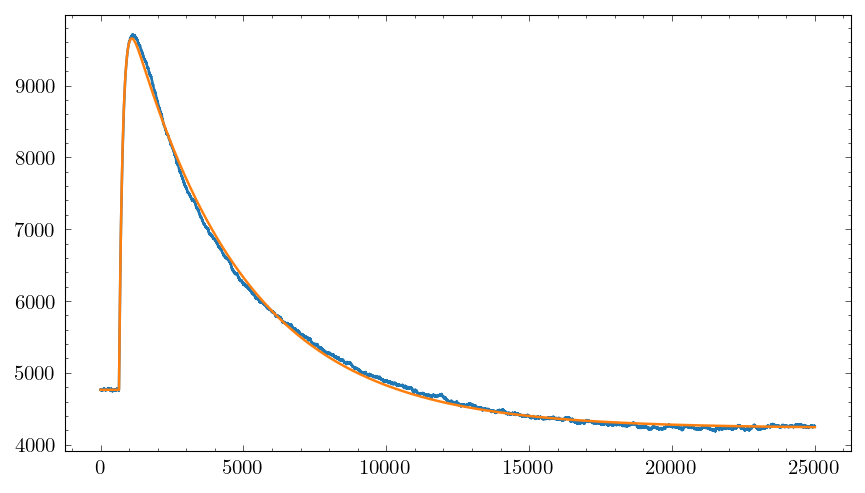

4893.323467530431 
 5749.280874511022 
##############################


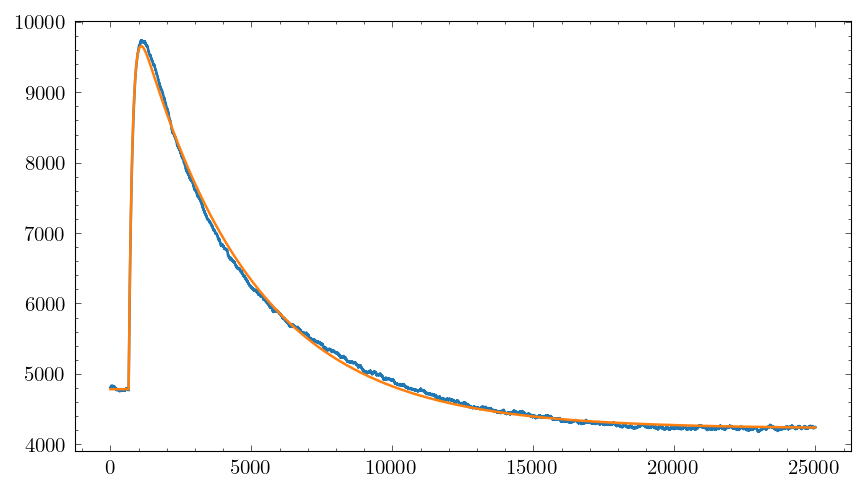

4873.3732258989185 
 5724.6700630107825 
##############################


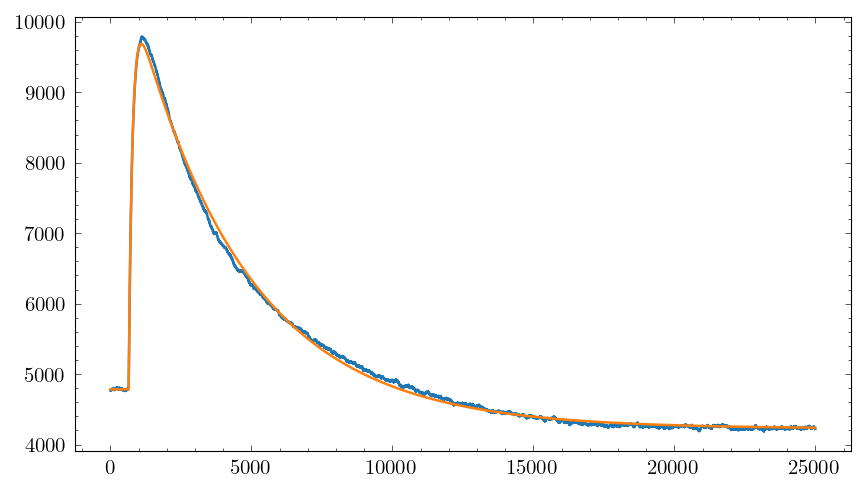

4903.4619332048505 
 5768.952936696351 
##############################


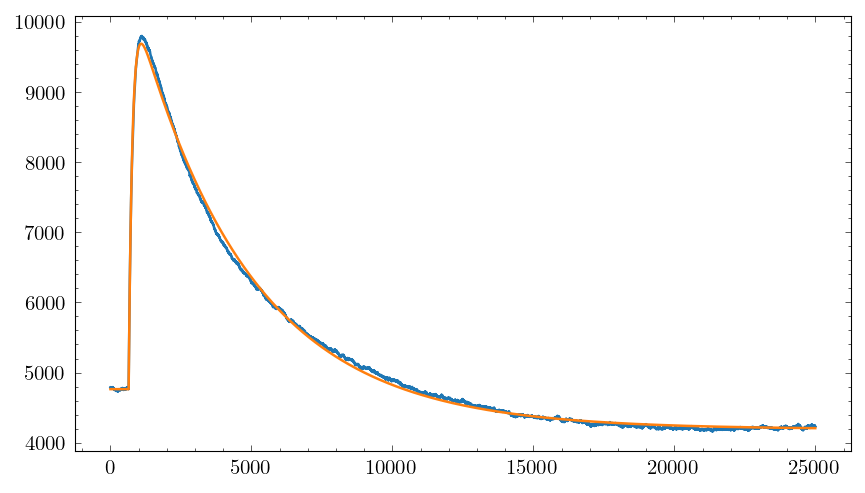

4925.281609699874 
 5763.15036909615 
##############################


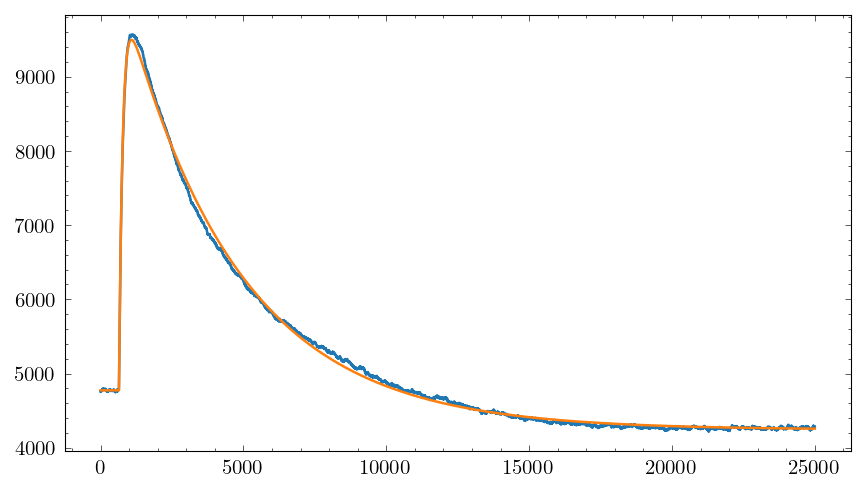

4724.8588311565045 
 5525.232340698166 
##############################


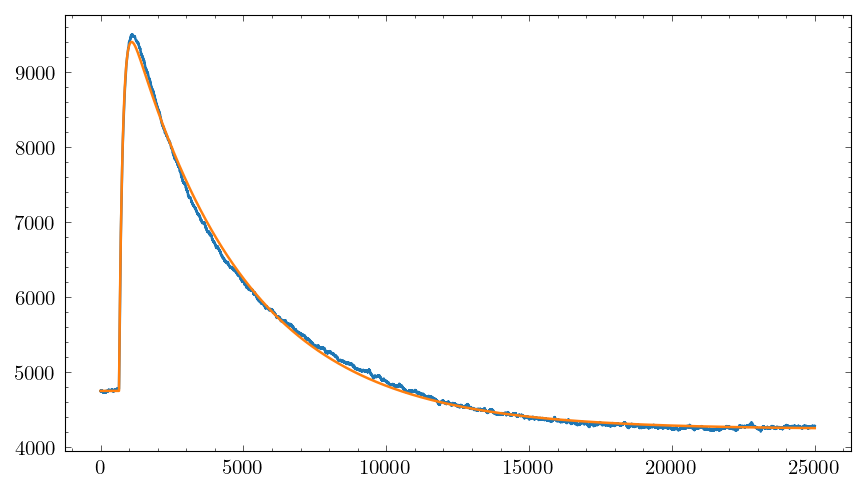

4653.0944530027955 
 5444.055434143272 
##############################


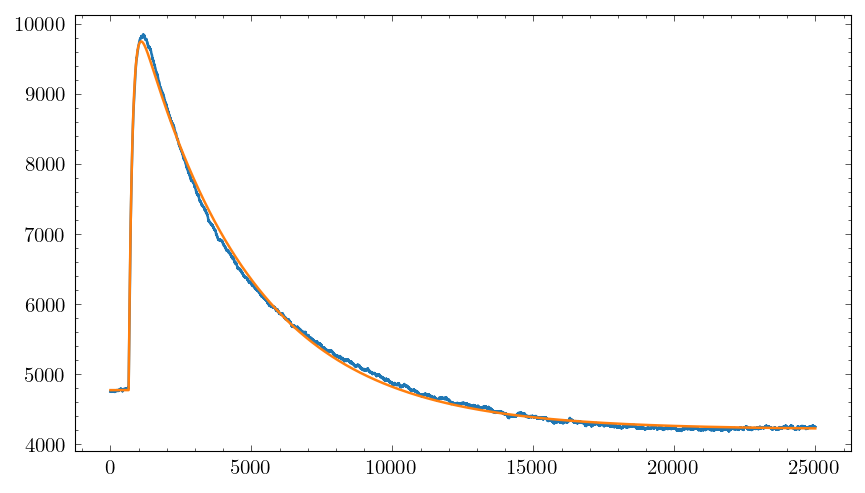

4971.488467180267 
 5833.757830689685 
##############################


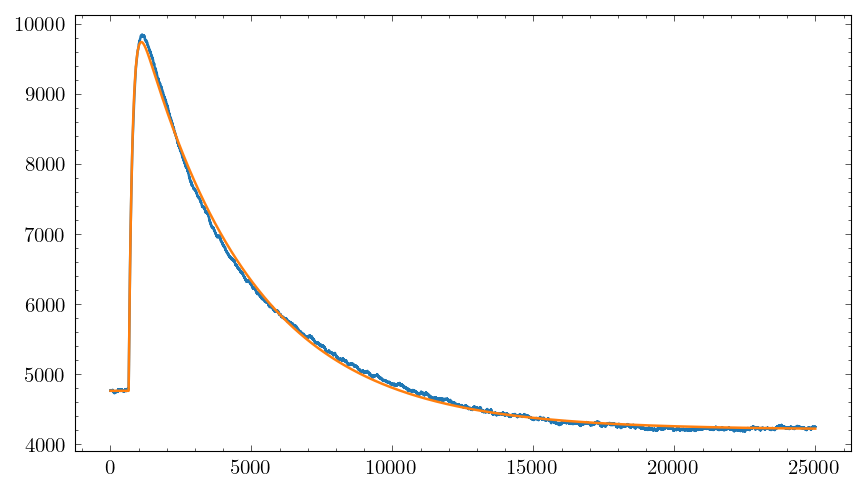

4977.298457706496 
 5862.751812863912 
##############################


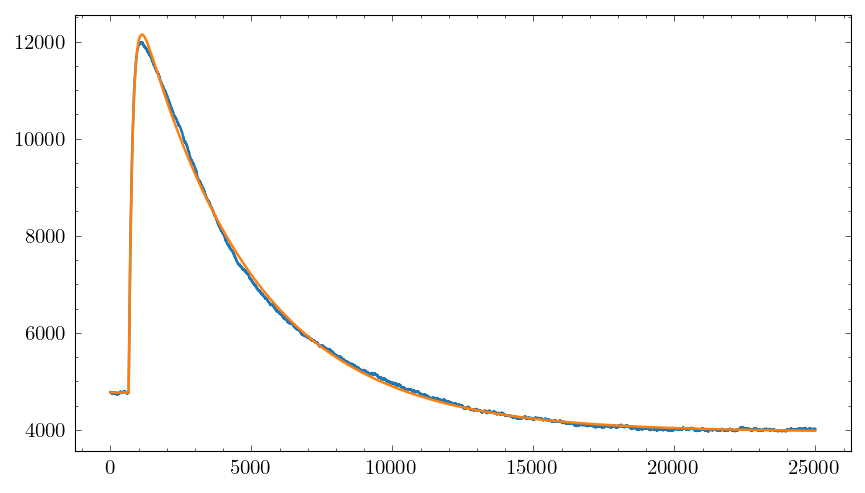

7380.118447432055 
 8727.006768061556 
##############################


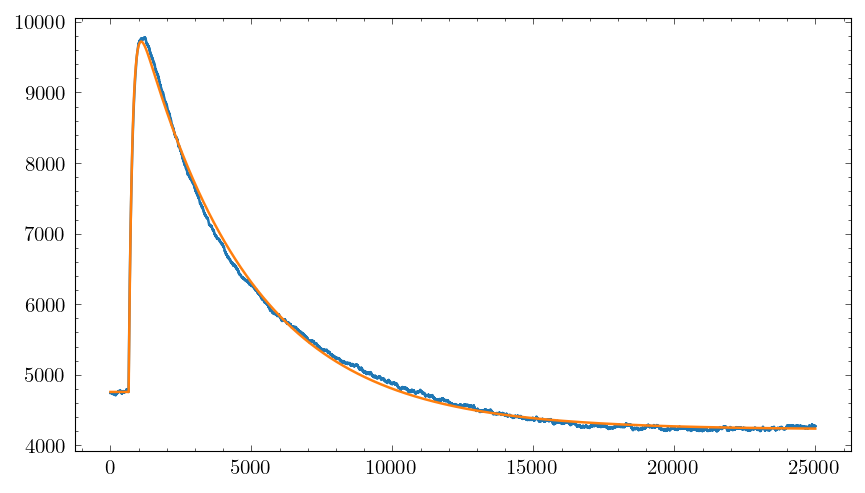

4962.755490275298 
 5839.373210667072 
##############################


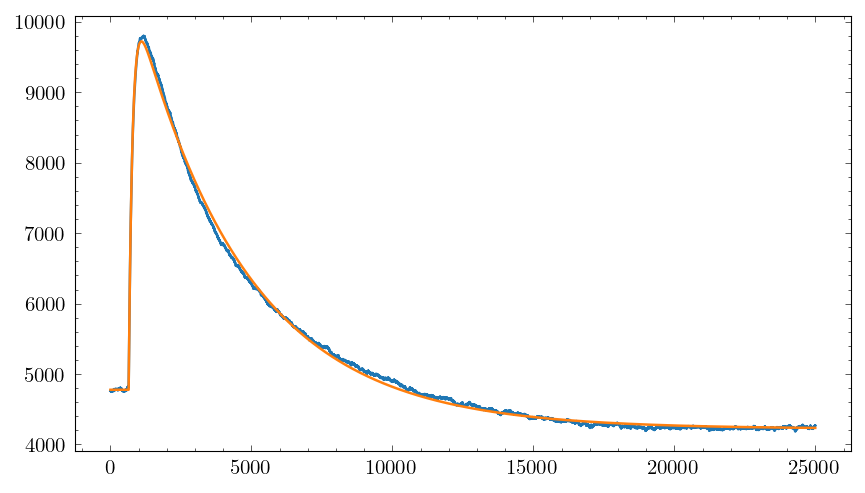

4945.782423762275 
 5828.399367376325 
##############################


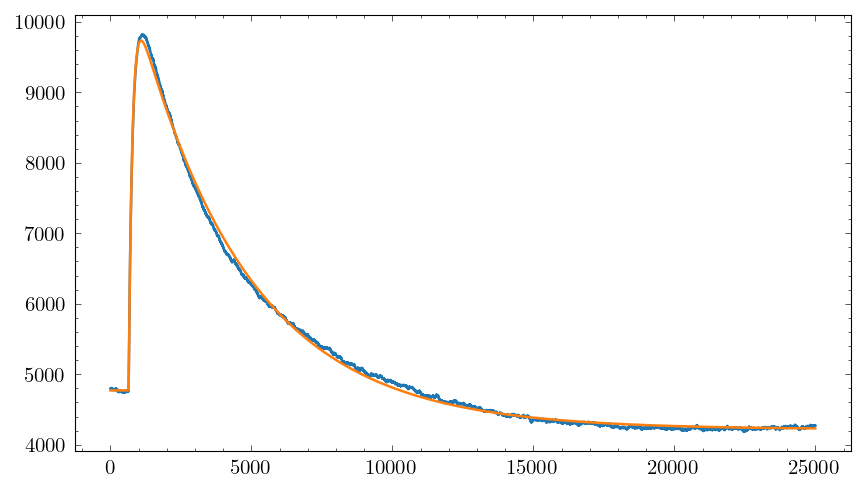

4964.059912124145 
 5827.207803948856 
##############################


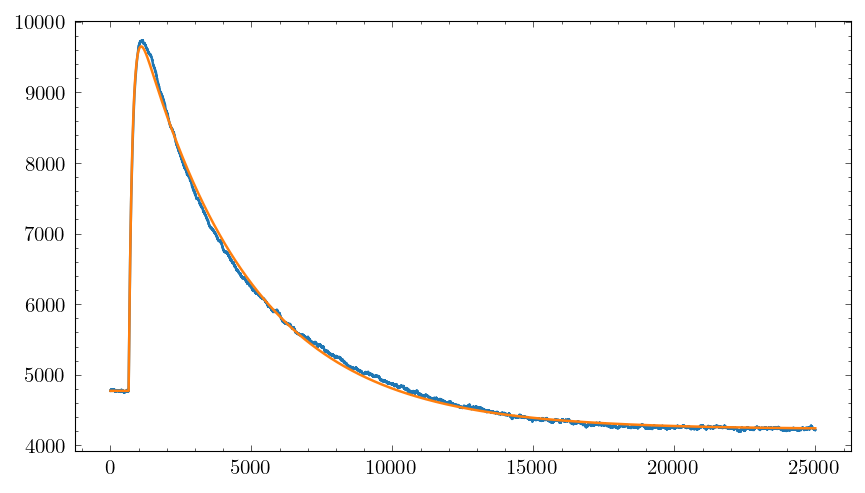

4879.873949598661 
 5737.845613868577 
##############################


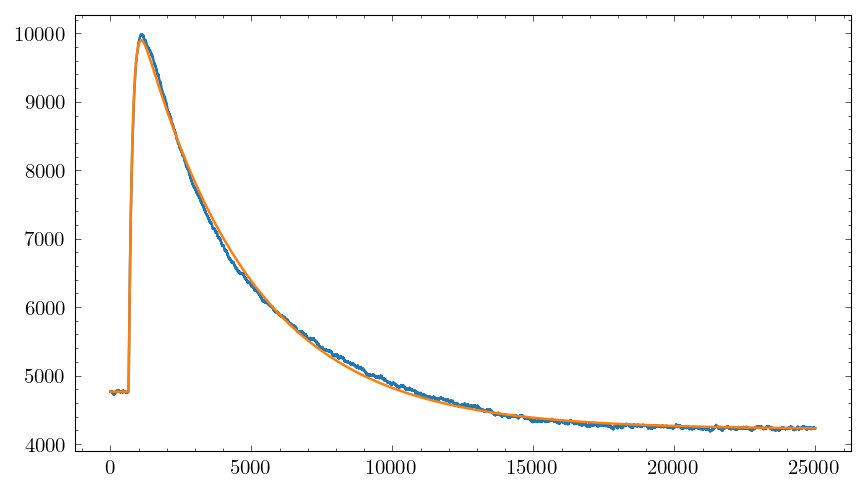

5136.456912899678 
 6039.548949016244 
##############################


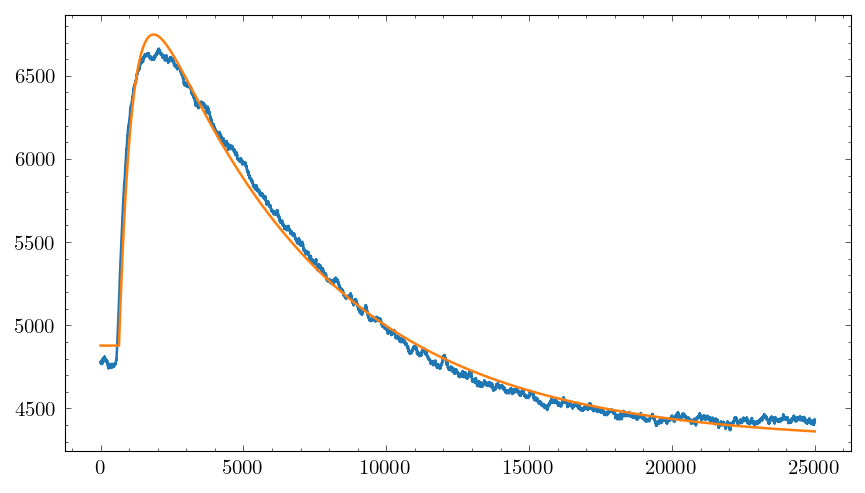

1870.2372212511355 
 2665.450593345709 
##############################


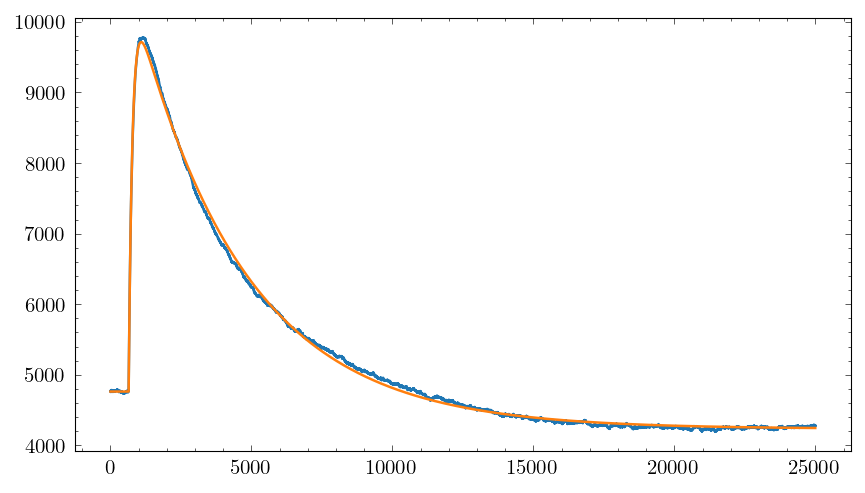

4950.7433722414535 
 5823.417358046982 
##############################


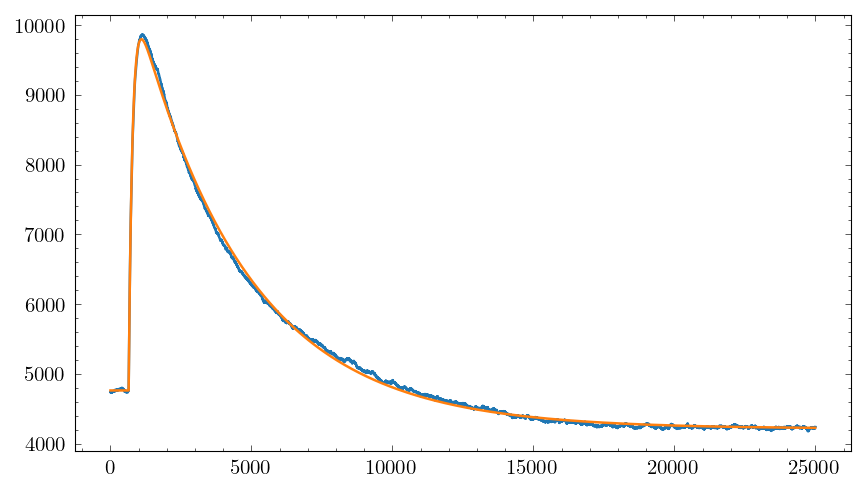

5033.334192382178 
 5939.42681860827 
##############################


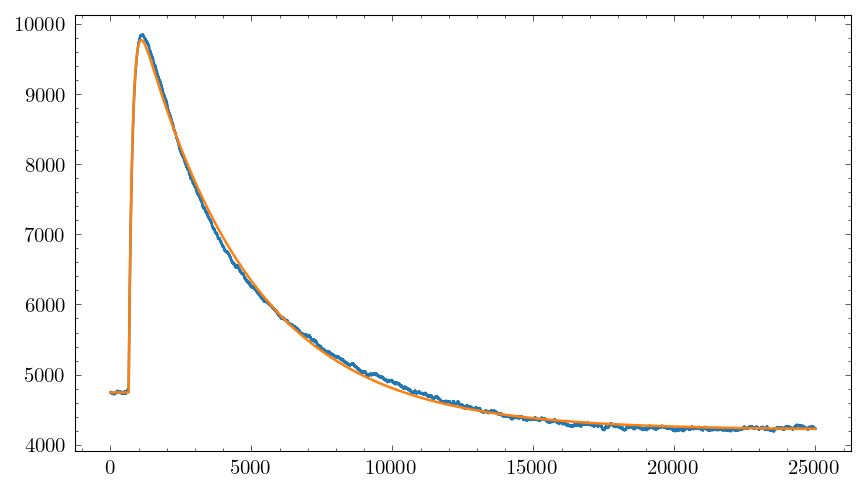

5022.176128691437 
 5914.558841569504 
##############################


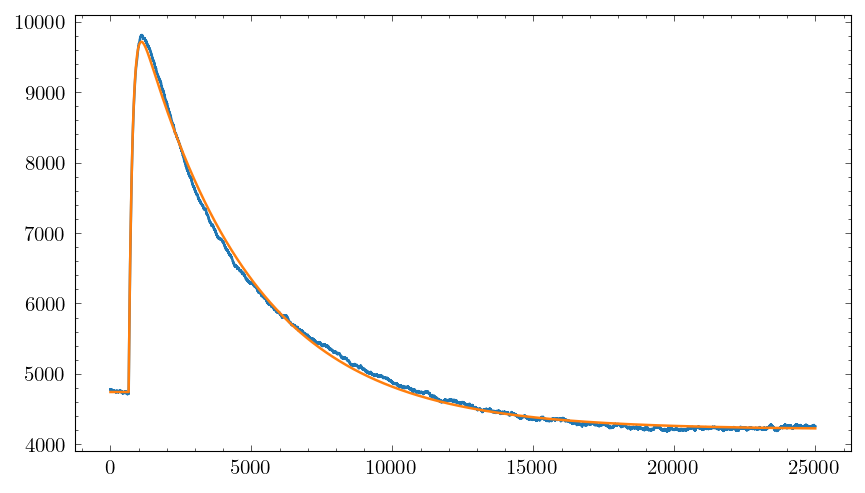

4975.651895127012 
 5852.156910513809 
##############################


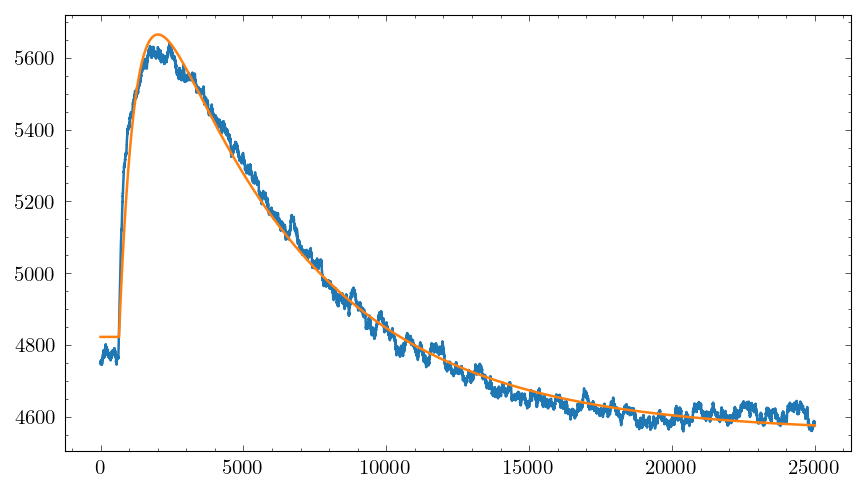

842.8181918549772 
 1328.4773479796227 
##############################


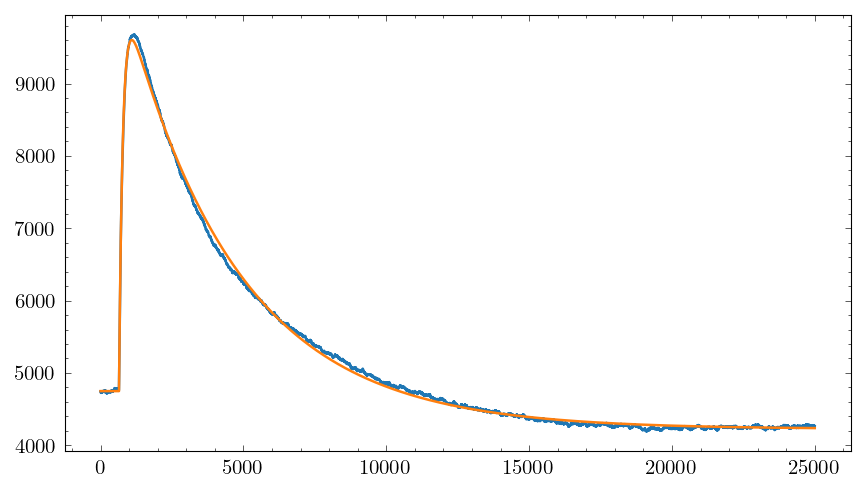

4853.275846823357 
 5702.789045238577 
##############################


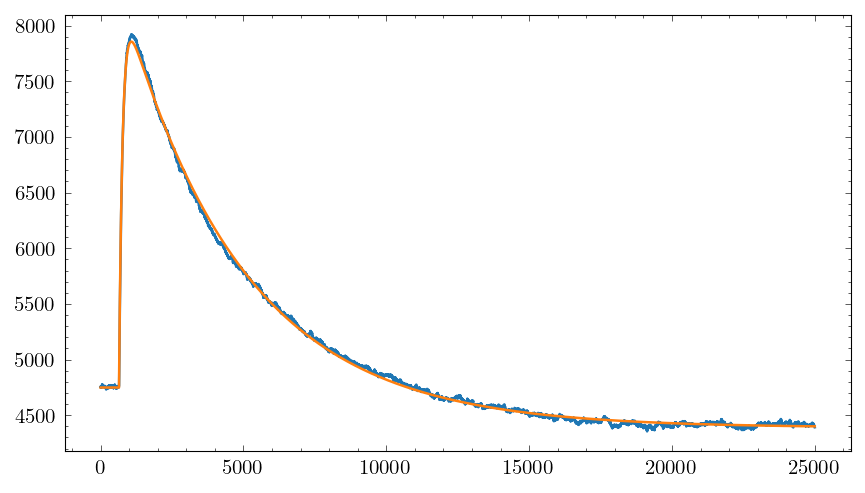

3107.0492634347956 
 3593.3722420740964 
##############################


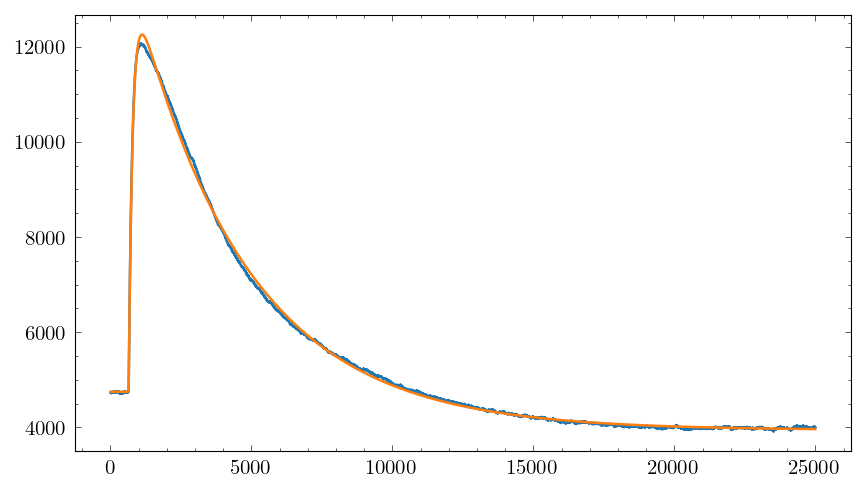

7503.456280398075 
 8886.207150626056 
##############################


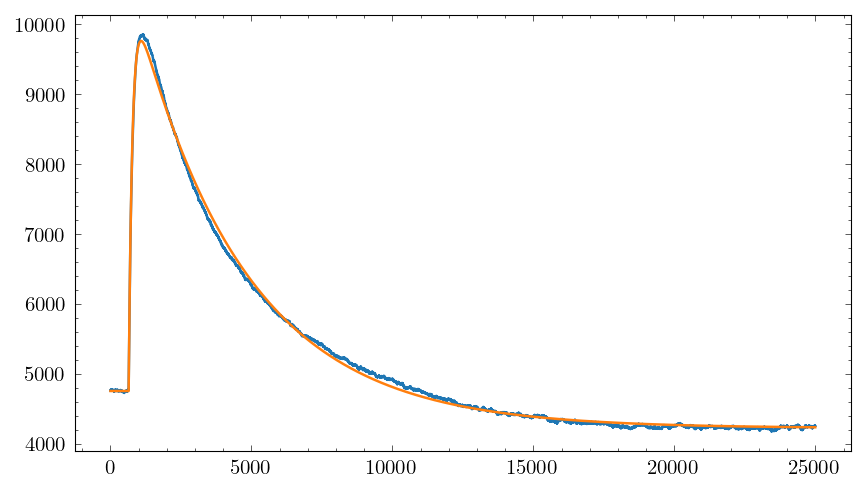

5009.01916381483 
 5883.335933804437 
##############################


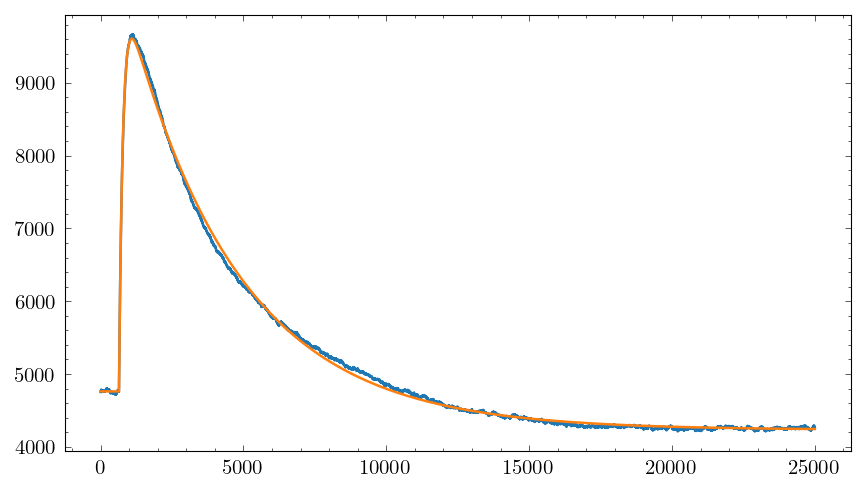

4844.05981501537 
 5713.082778535093 
##############################


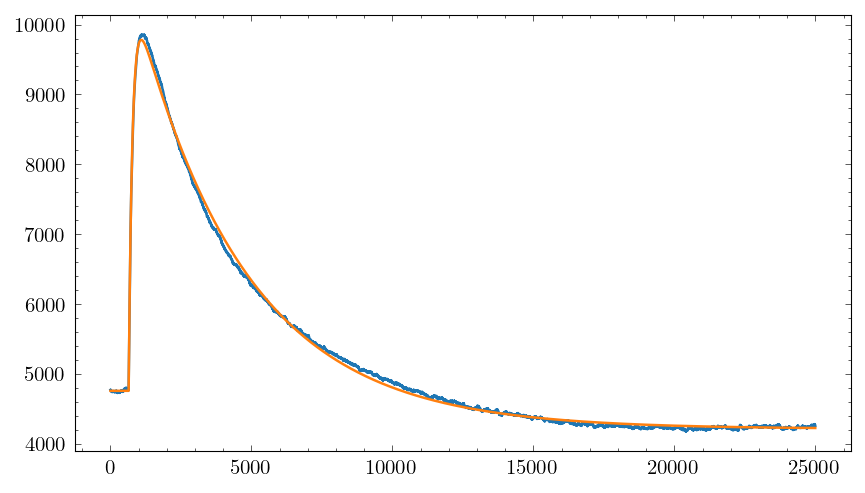

5022.567572252668 
 5911.937819931659 
##############################


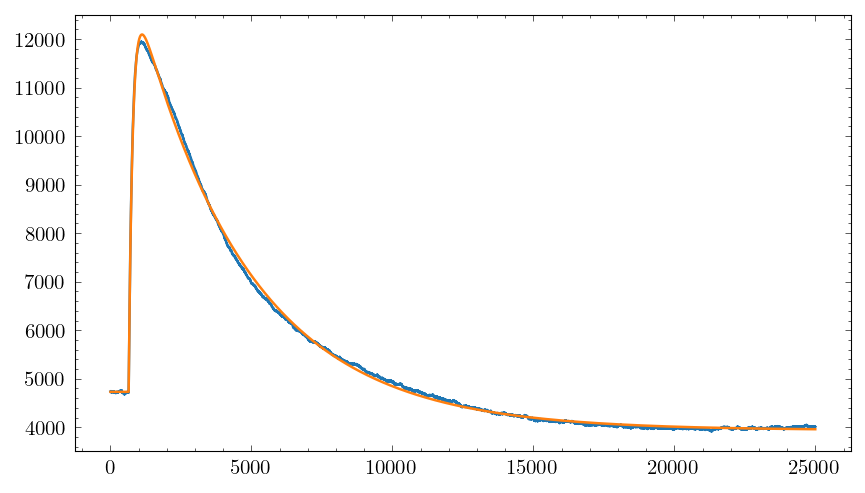

7363.385477435274 
 8733.657336518329 
##############################


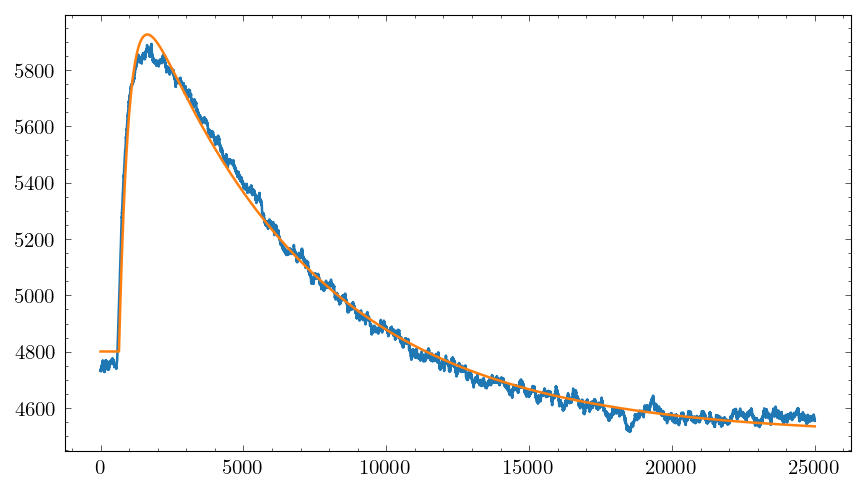

1125.7490885190364 
 1486.9194846516484 
##############################


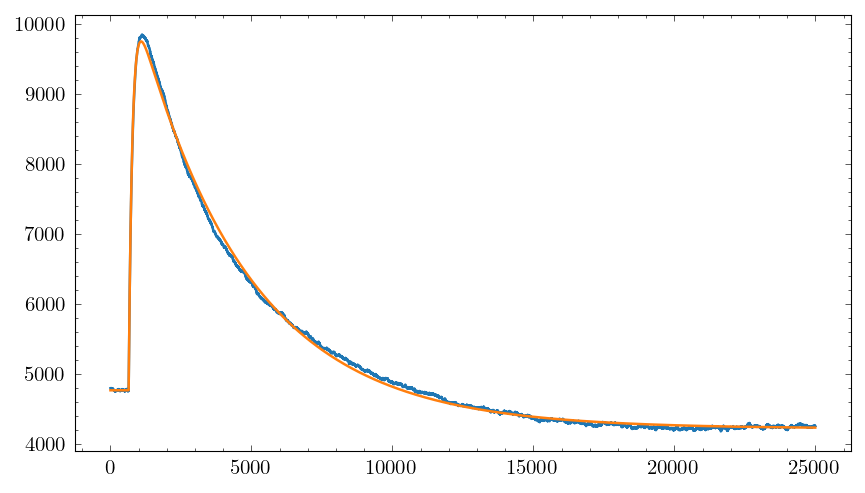

4983.010173762146 
 5844.696600071427 
##############################


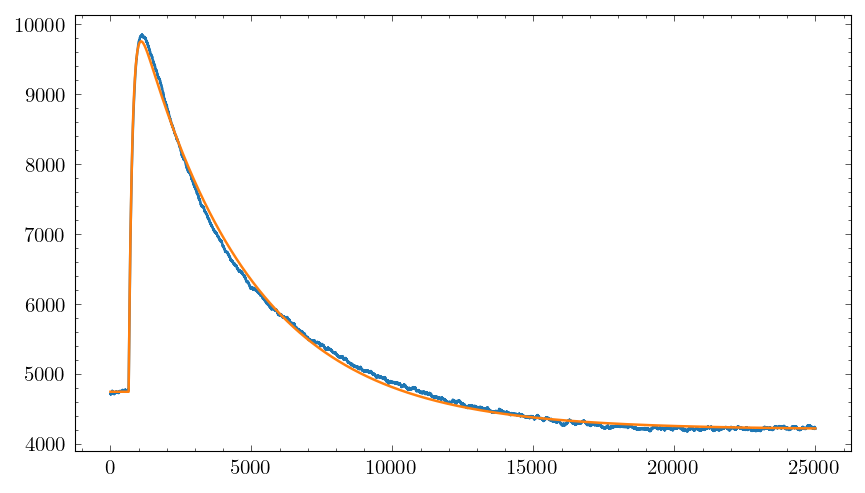

5013.5656035632655 
 5878.145287203559 
##############################


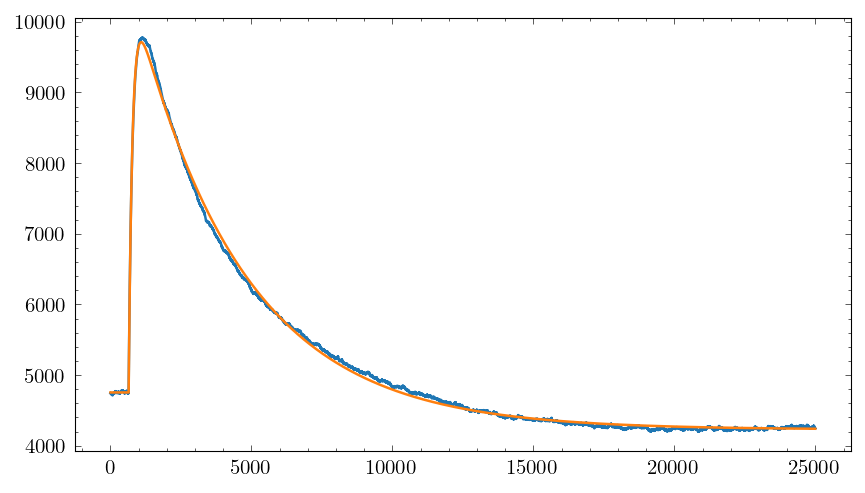

4959.285074243385 
 5843.672607731006 
##############################


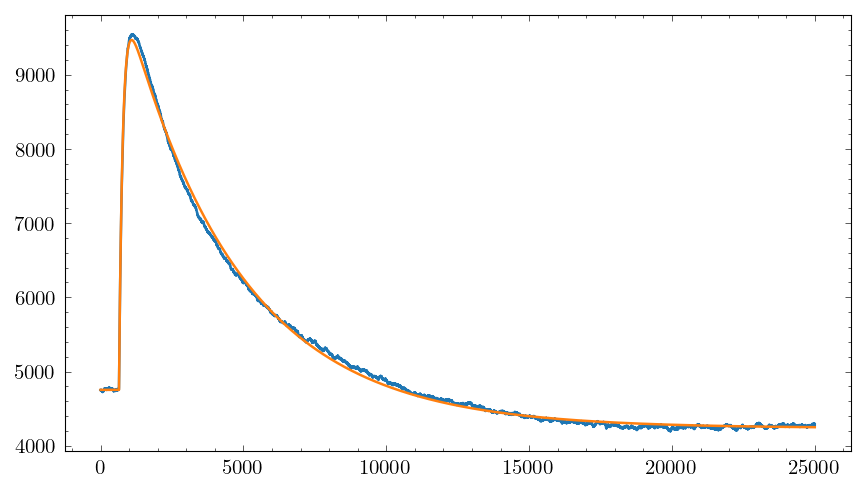

4716.73278588401 
 5530.858012791556 
##############################


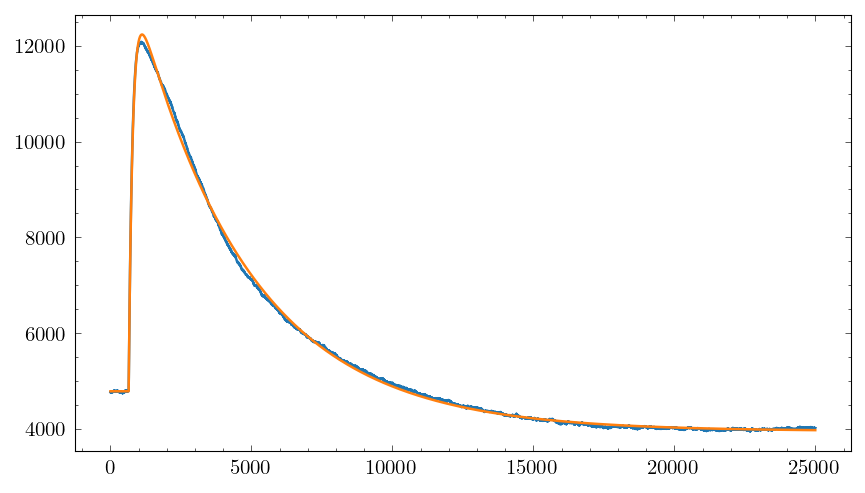

7457.197755579609 
 8839.655999610832 
##############################


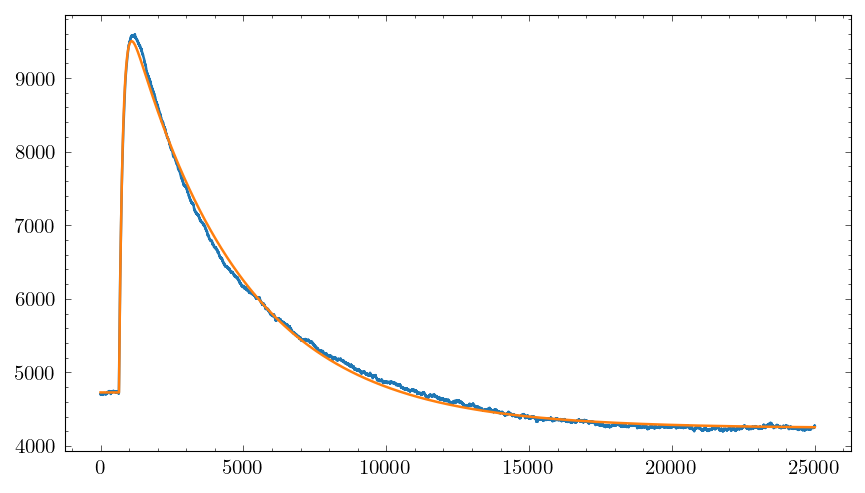

4773.672186274328 
 5604.918435167694 
##############################


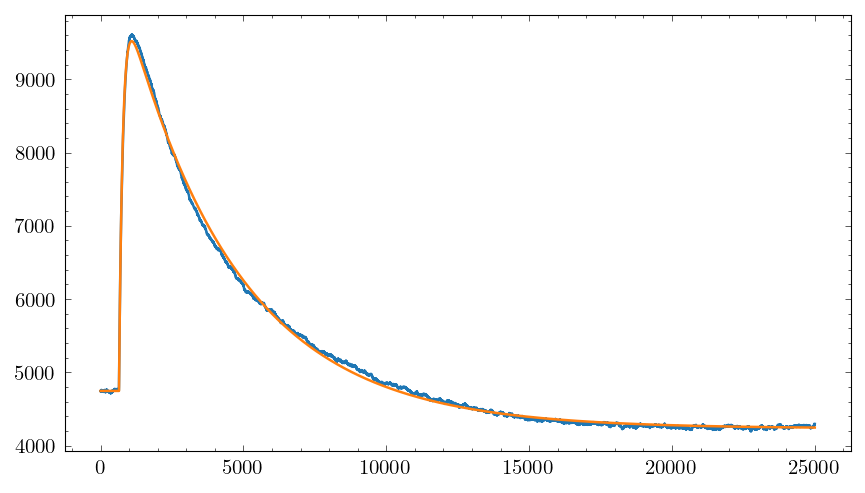

4774.551647090511 
 5609.692573156982 
##############################


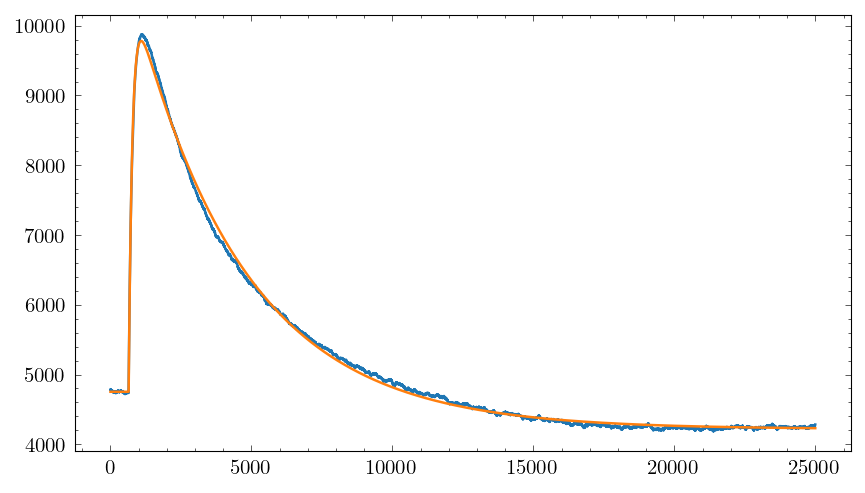

5028.4234911343565 
 5903.279369337624 
##############################


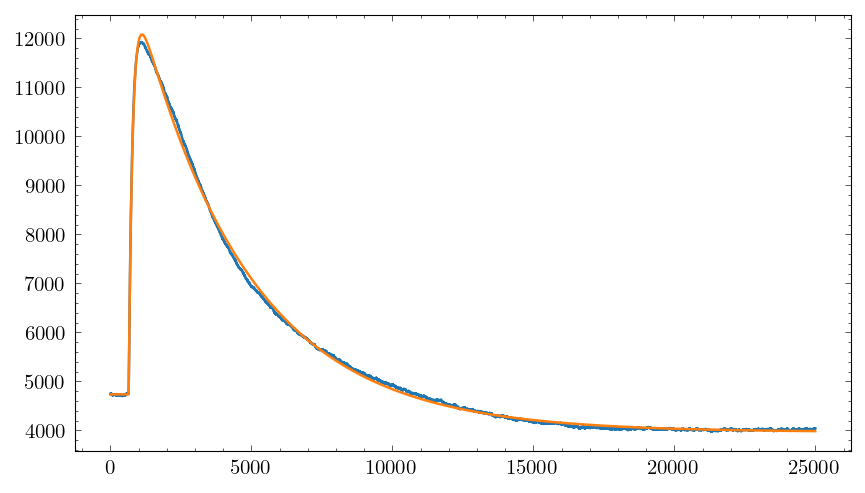

7344.024373675216 
 8721.892152828386 
##############################


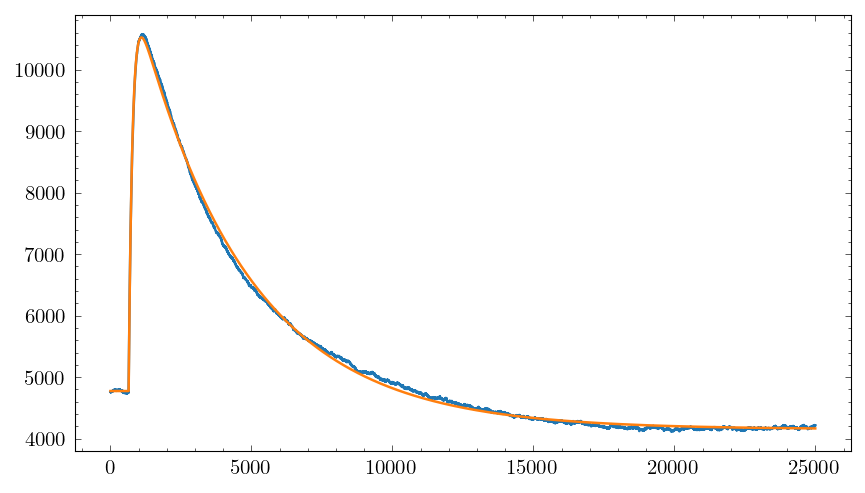

5747.918671302455 
 6787.21593390846 
##############################


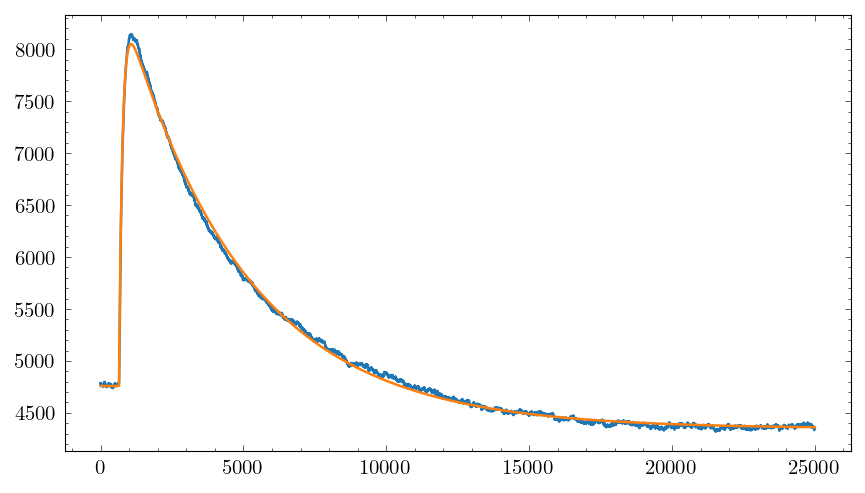

3289.9884009239204 
 3800.92969486307 
##############################


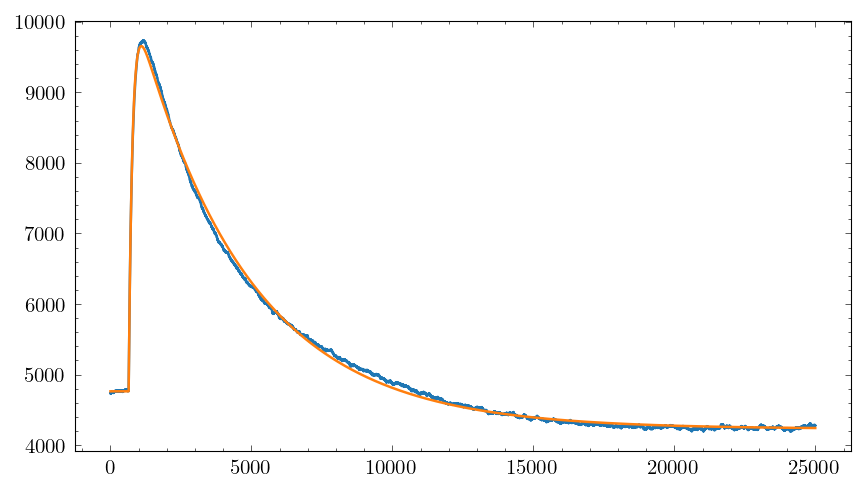

4894.3700541679555 
 5760.926584600613 
##############################


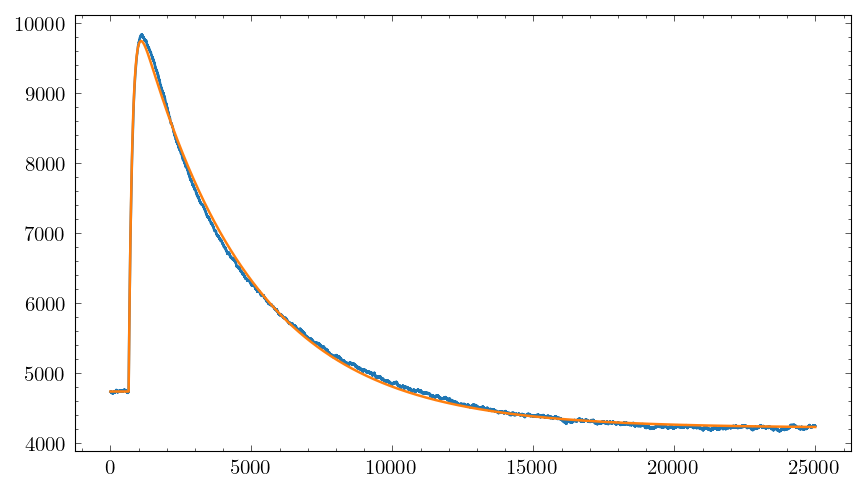

5007.034629824421 
 5874.1196133942785 
##############################


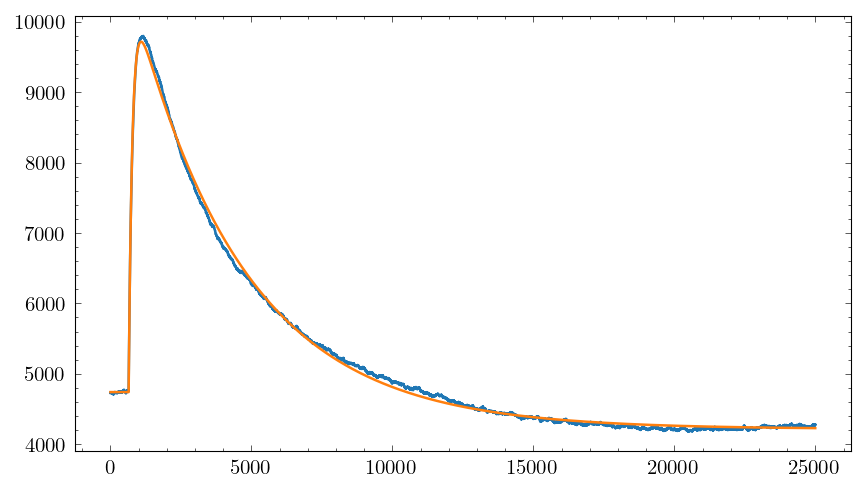

4978.488147983557 
 5833.805909870426 
##############################


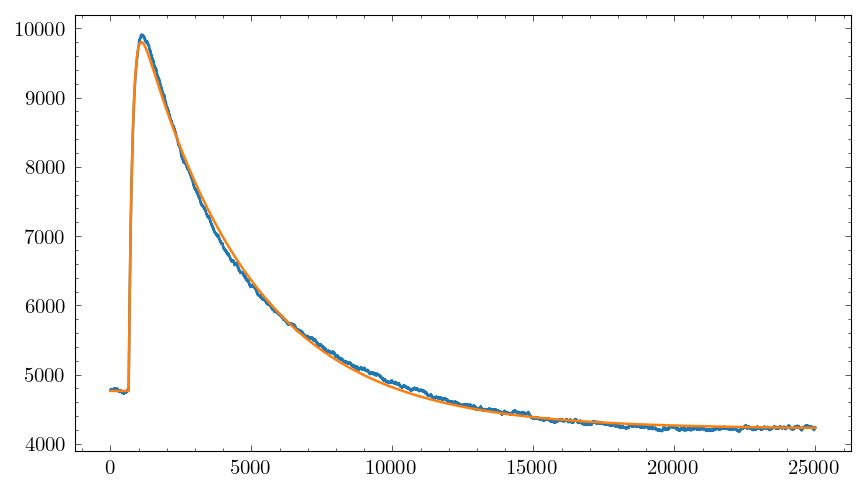

5037.531014530023 
 5942.510235318746 
##############################


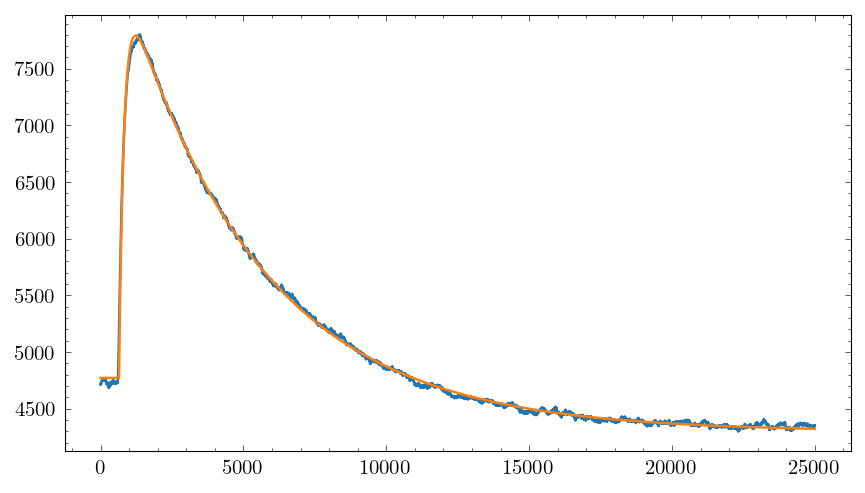

3021.270114370467 
 3626.114928912297 
##############################


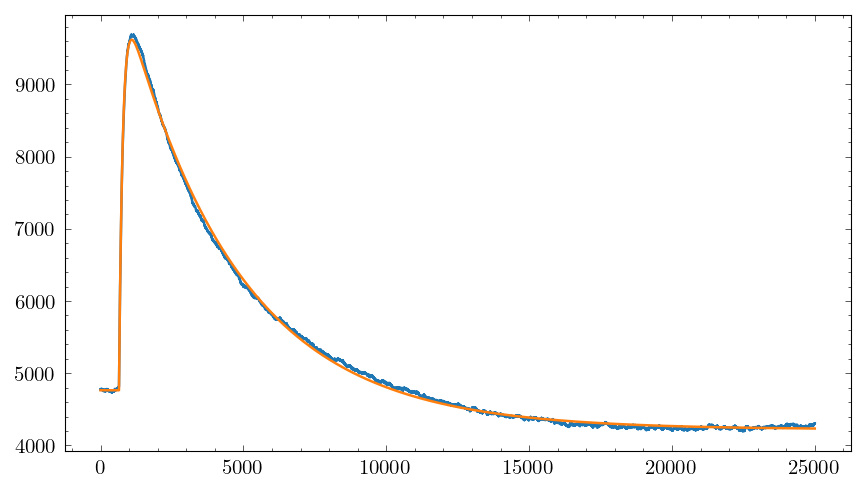

4855.031166768601 
 5703.29903107939 
##############################


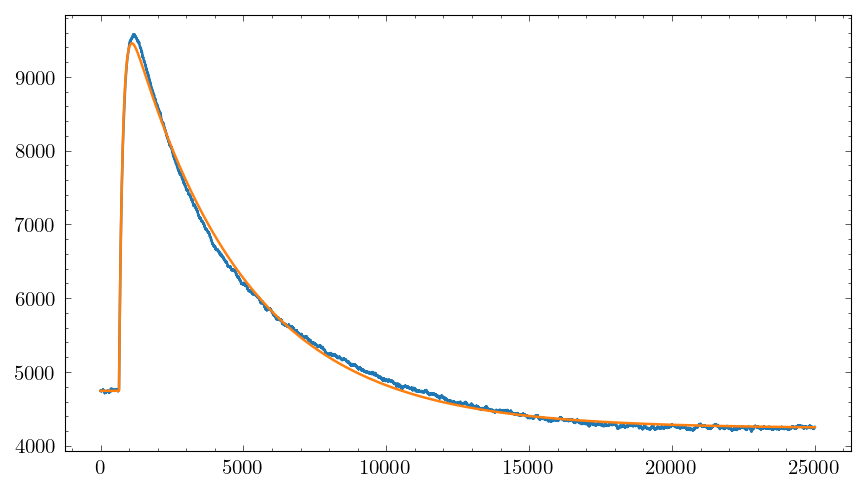

4713.117911685898 
 5530.036022191641 
##############################


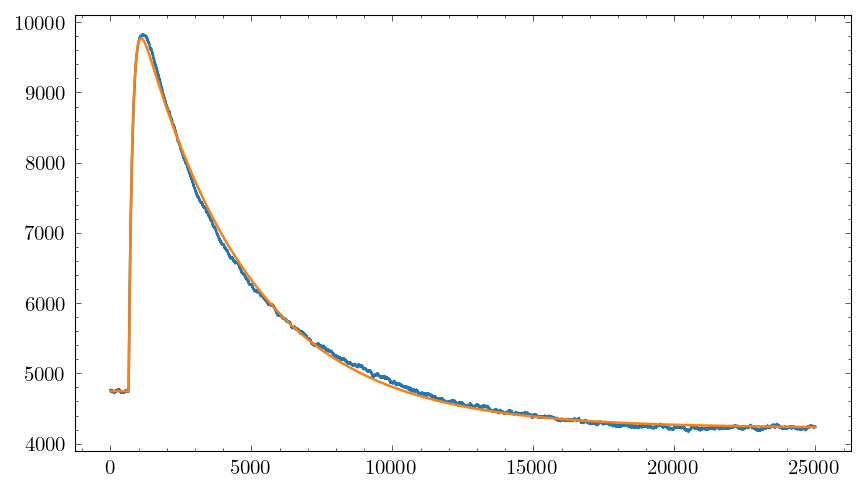

5025.212699591871 
 5911.3677419867045 
##############################


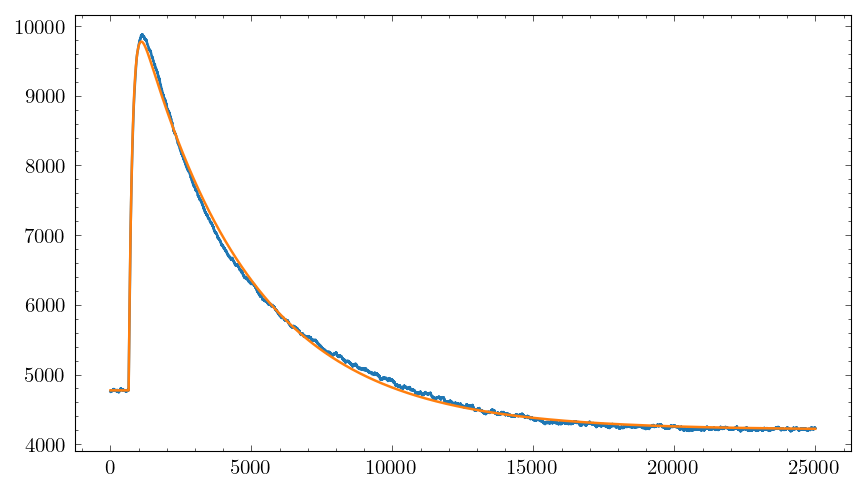

5002.946818020218 
 5887.855924452663 
##############################


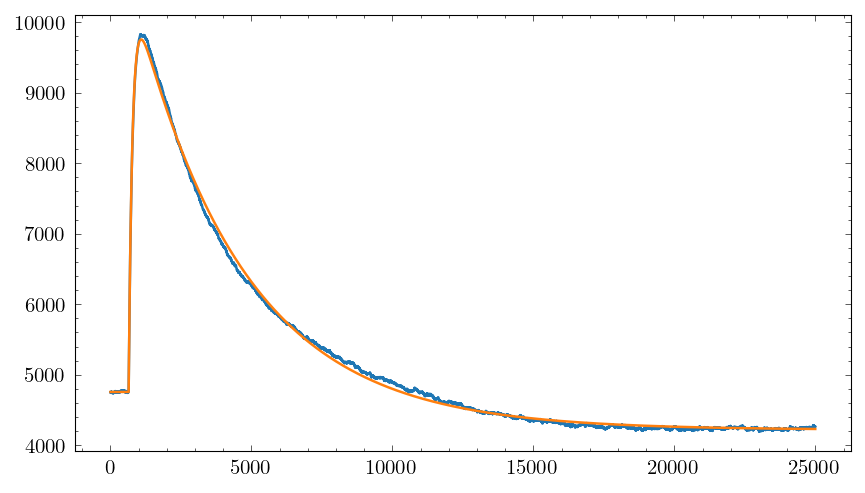

4997.574237672153 
 5884.09651962721 
##############################


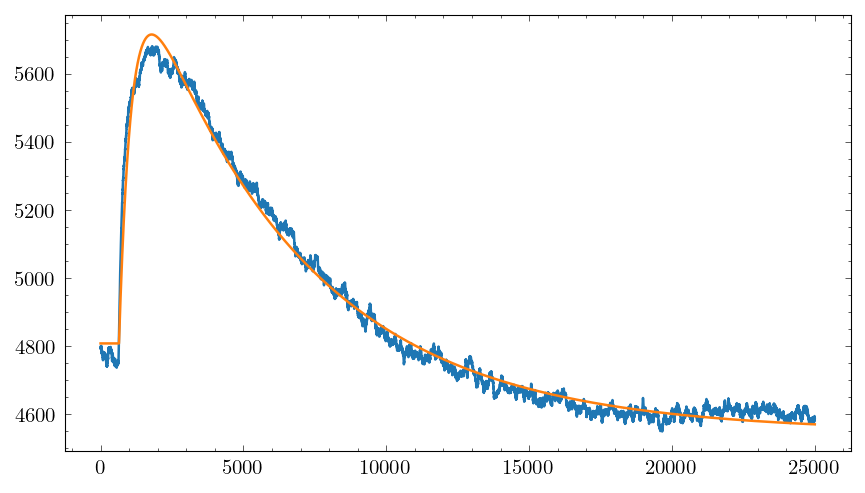

907.248287297054 
 1283.6872217744399 
##############################


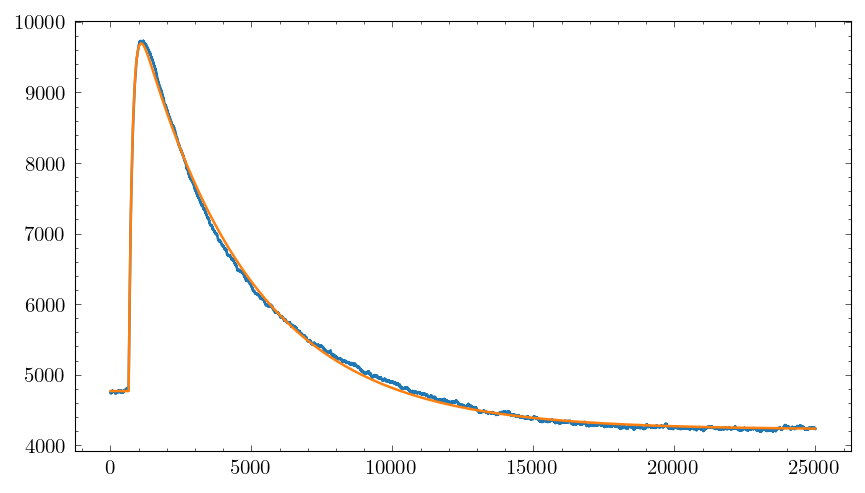

4926.226069962172 
 5792.111951785024 
##############################


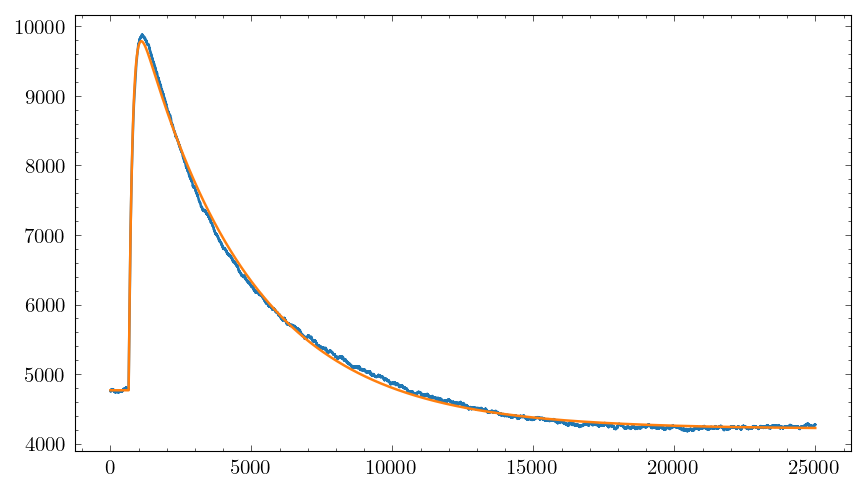

5019.980732377473 
 5918.878550561876 
##############################


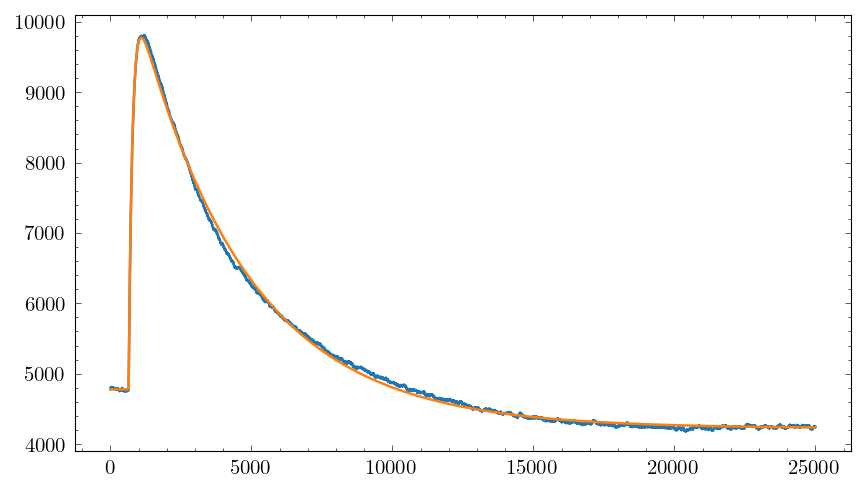

4998.944120723785 
 5894.767524402532 
##############################


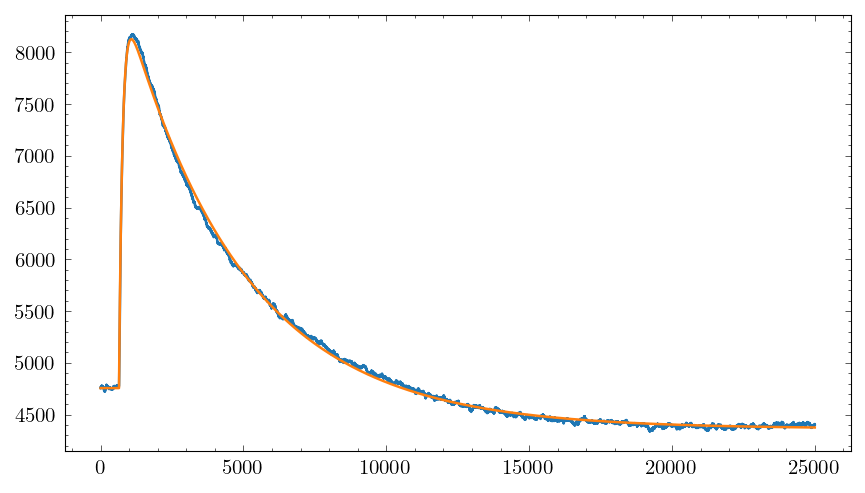

3369.5486078379 
 3910.635737314522 
##############################


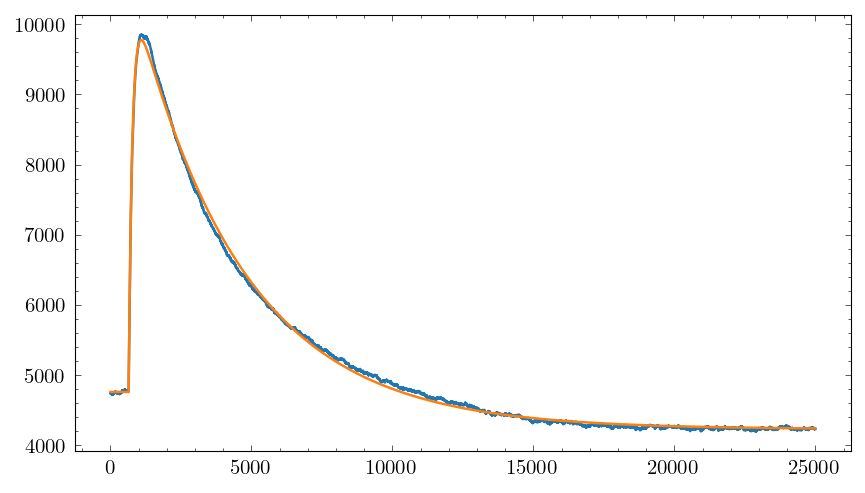

5014.38278284486 
 5907.587518326806 
##############################


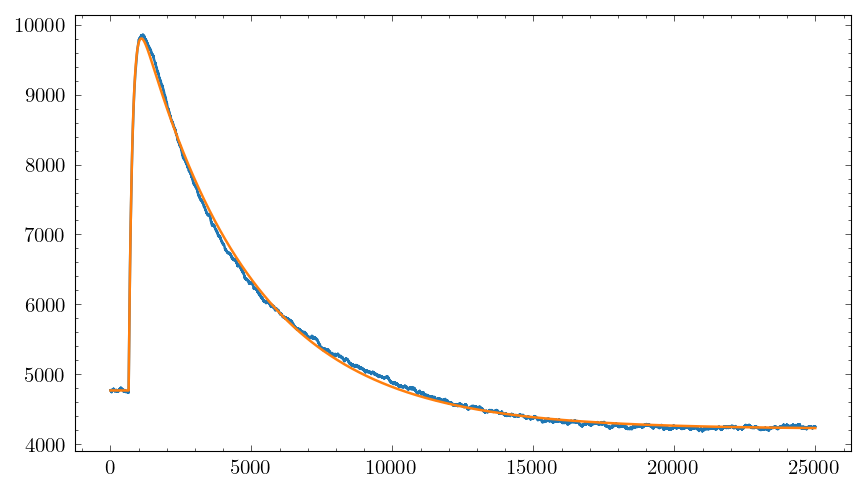

5032.72184957346 
 5926.7651593359715 
##############################


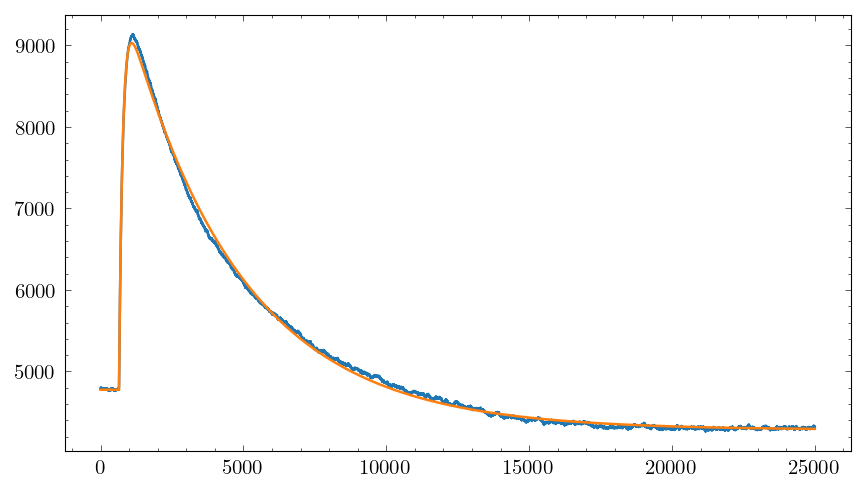

4254.889982617058 
 4987.86574327342 
##############################


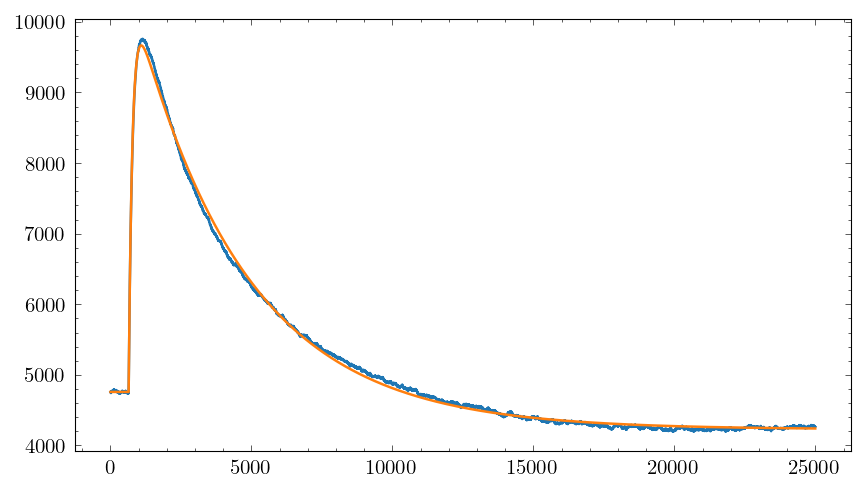

4907.3870911594695 
 5770.337418500239 
##############################


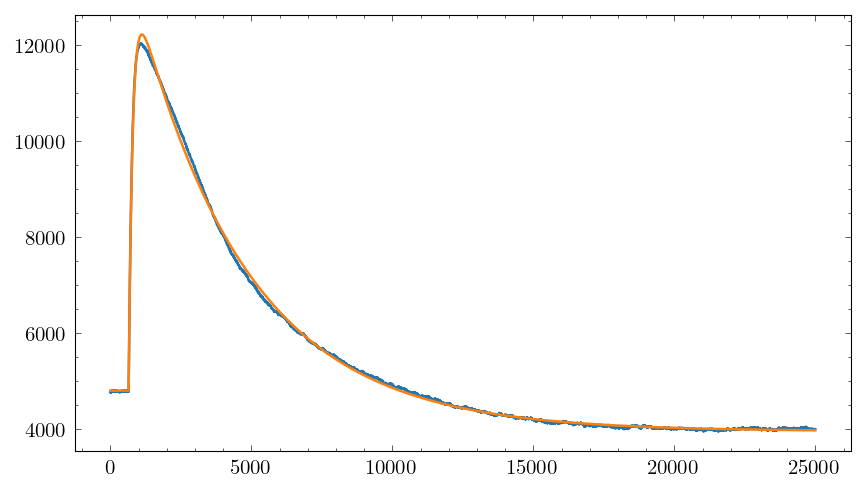

7418.461764106263 
 8800.392356222903 
##############################


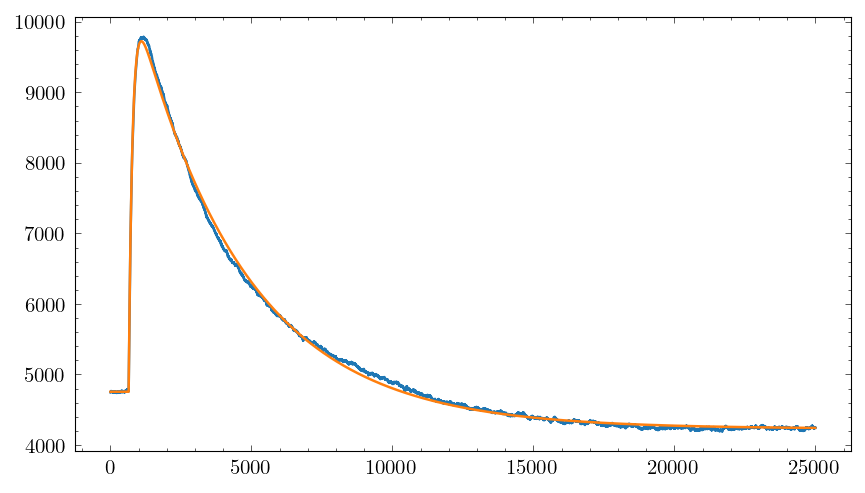

4969.476846947733 
 5864.512104554767 
##############################


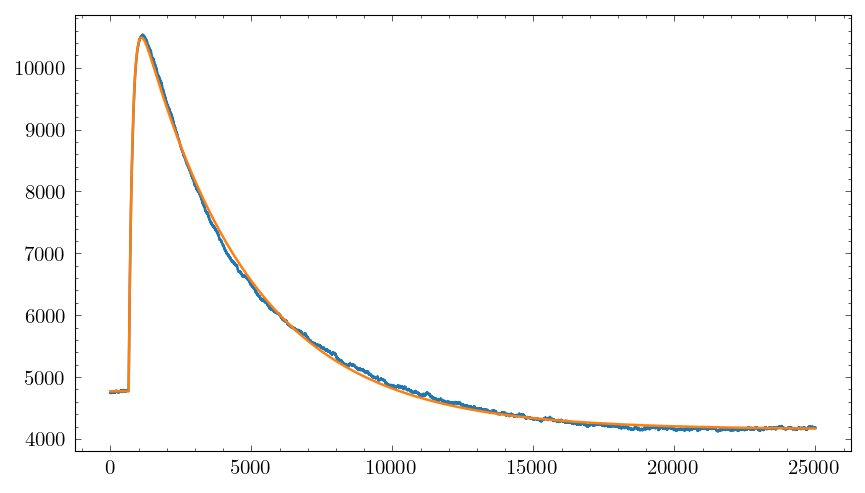

5719.316519204368 
 6761.844367579301 
##############################


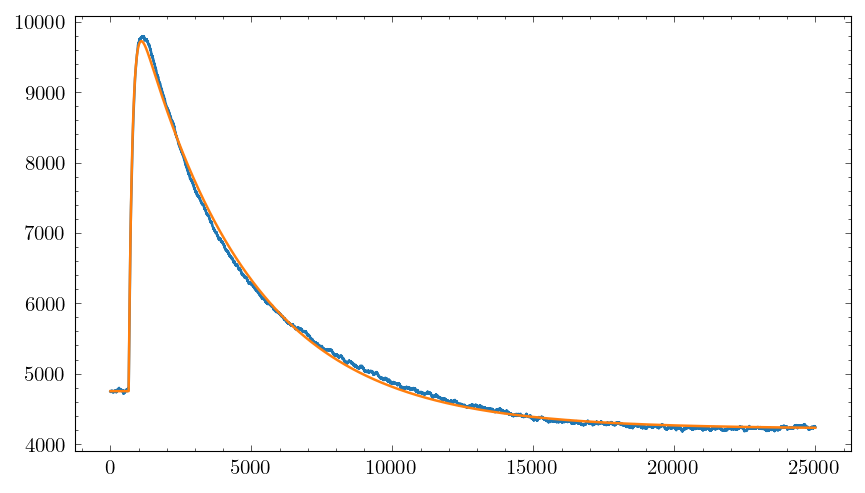

4974.533557687758 
 5853.1022002627105 
##############################


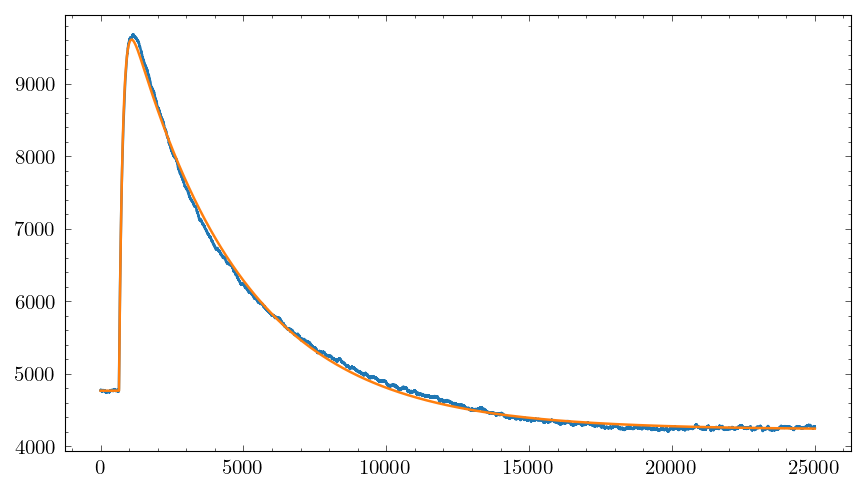

4839.779844655769 
 5681.363236435726 
##############################


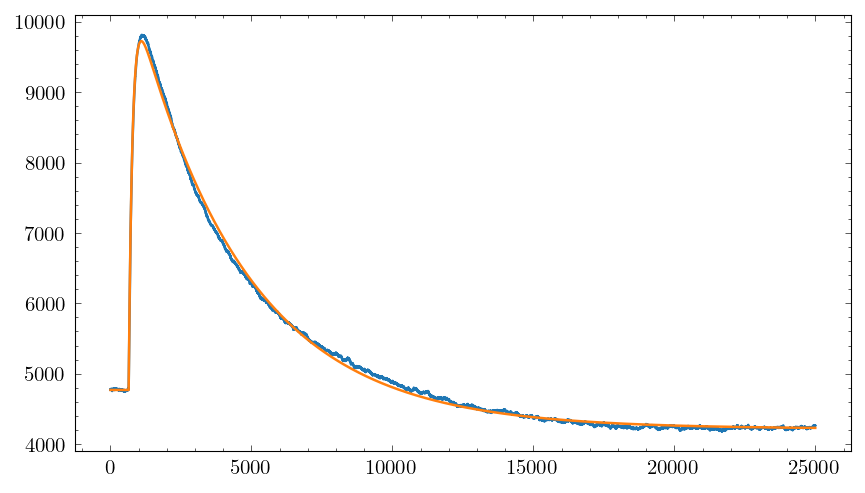

4957.342476579875 
 5838.501460236173 
##############################


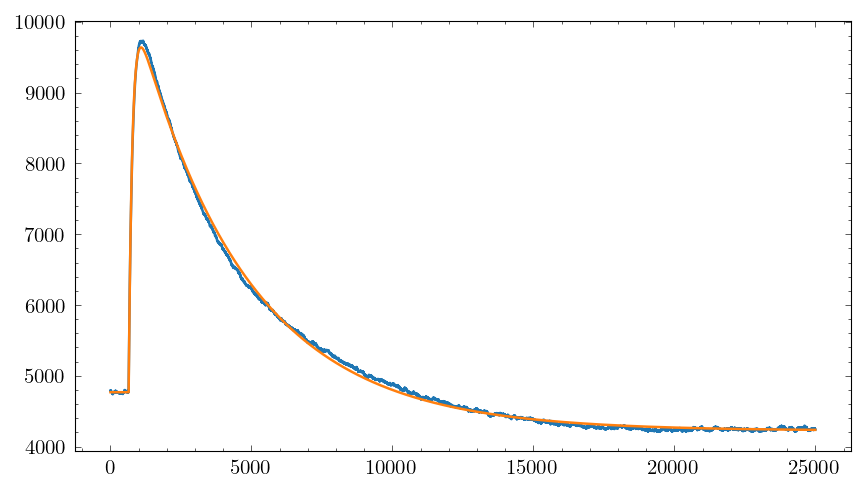

4870.975424074343 
 5713.866410413963 
##############################


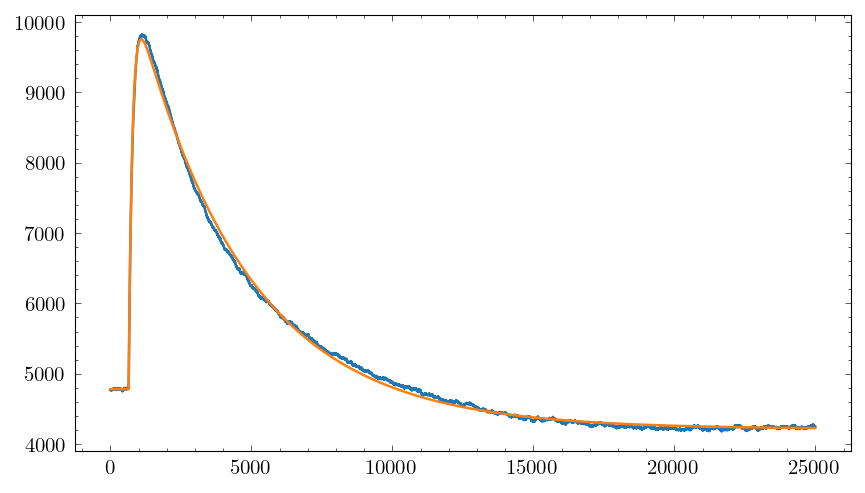

4973.903693345308 
 5862.212934923586 
##############################


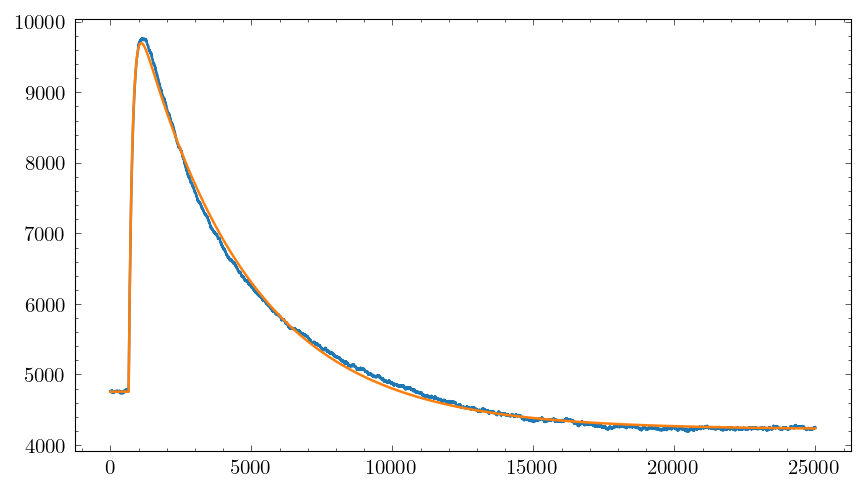

4942.496589901094 
 5822.467647769392 
##############################


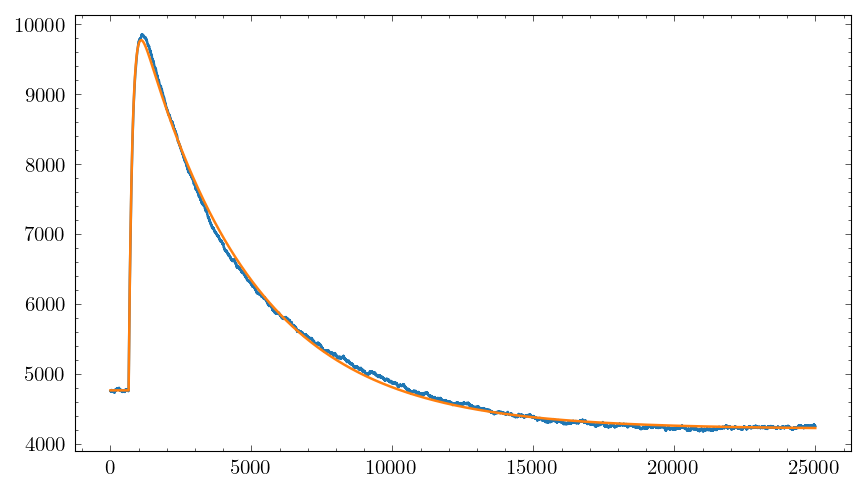

5009.59549577155 
 5886.015056575689 
##############################


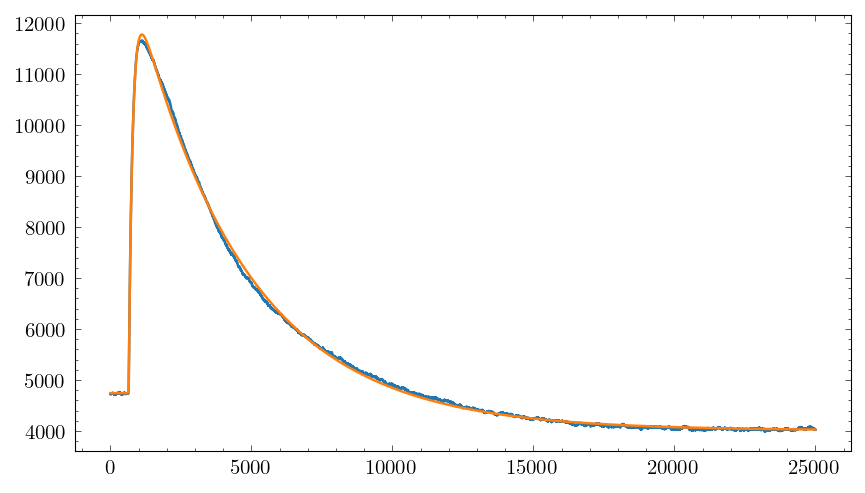

7035.554629438955 
 8344.684380896411 
##############################


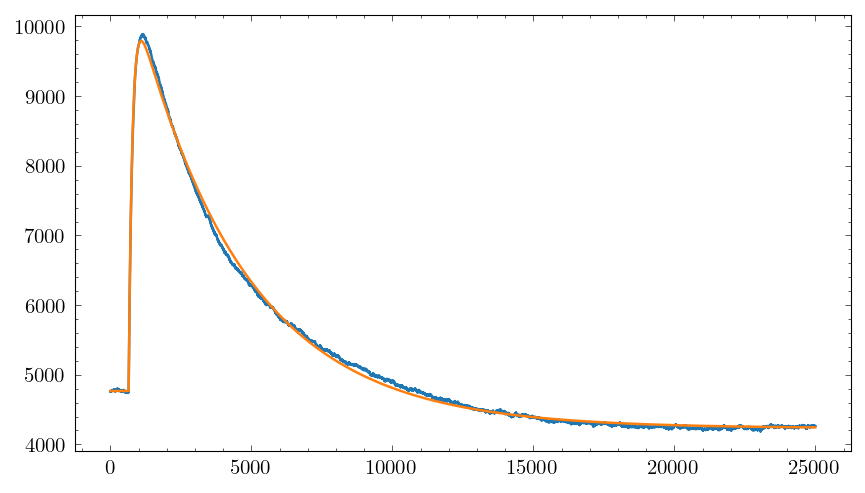

5024.732165828825 
 5917.192444671014 
##############################


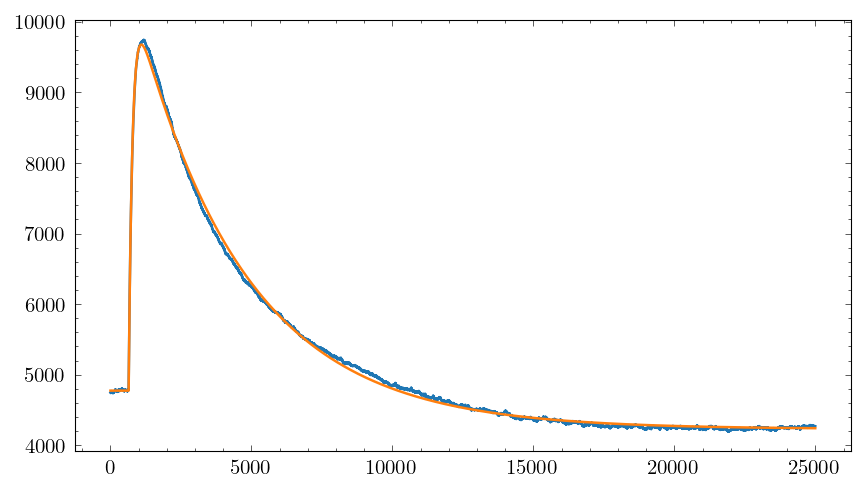

4904.517806014958 
 5788.171797916377 
##############################


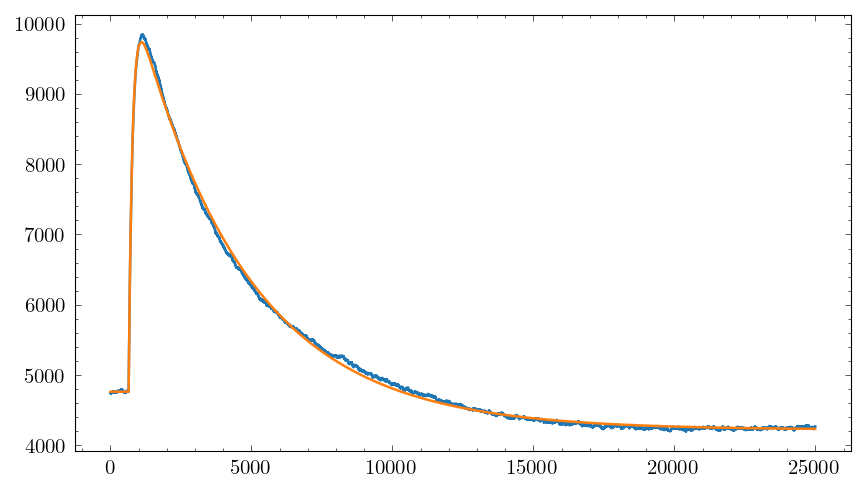

4974.4119211176285 
 5868.581855068611 
##############################


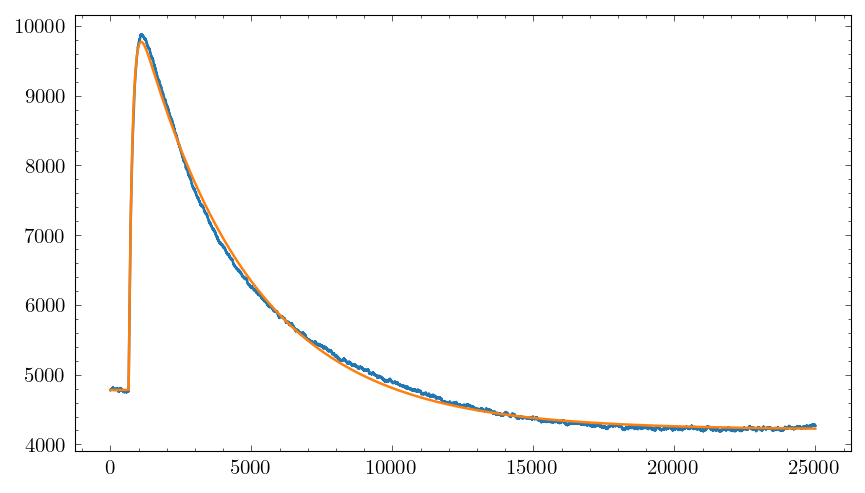

4990.390467039127 
 5870.976028934879 
##############################


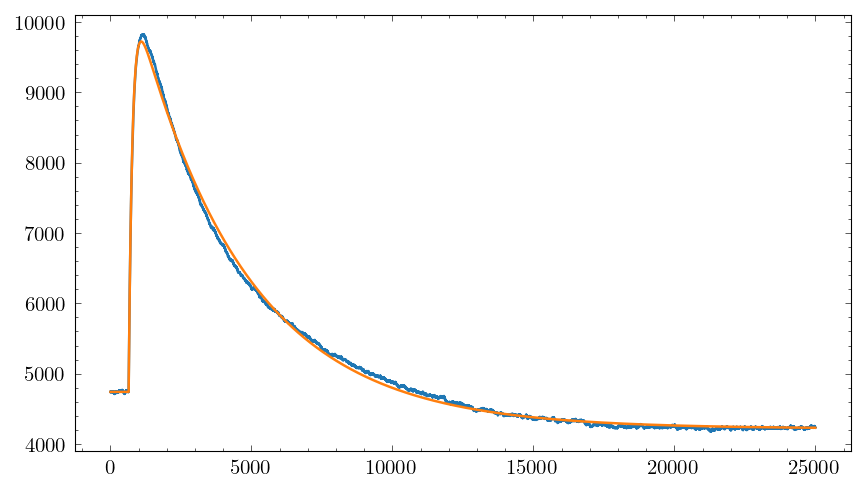

4981.001146255473 
 5857.81818271524 
##############################


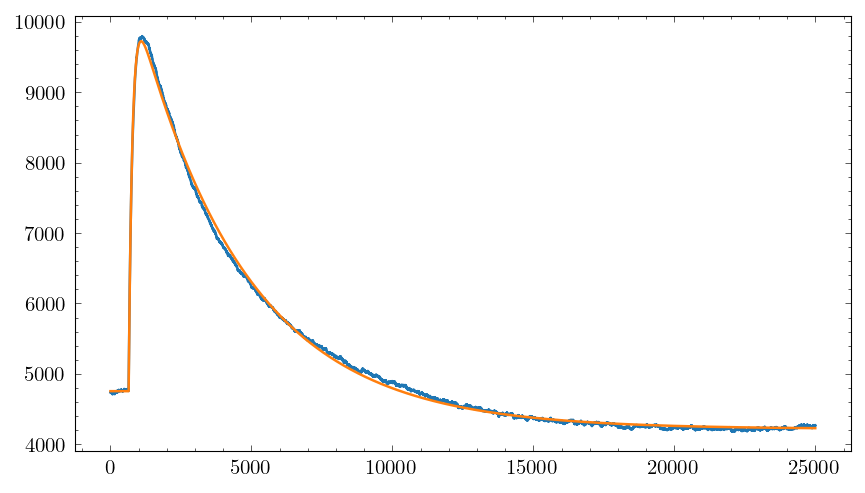

4970.229814276662 
 5844.000267325486 
##############################


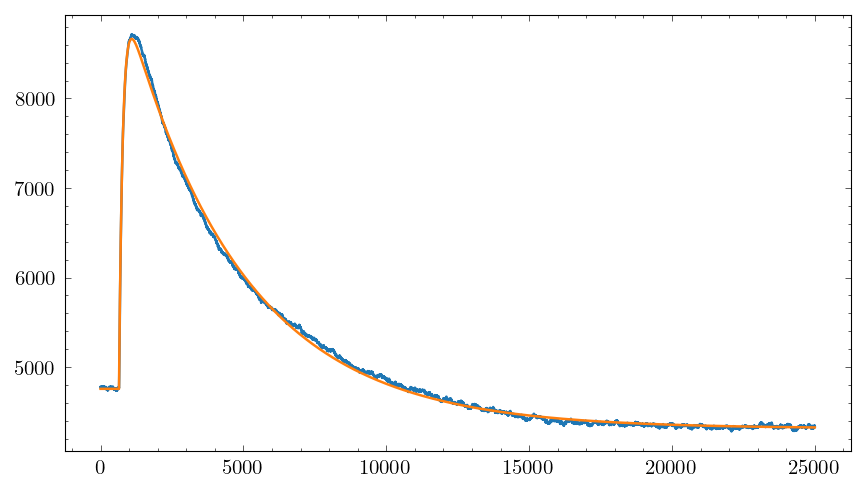

3909.2509970237397 
 4573.92934442036 
##############################


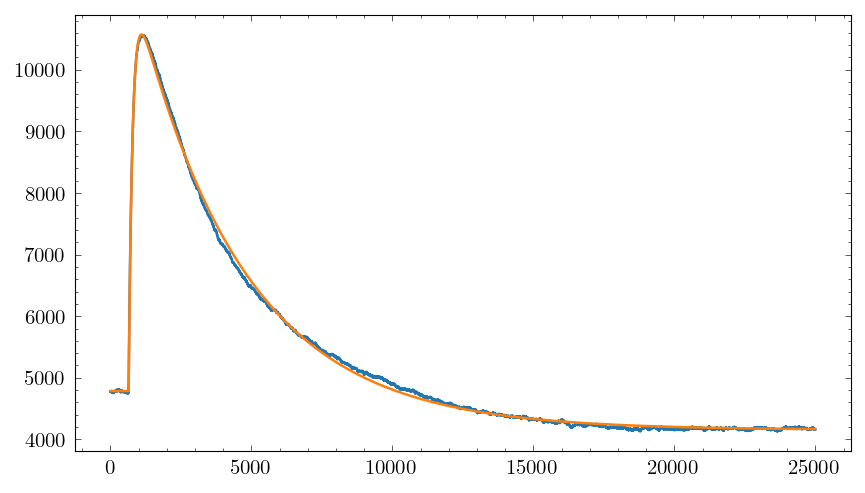

5788.320345702292 
 6863.194223661565 
##############################


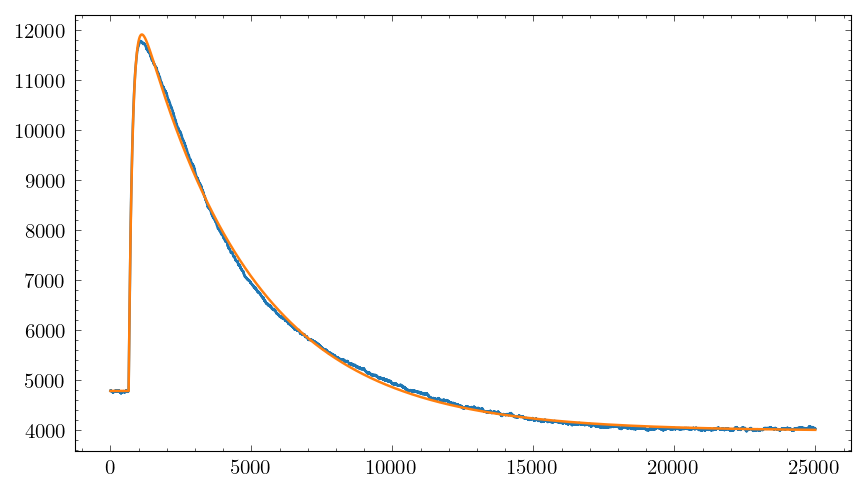

7127.910060331854 
 8443.918279266874 
##############################


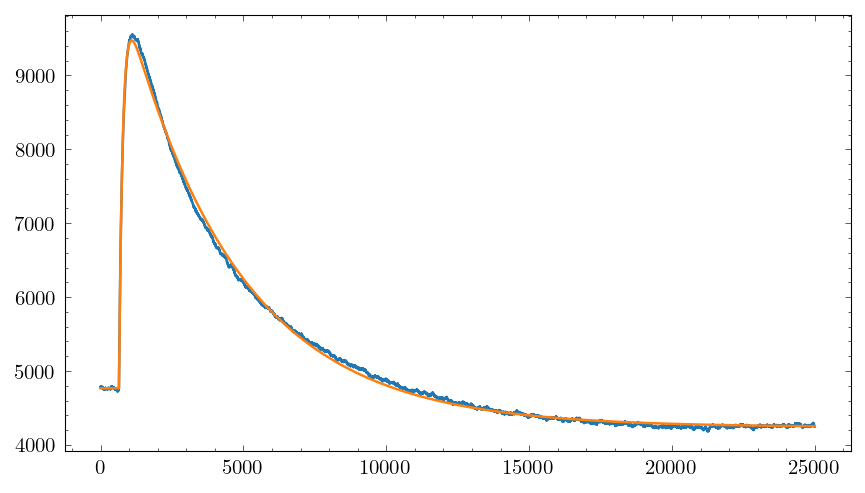

4709.0504518040425 
 5528.67664382499 
##############################


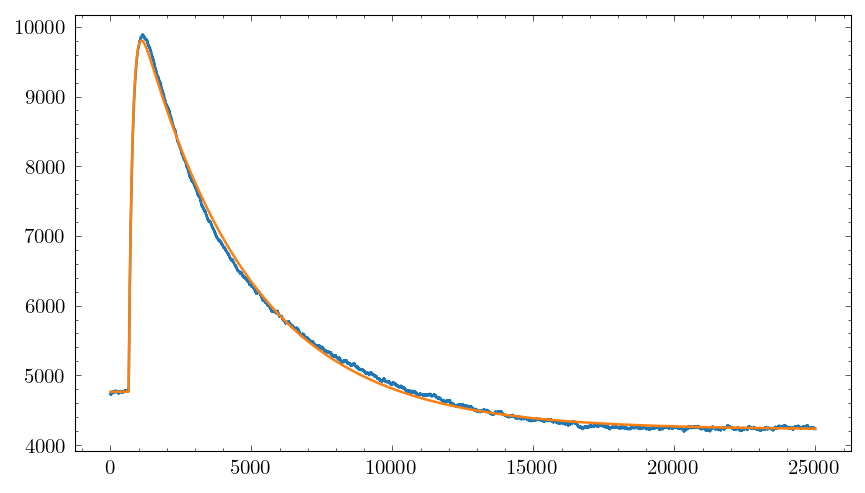

5039.371398500314 
 5957.984156163898 
##############################


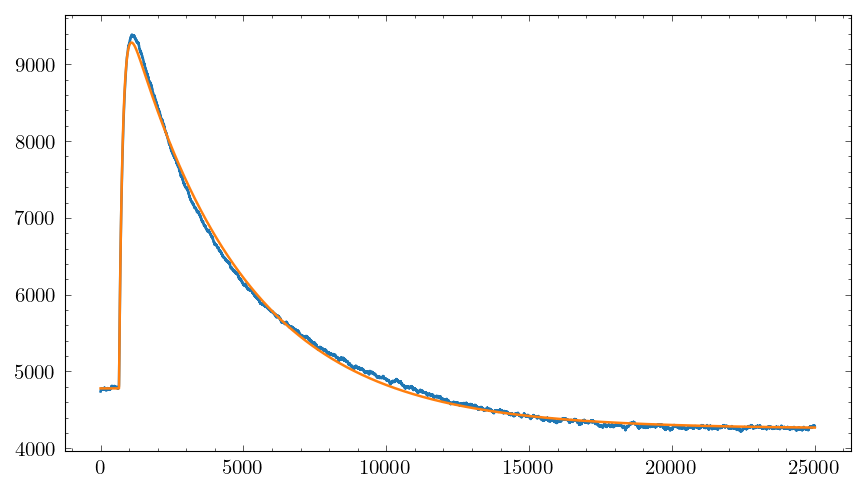

4504.405139903209 
 5263.29337866425 
##############################


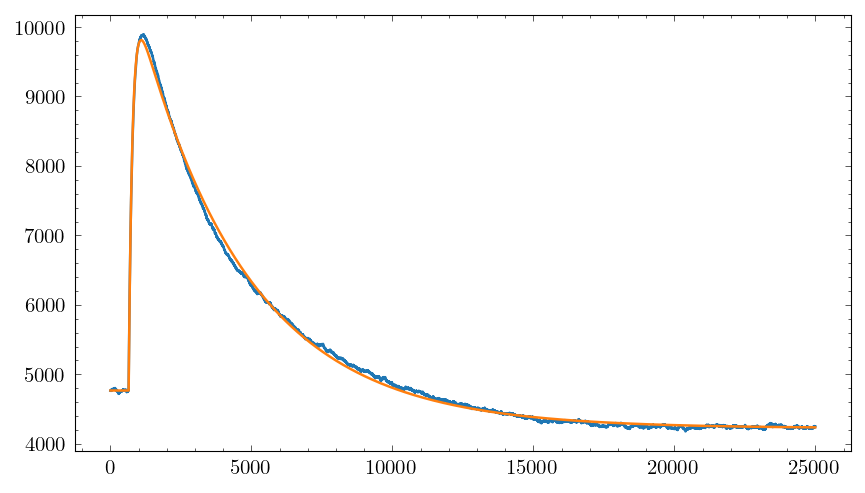

5044.3263875840275 
 5939.806712092288 
##############################


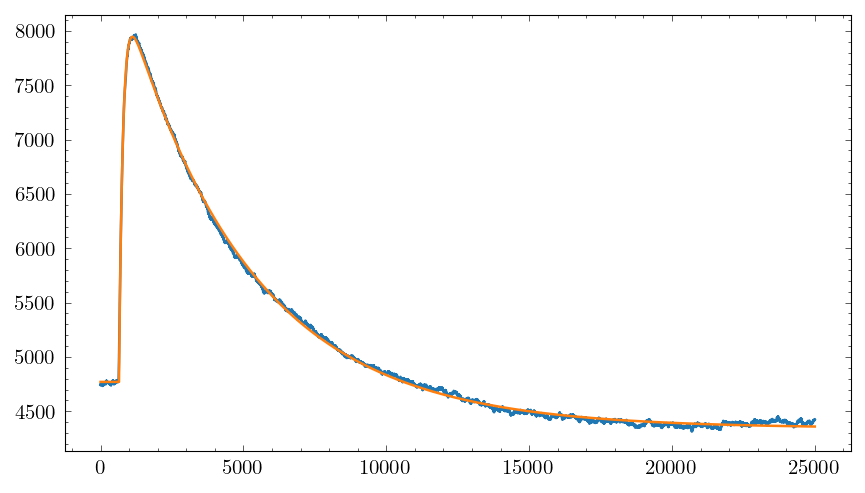

3175.7781727085885 
 3713.506421902677 
##############################


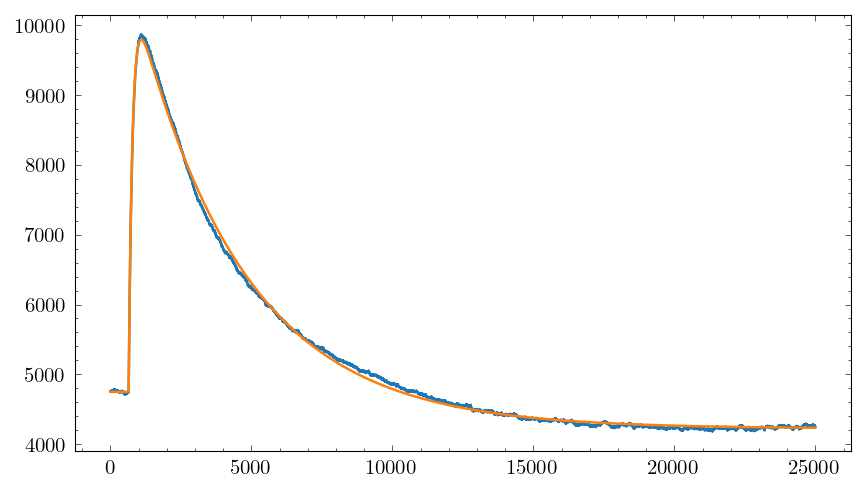

5042.1868529491485 
 5957.114017960881 
##############################


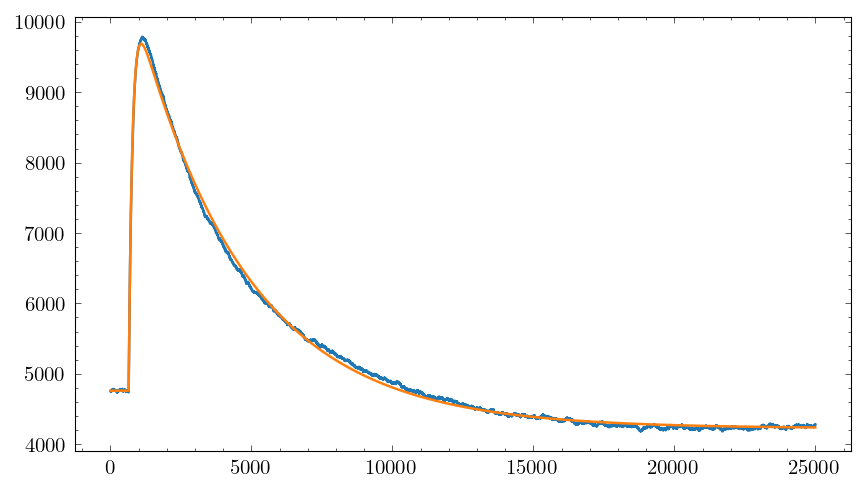

4928.852006526997 
 5797.880220298463 
##############################


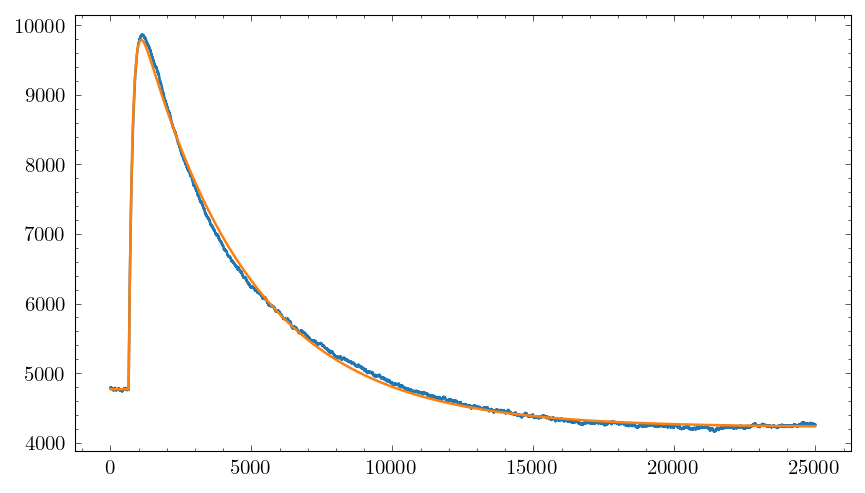

5019.876421149305 
 5921.154552891406 
##############################


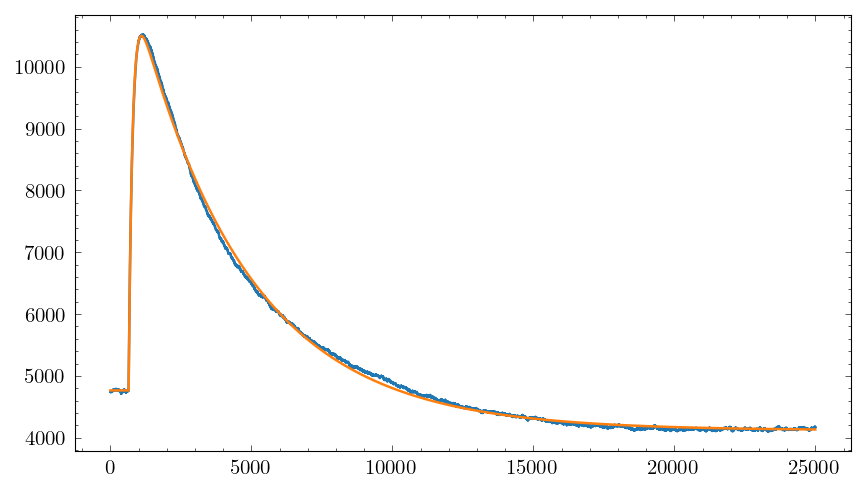

5735.133434448099 
 6772.701063313053 
##############################


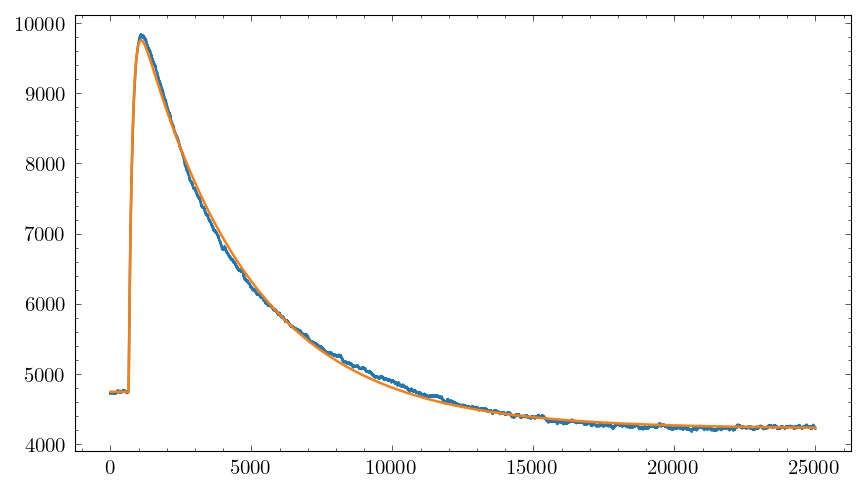

5006.653885992744 
 5882.432637065844 
##############################


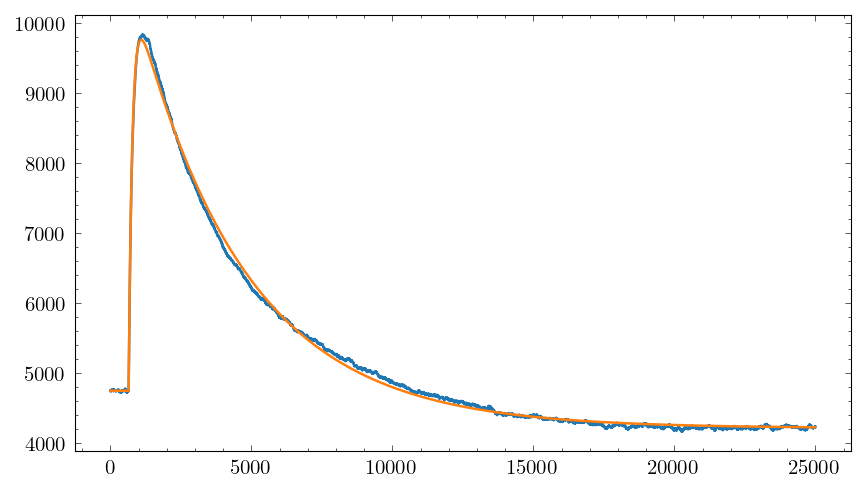

5015.468361335468 
 5906.8349284470805 
##############################


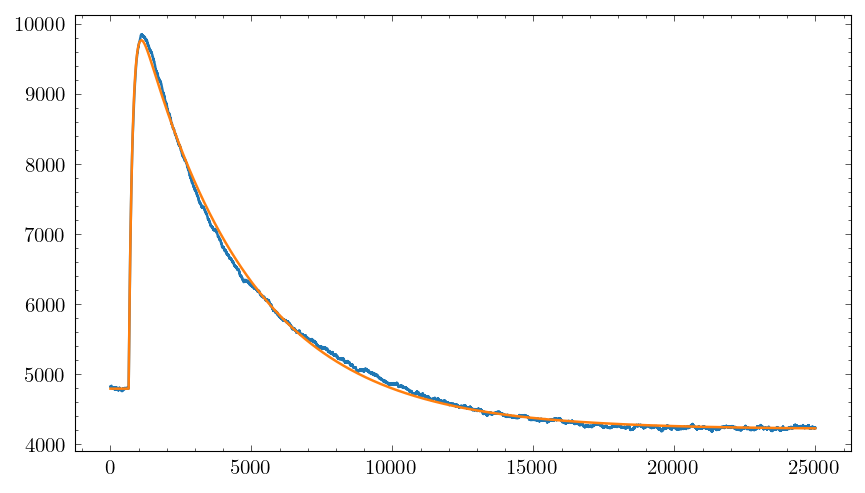

4972.7015881997295 
 5879.707094085171 
##############################


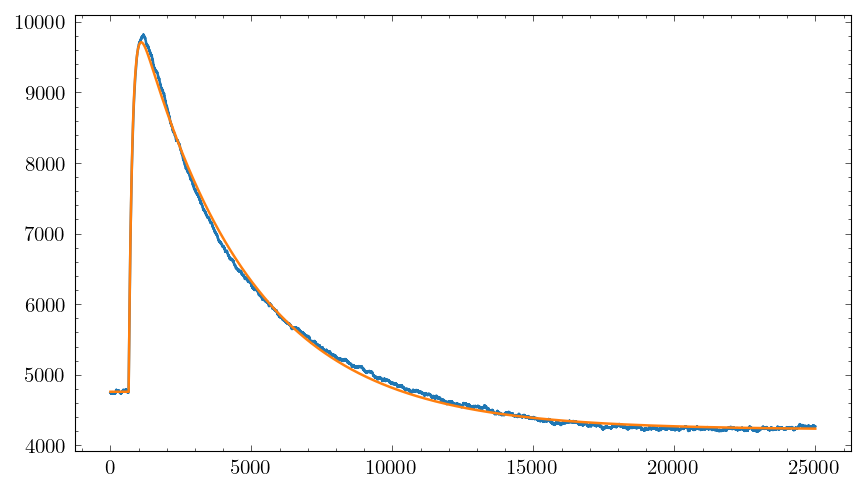

4951.645792323645 
 5819.628057519331 
##############################


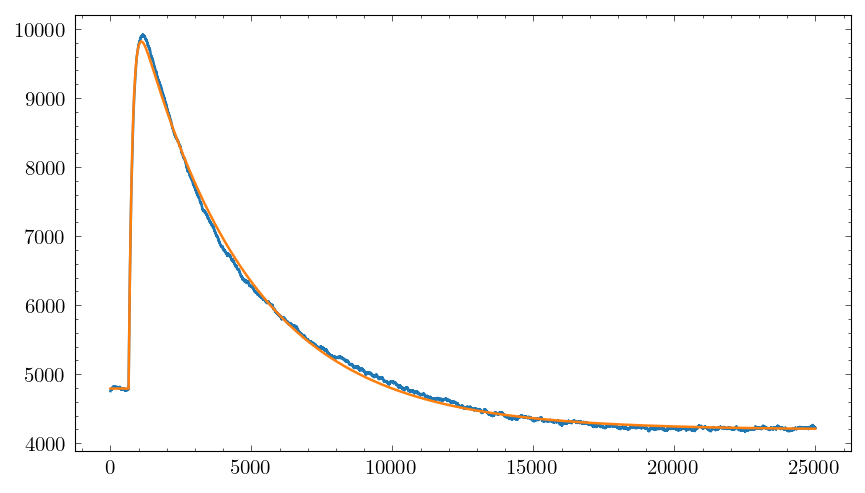

5026.950677038026 
 5932.924826286393 
##############################


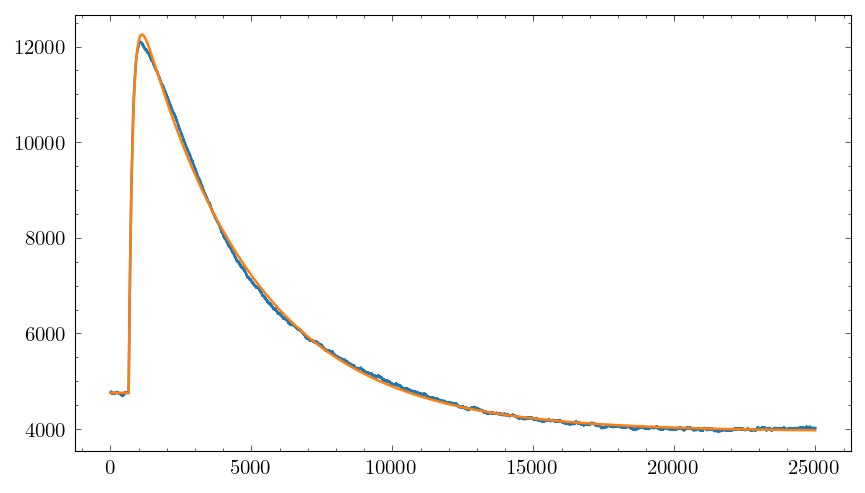

7494.791204968377 
 8866.213166577567 
##############################


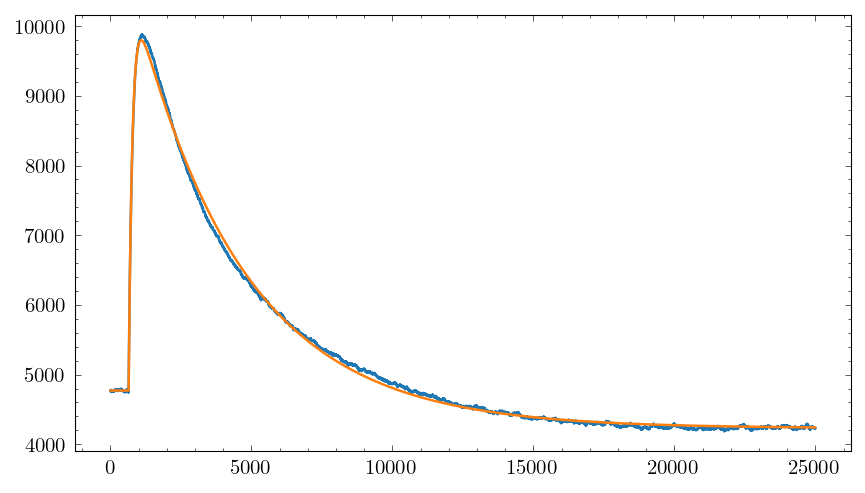

5025.953664290134 
 5922.131585273959 
##############################


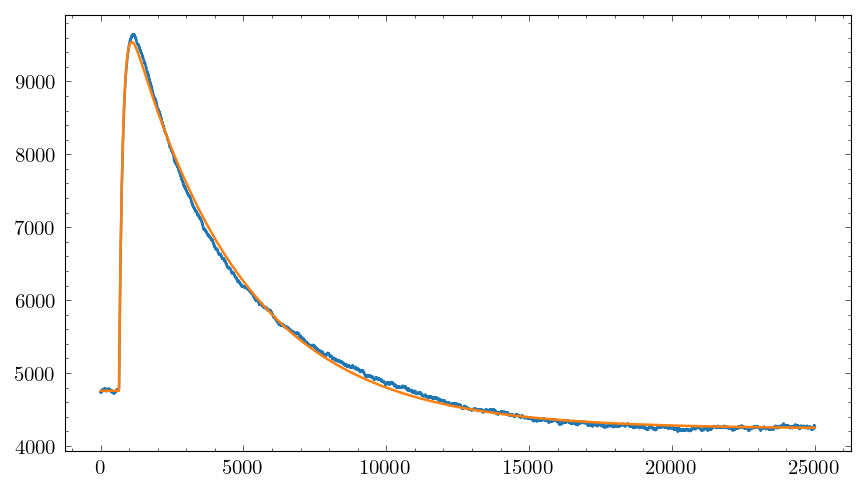

4783.235213690331 
 5631.217412302741 
##############################


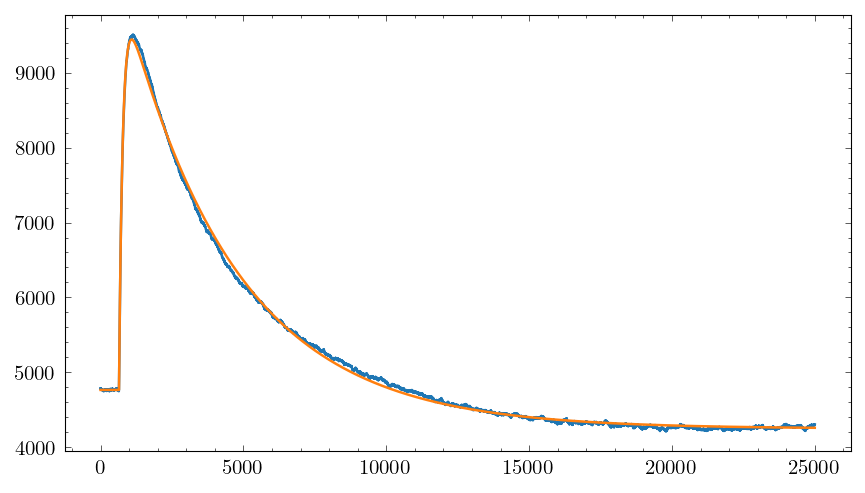

4677.980910640136 
 5498.248282614331 
##############################


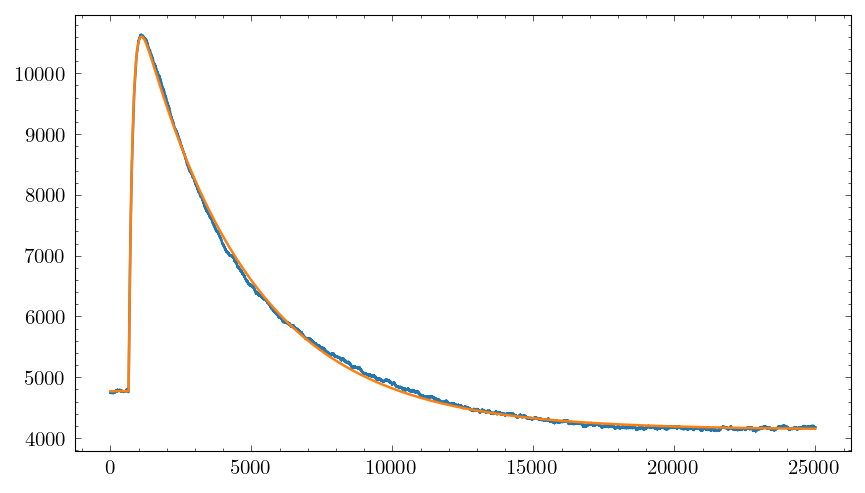

5833.078185256946 
 6897.467137781042 
##############################


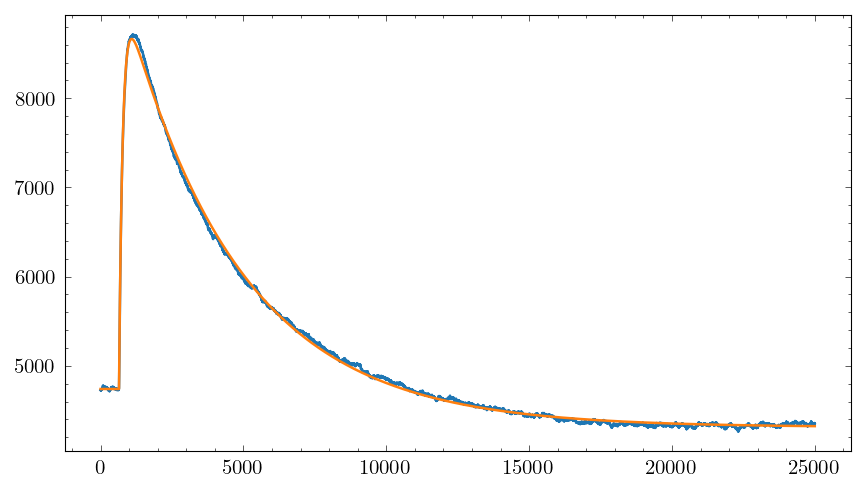

3922.8411088207604 
 4587.617734362542 
##############################


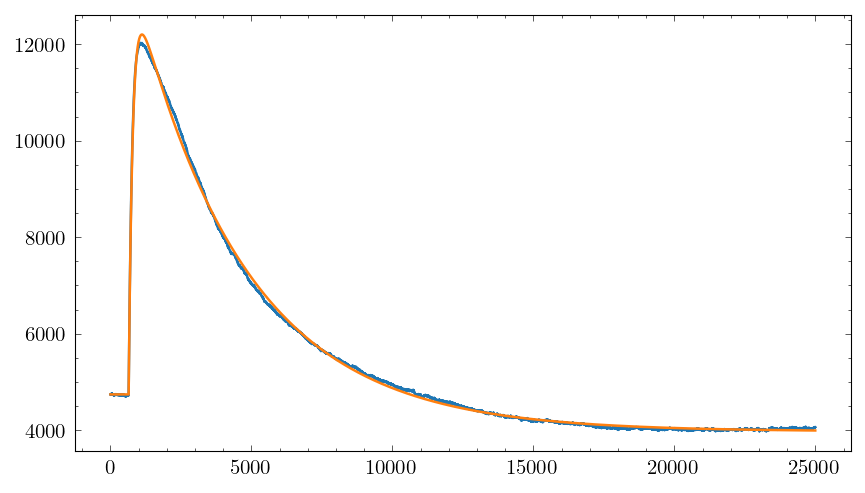

7463.140847854148 
 8849.35549367068 
##############################


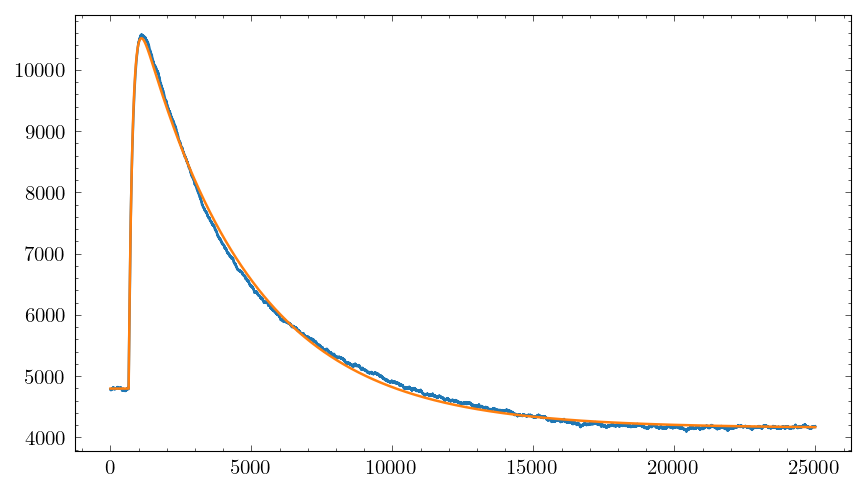

5719.365395090418 
 6763.539480988947 
##############################


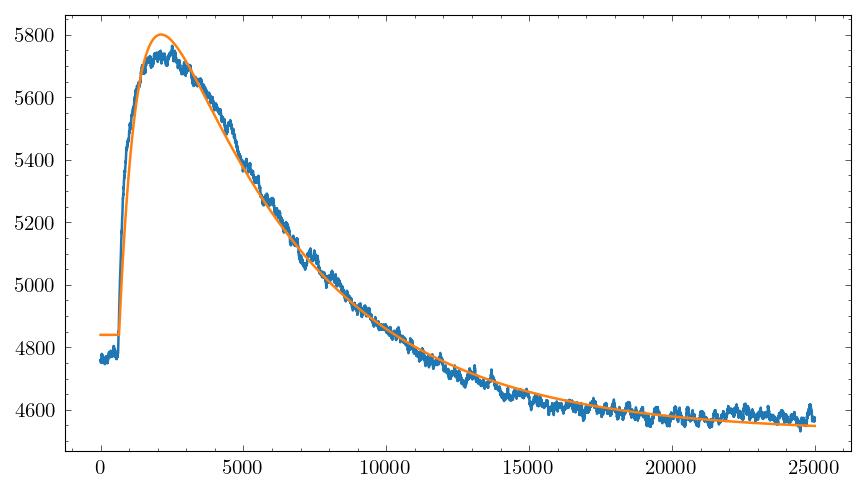

961.1082415258497 
 1619.4843860407984 
##############################


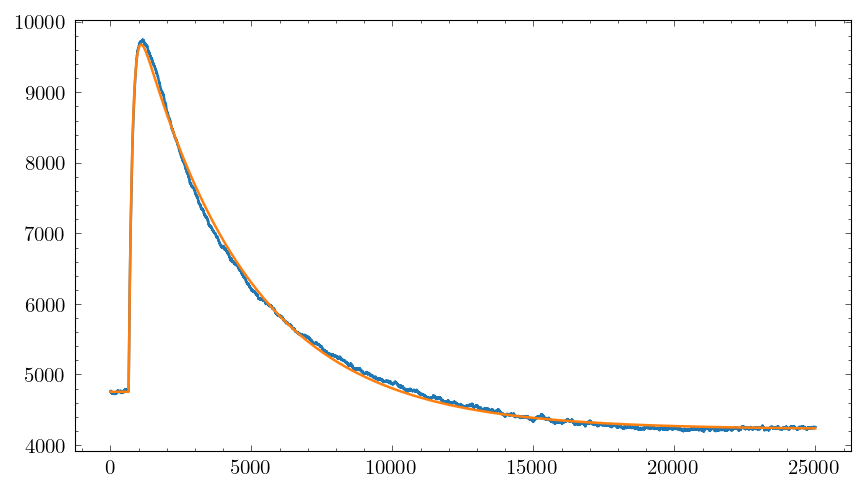

4921.912880769054 
 5784.675957669396 
##############################


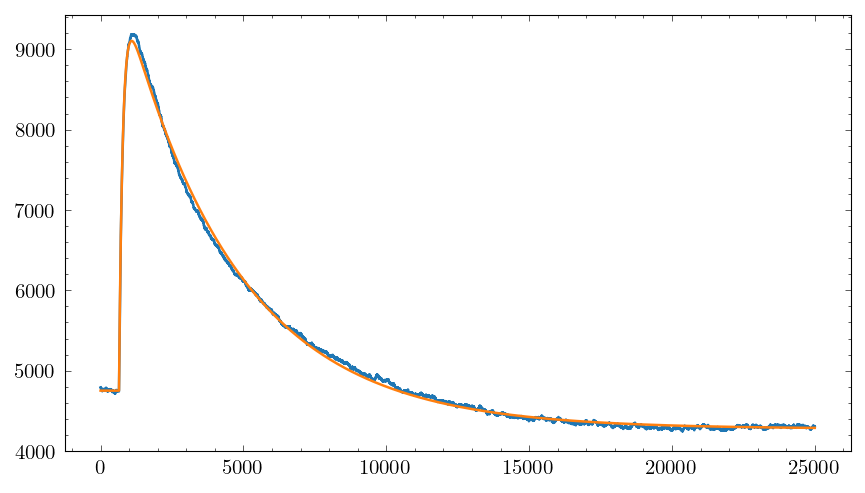

4351.677573111092 
 5106.561409772174 
##############################


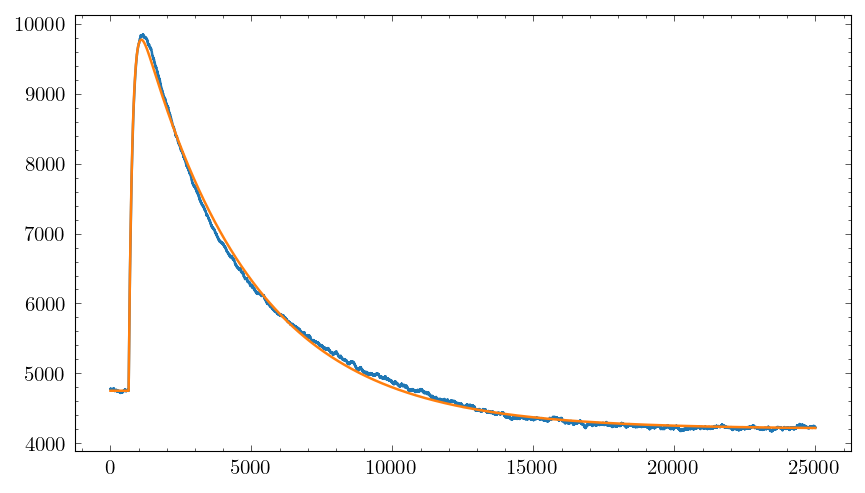

5022.311996479393 
 5918.548202054835 
##############################


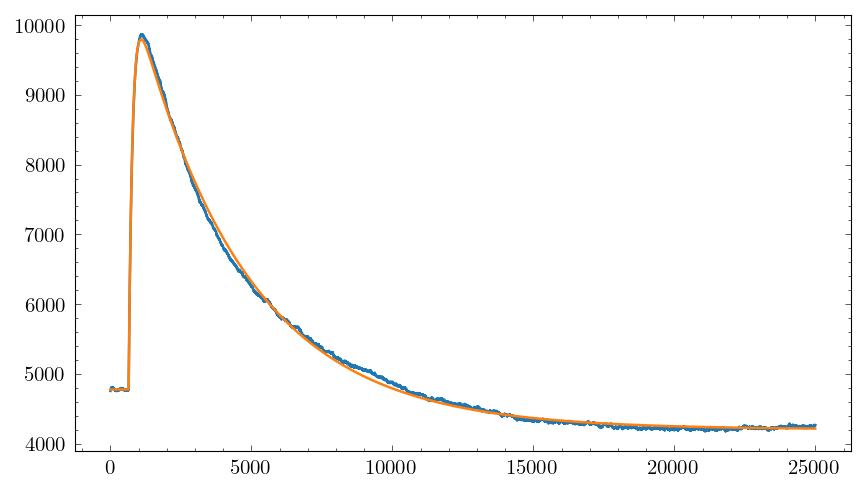

5021.056593332709 
 5916.576251703666 
##############################


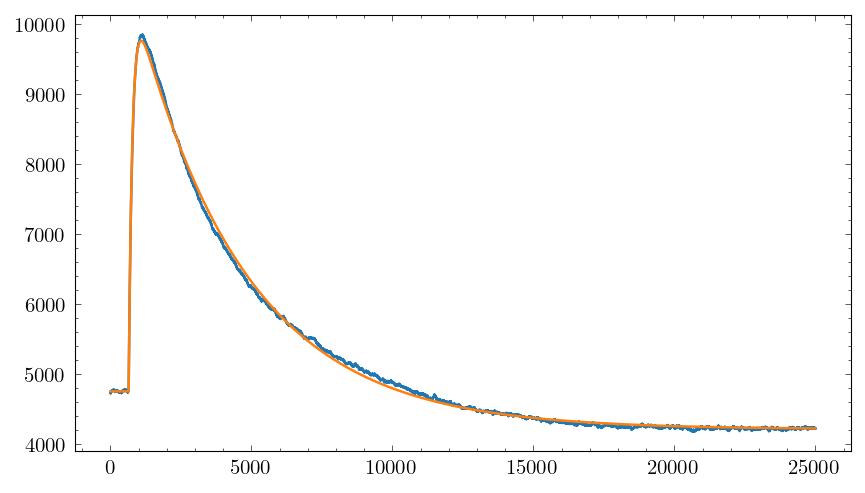

5009.177890634971 
 5889.443051482055 
##############################


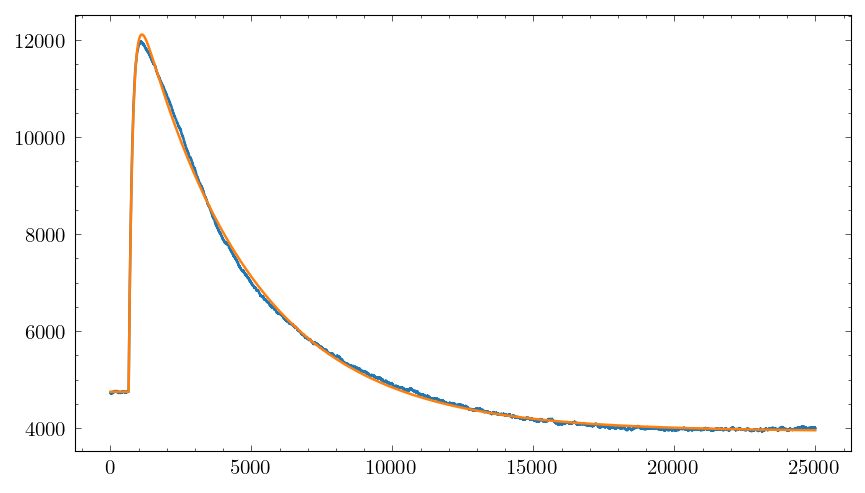

7366.993992790242 
 8732.324473719189 
##############################


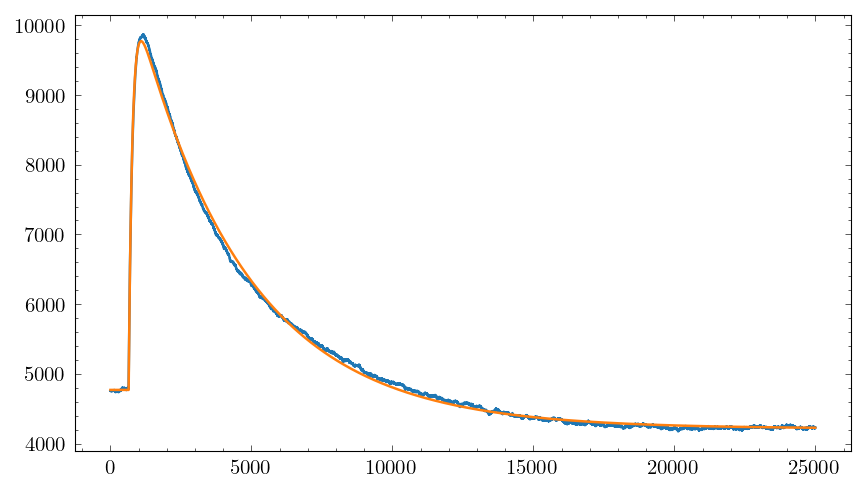

5000.629647231011 
 5875.245626372476 
##############################


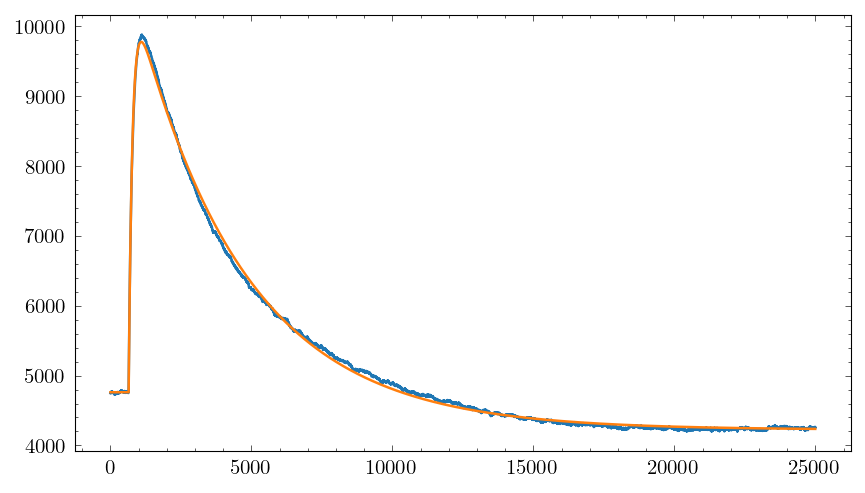

5015.925363800926 
 5907.043947934683 
##############################


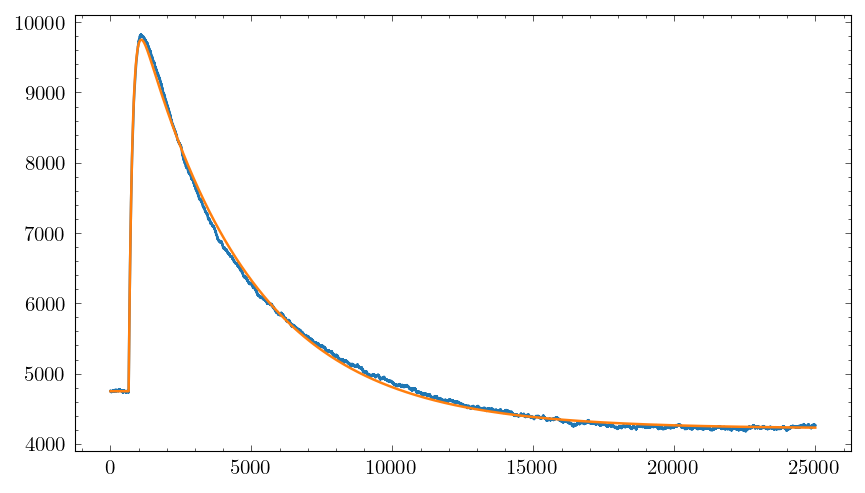

5001.327486426537 
 5888.166425059185 
##############################


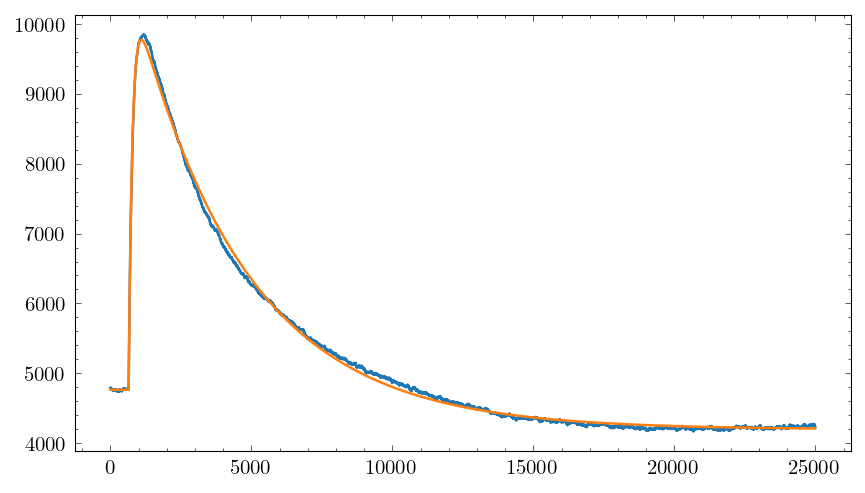

5008.216380049236 
 5896.730975590896 
##############################


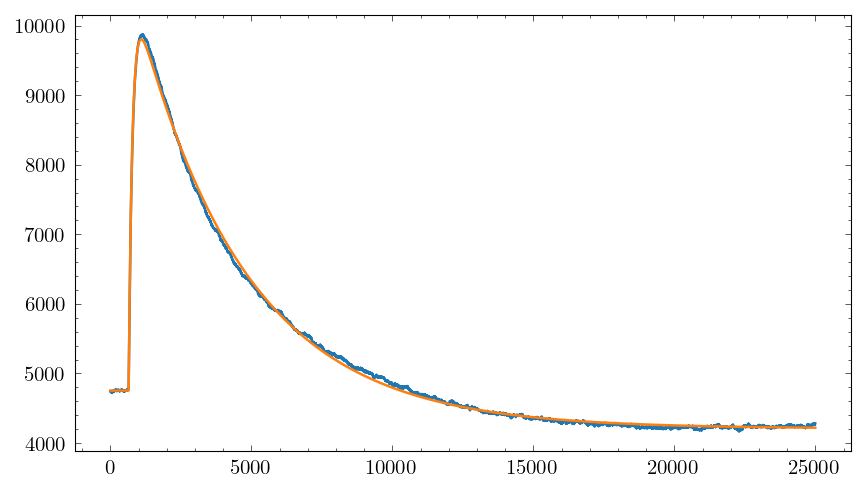

5046.723061959428 
 5946.0881490334 
##############################


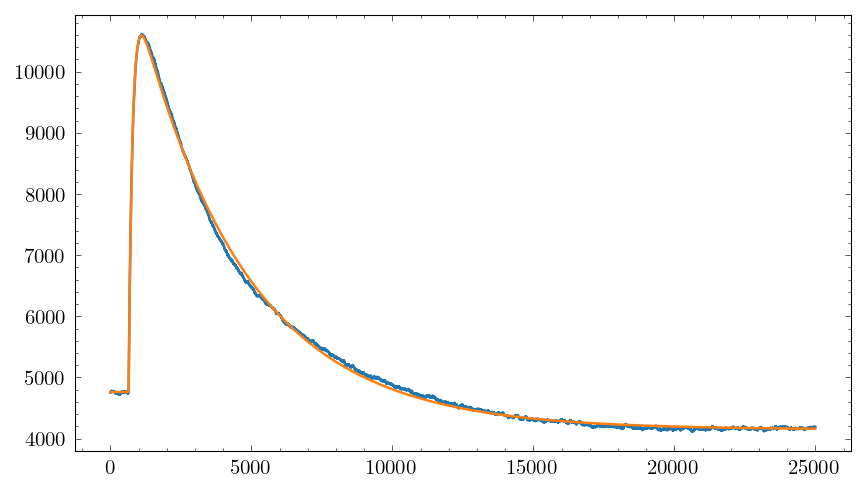

5828.227646856895 
 6902.742848106314 
##############################


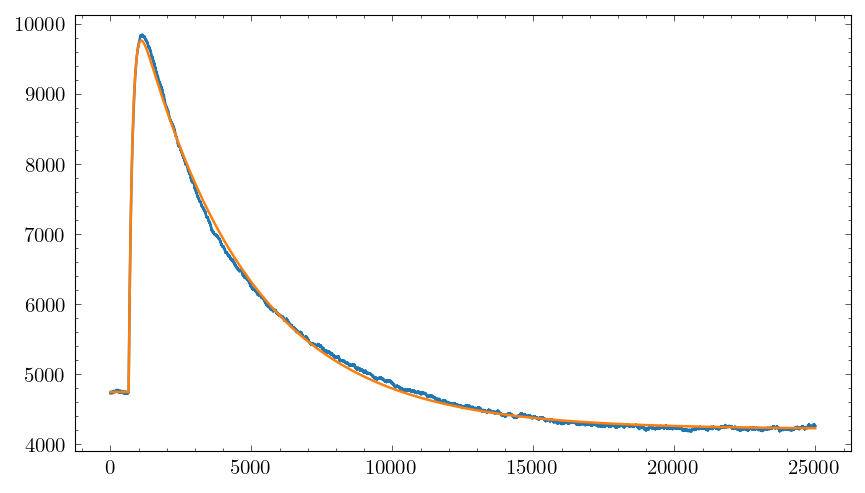

5018.934507155324 
 5914.575989625195 
##############################


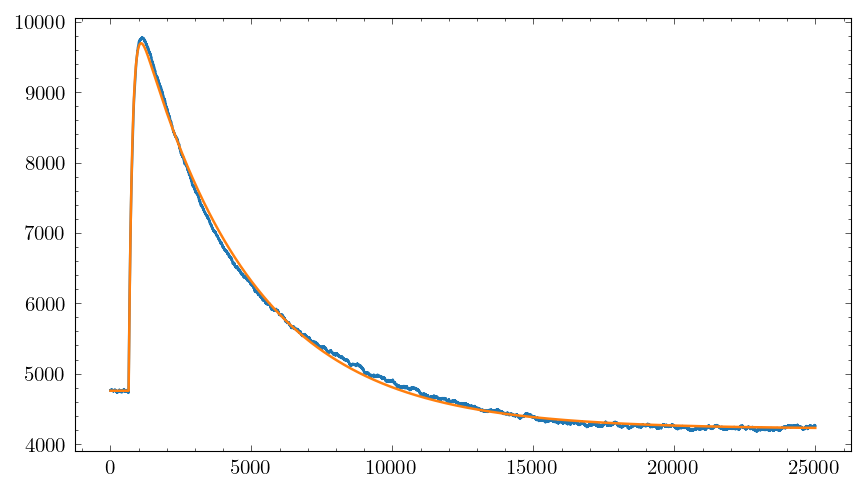

4939.404337034185 
 5795.380804051639 
##############################


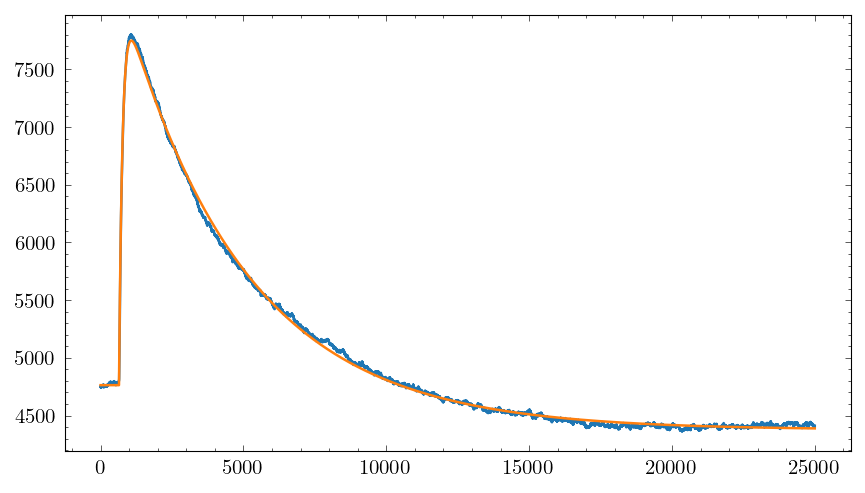

2985.566746215214 
 3451.378372954885 
##############################


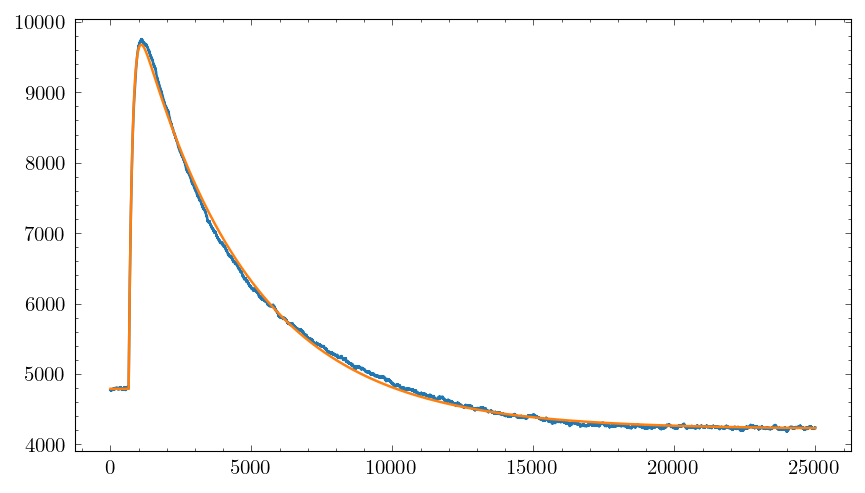

4887.22999568201 
 5748.152069576746 
##############################


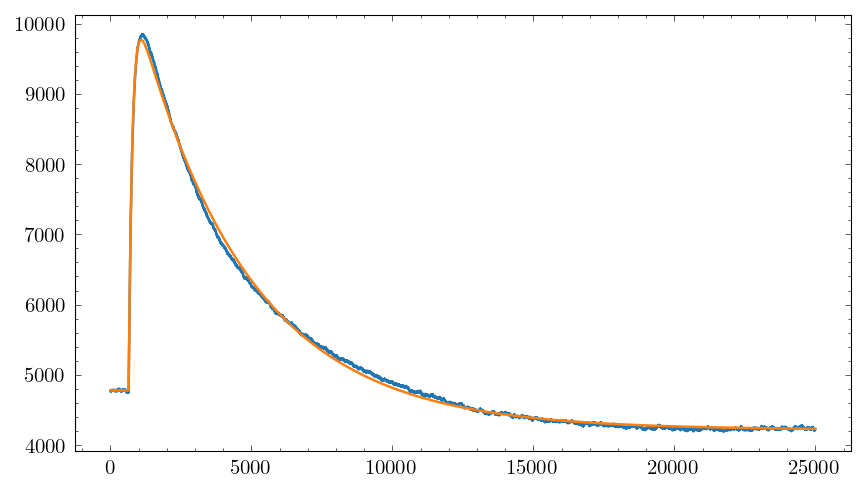

4991.128789650893 
 5860.904315016466 
##############################


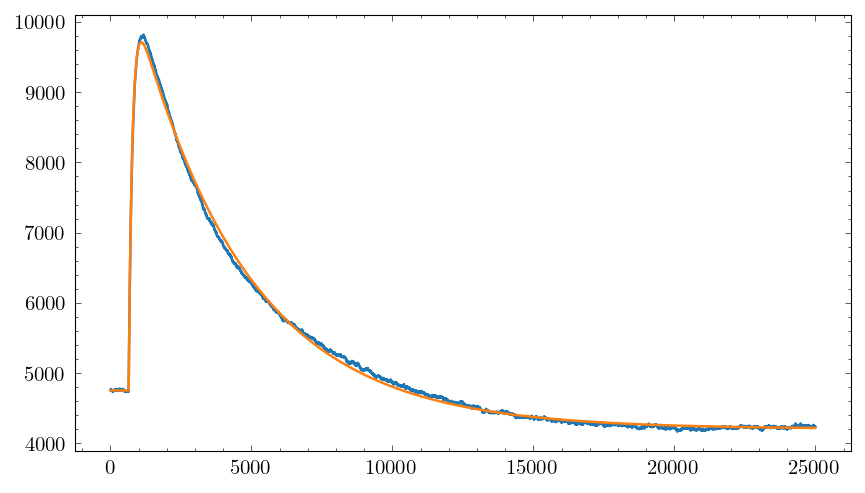

4955.128065493216 
 5825.798885192822 
##############################


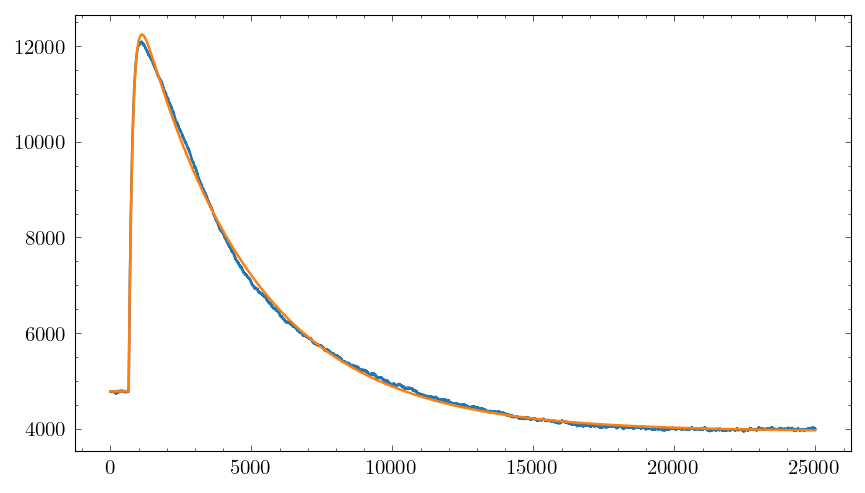

7468.016703210235 
 8841.702316898201 
##############################


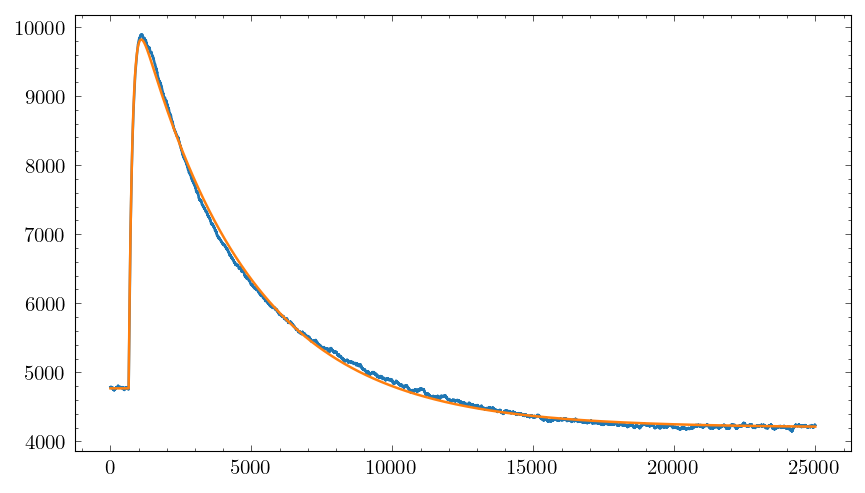

5050.444564925378 
 5947.437732254316 
##############################


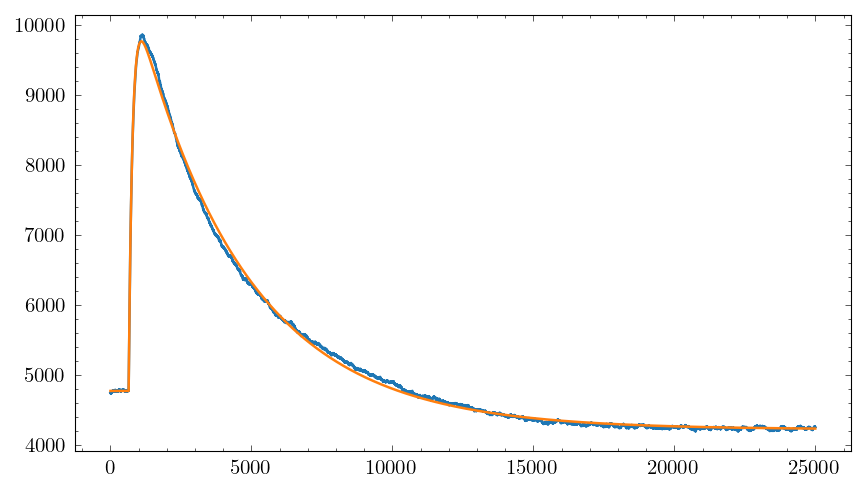

4997.208921124166 
 5896.583158883784 
##############################


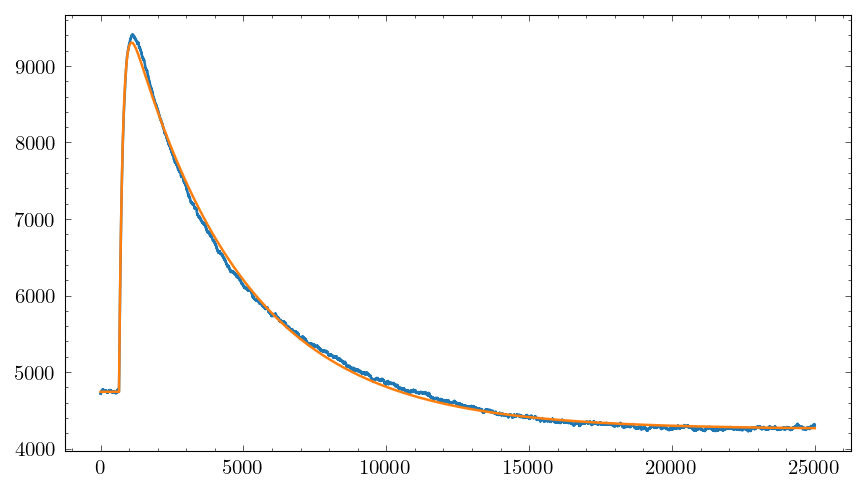

4562.910511863278 
 5345.649387962664 
##############################


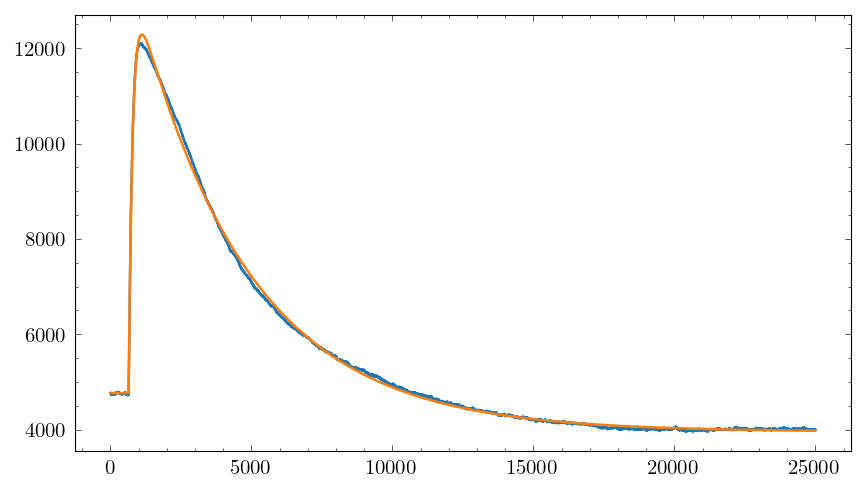

7520.4872936231795 
 8904.368362165436 
##############################


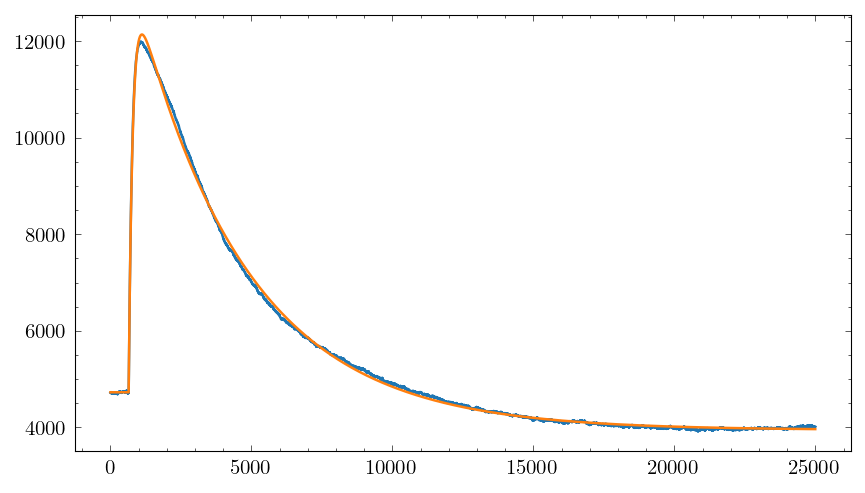

7408.2238675590415 
 8783.190687491087 
##############################


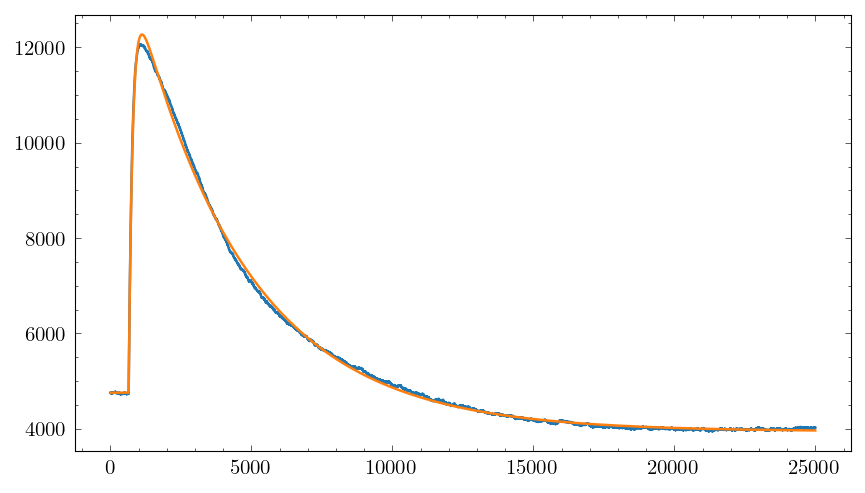

7510.207253918921 
 8911.016507675562 
##############################


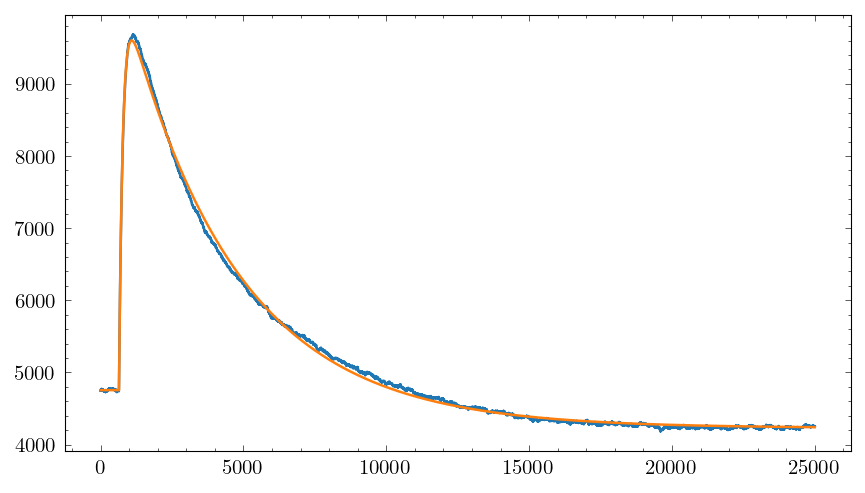

4846.304671817568 
 5697.554046955545 
##############################


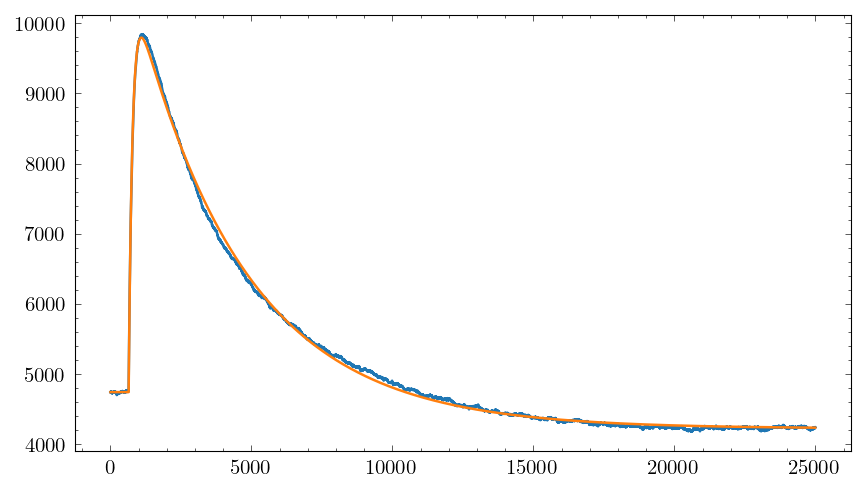

5051.476826116844 
 5953.174998276381 
##############################


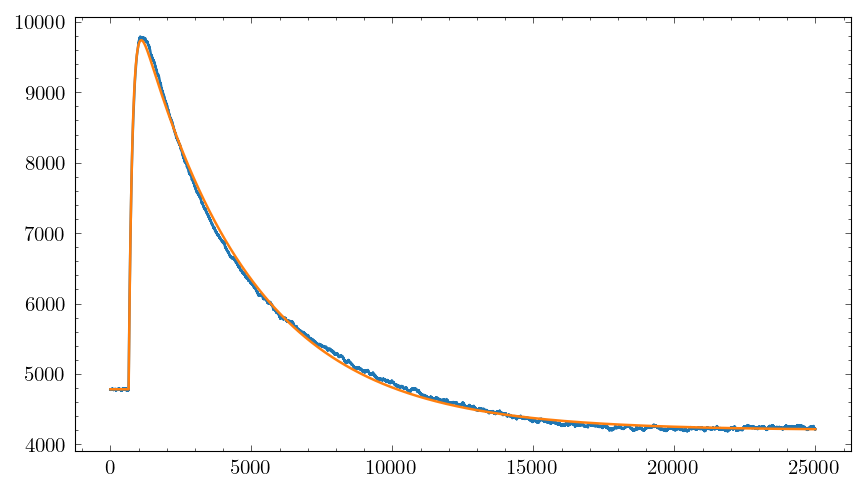

4956.849981982164 
 5831.132329623913 
##############################


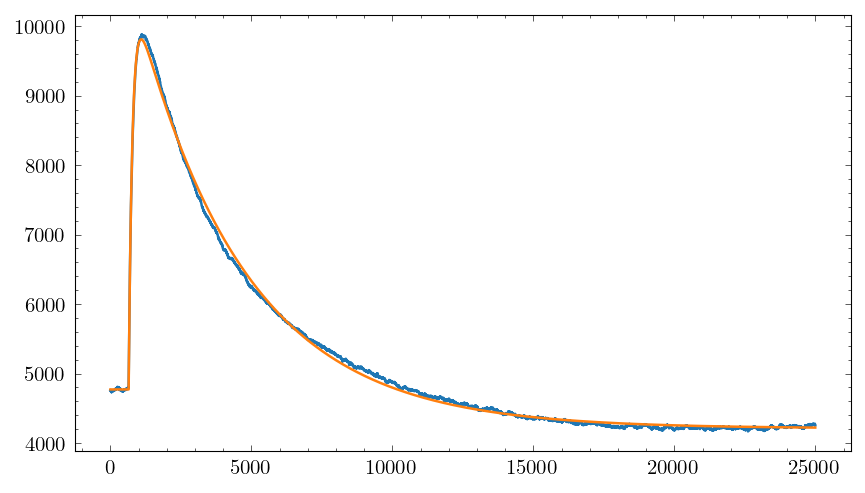

5038.241057896124 
 5935.406871595137 
##############################


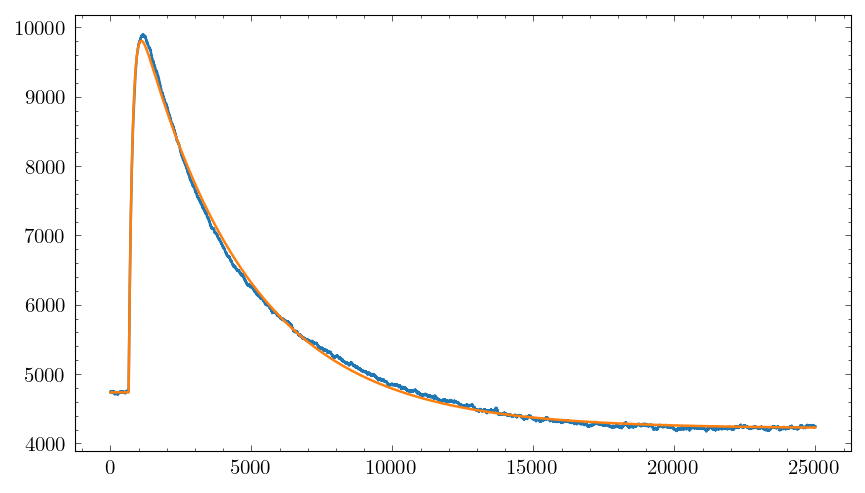

5071.446526117482 
 5986.753065395394 
##############################


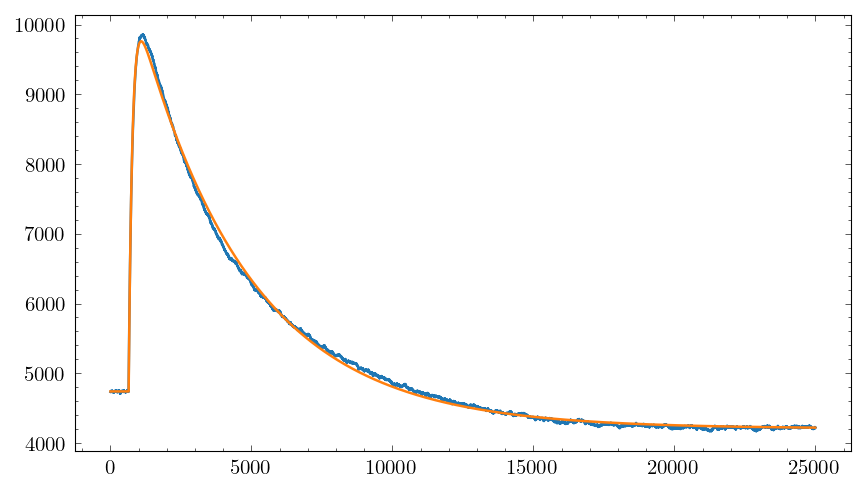

5019.431542582737 
 5890.277350522009 
##############################


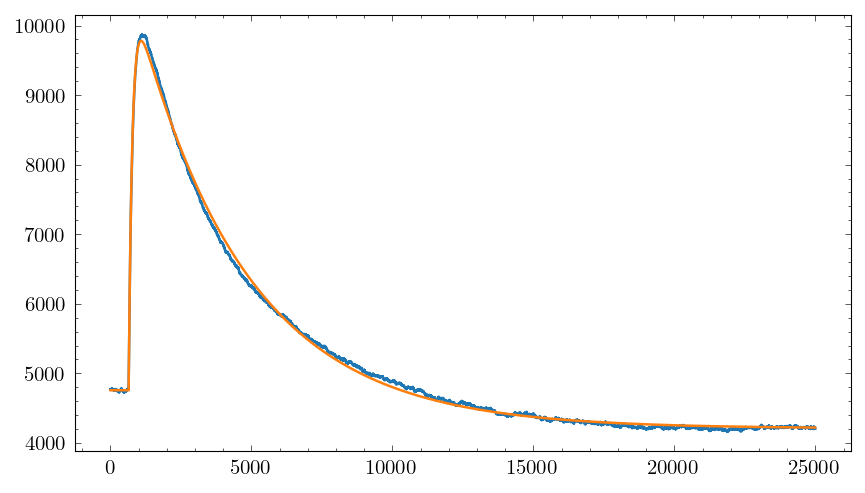

5021.783696587118 
 5895.777494106708 
##############################


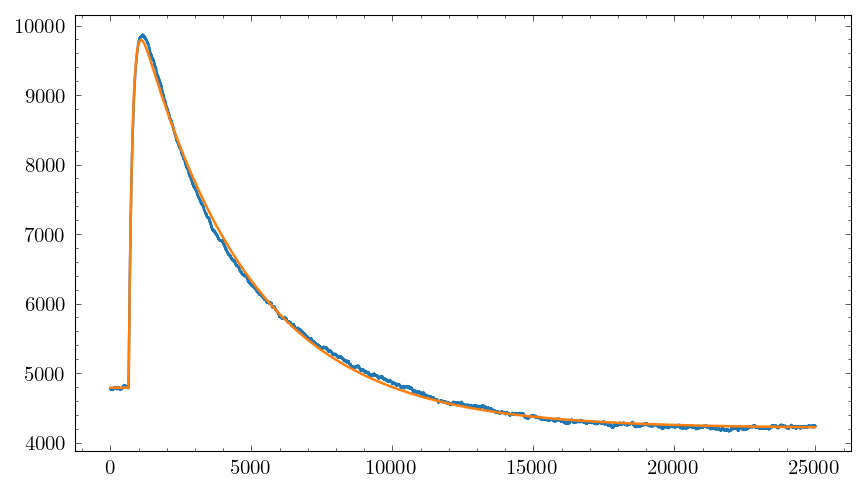

5002.8632744538745 
 5882.95099970642 
##############################


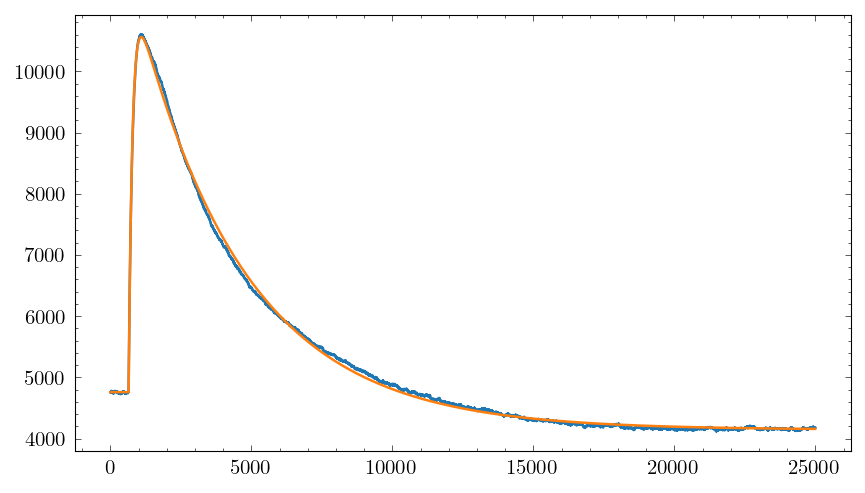

5802.413505488946 
 6845.402894260174 
##############################


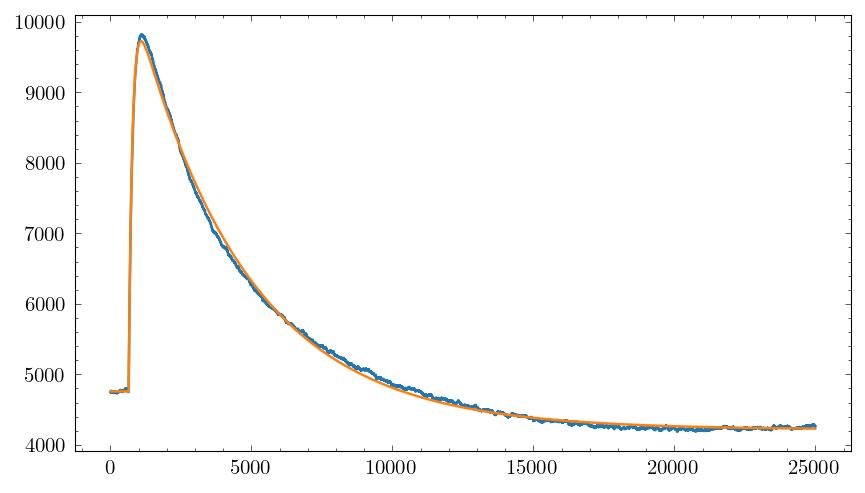

4966.704289158405 
 5828.324003652582 
##############################


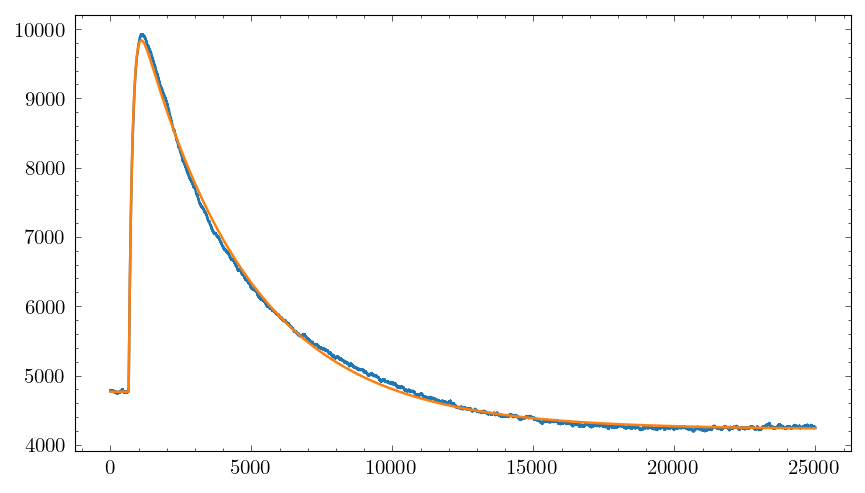

5069.226959779427 
 5989.81285848547 
##############################


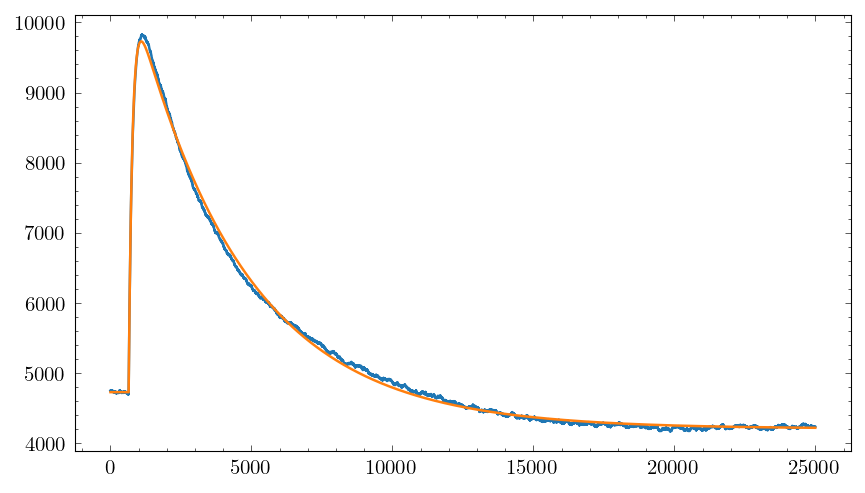

4999.648309389414 
 5877.502862662393 
##############################


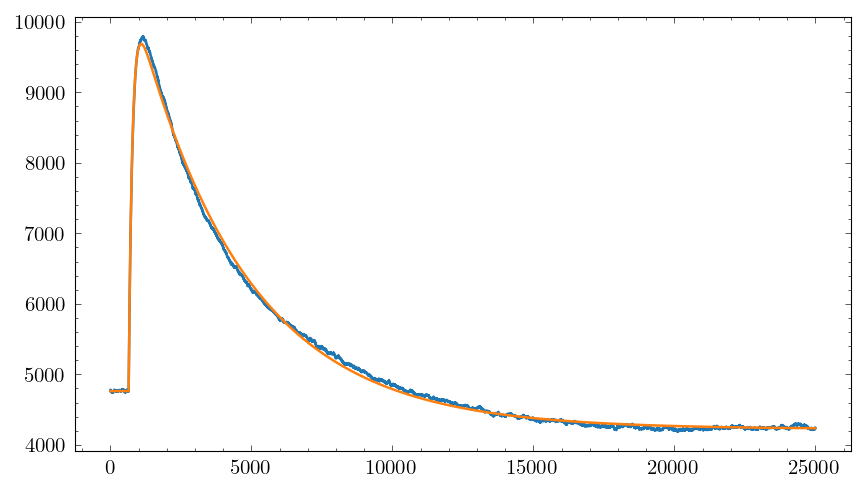

4926.131941435364 
 5801.310126312348 
##############################


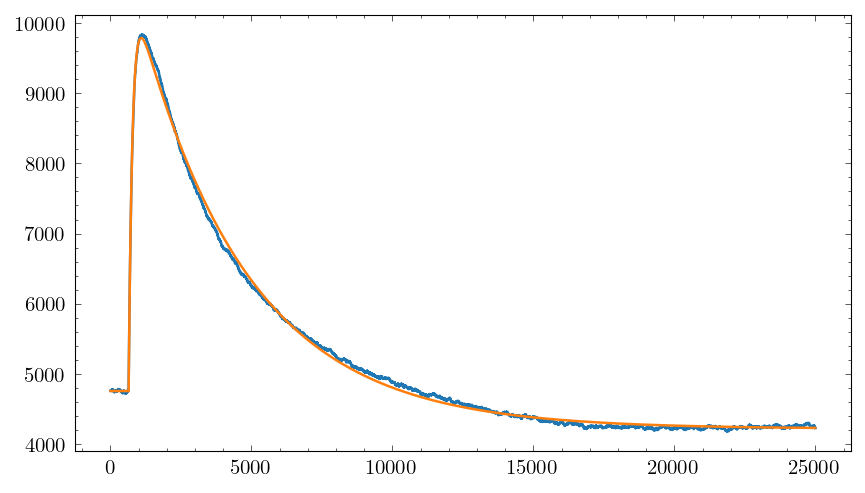

5029.121803870186 
 5920.834246752756 
##############################


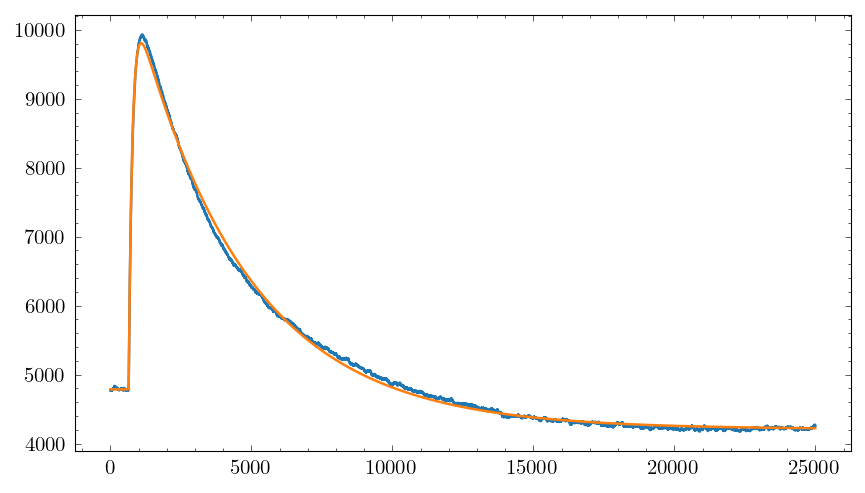

5018.683298784281 
 5898.464655152685 
##############################


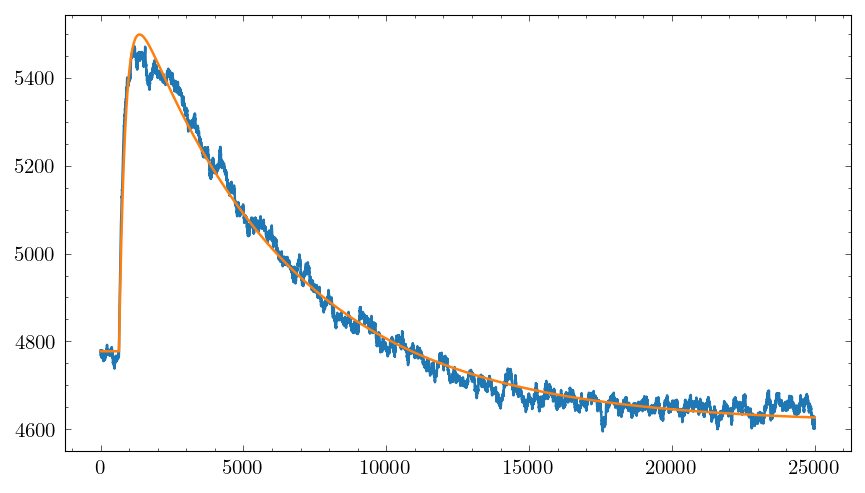

721.5331019926834 
 888.7692072922337 
##############################


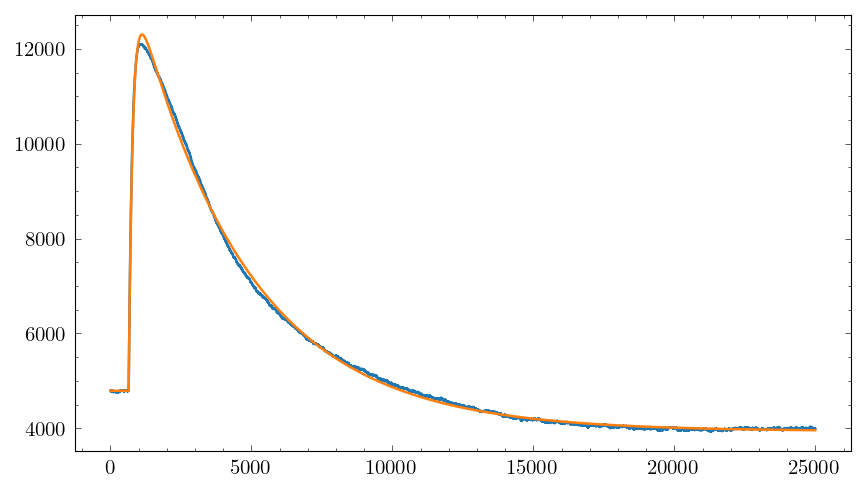

7510.129353993348 
 8914.224525788628 
##############################


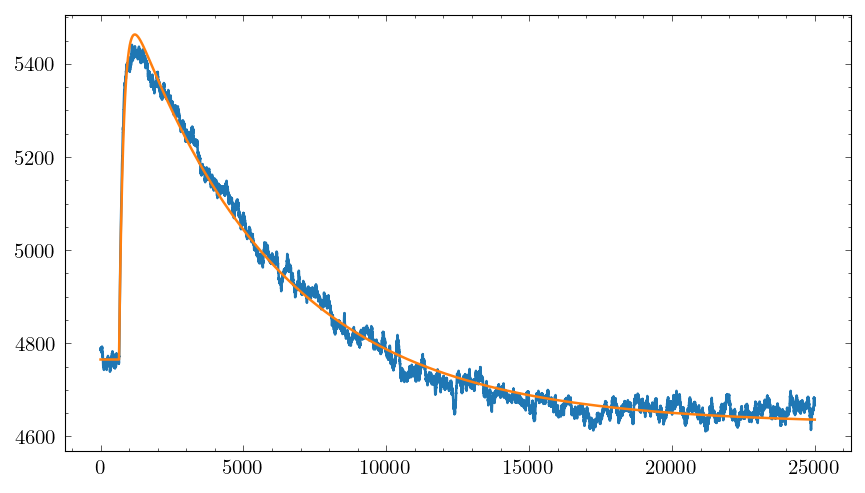

697.8821171128175 
 821.0706450710516 
##############################


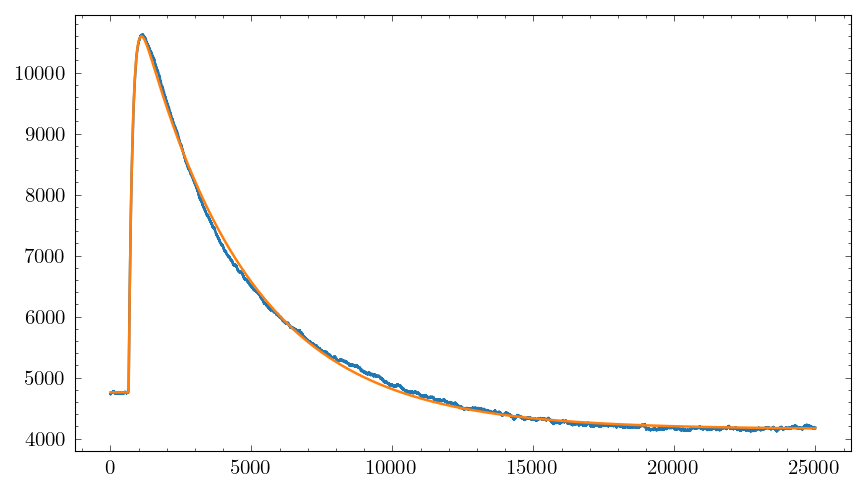

5834.2212646486705 
 6904.816103277391 
##############################


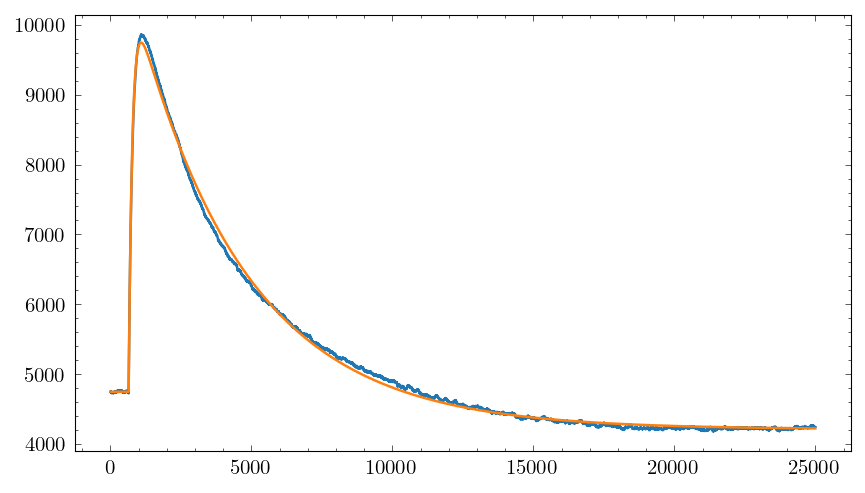

5000.806517724966 
 5865.298975296037 
##############################


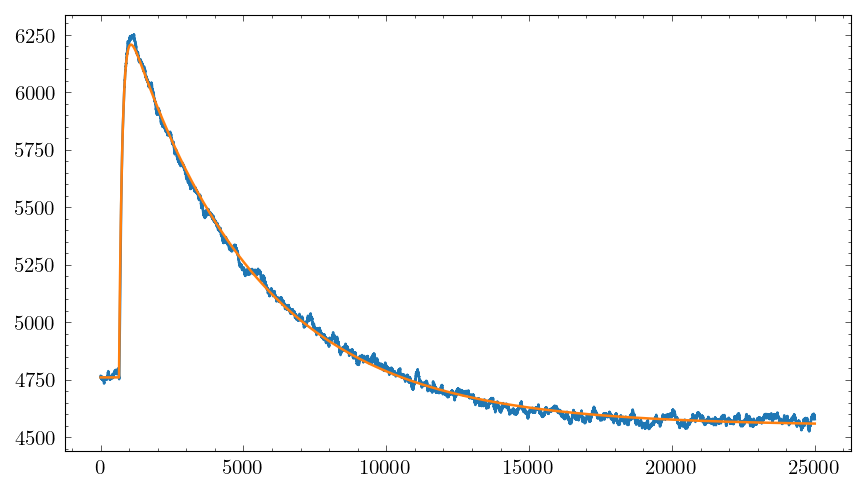

1447.1047054730097 
 1655.495023041571 
##############################


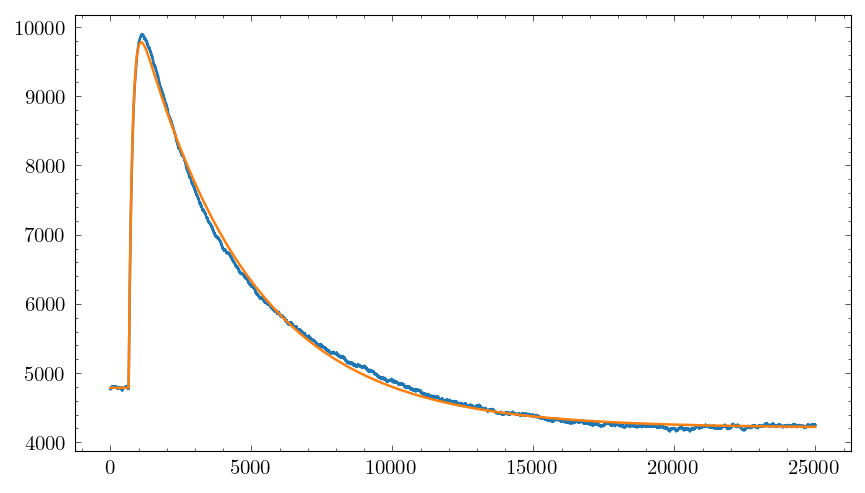

4993.537348220526 
 5881.826245923625 
##############################


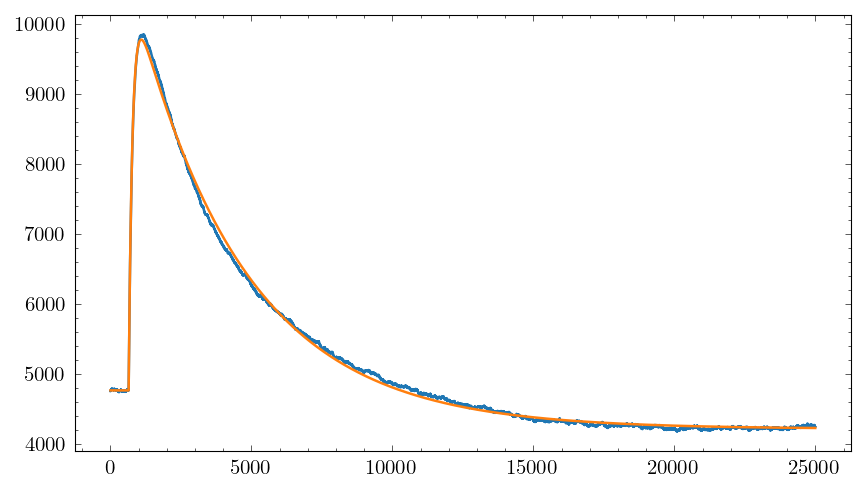

5006.733553640581 
 5893.832558239973 
##############################


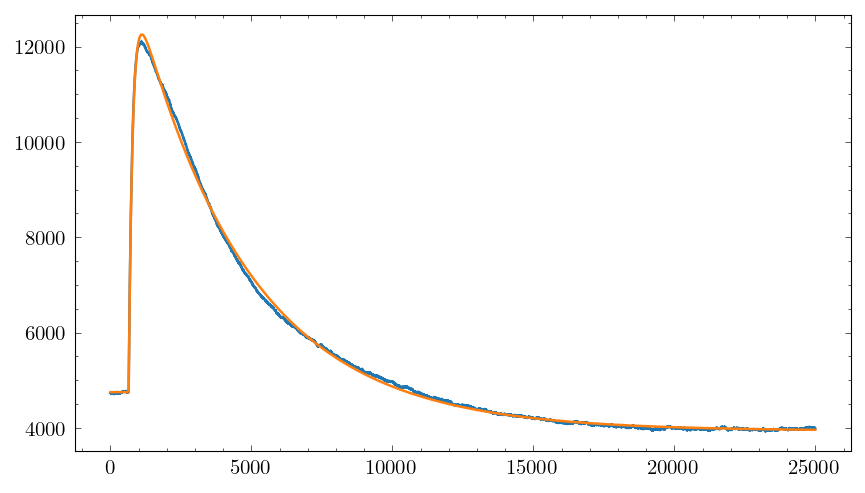

7501.99234279586 
 8873.673792164609 
##############################


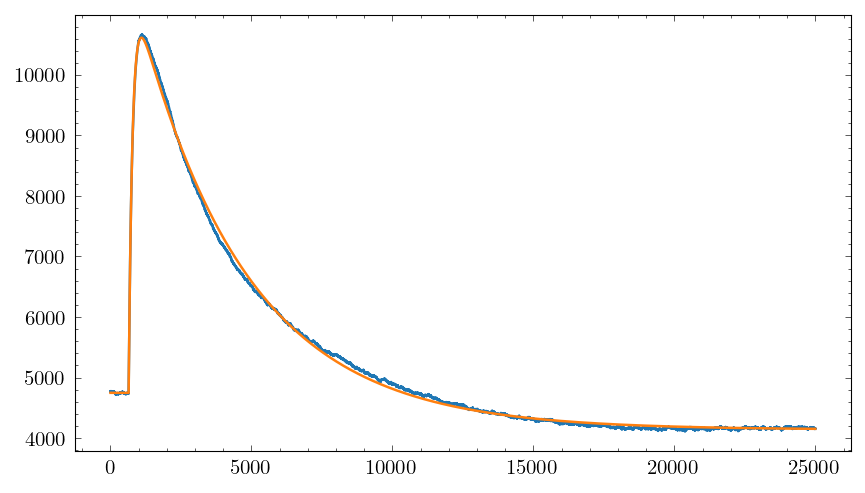

5867.9628081814735 
 6929.598417405808 
##############################


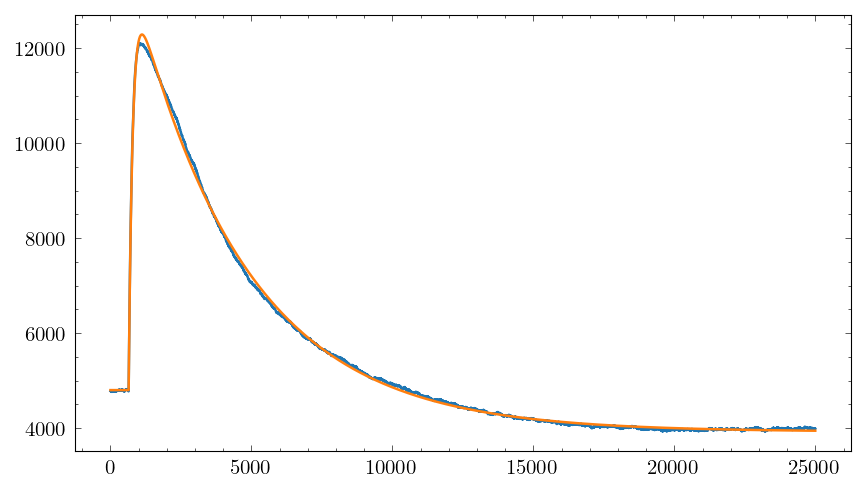

7484.344680350565 
 8876.194694997605 
##############################


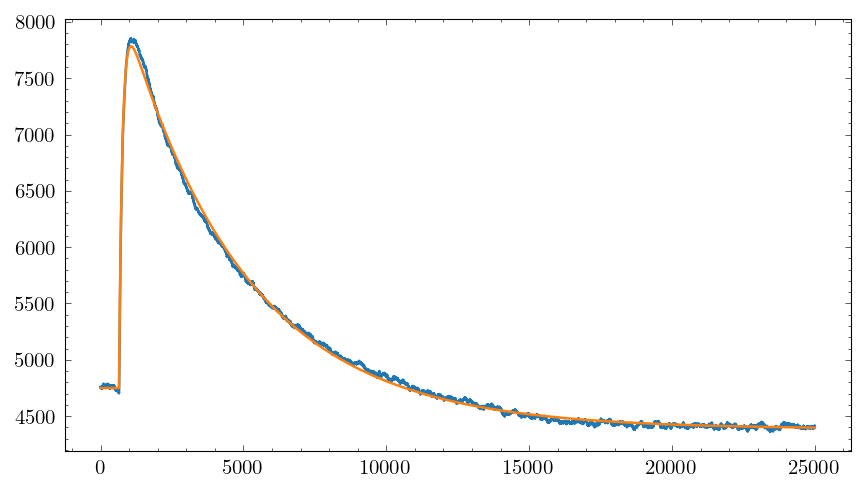

3033.8864256358393 
 3498.8002374091307 
##############################


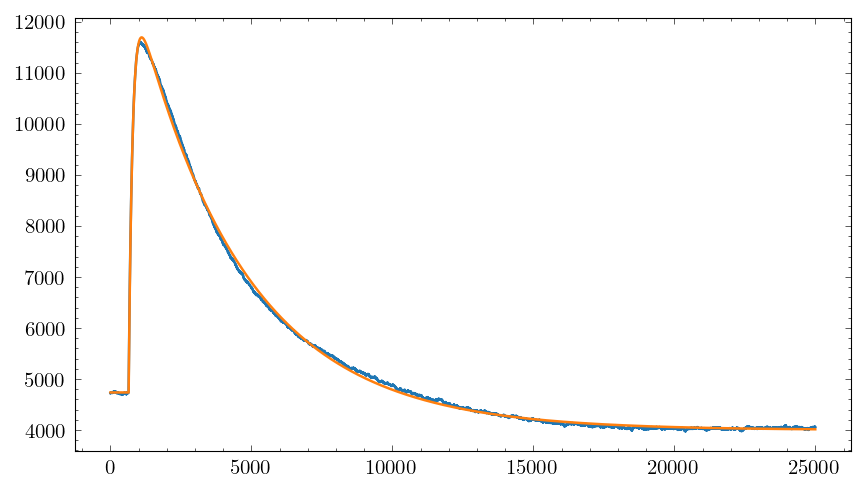

6959.322747632907 
 8258.35111702394 
##############################


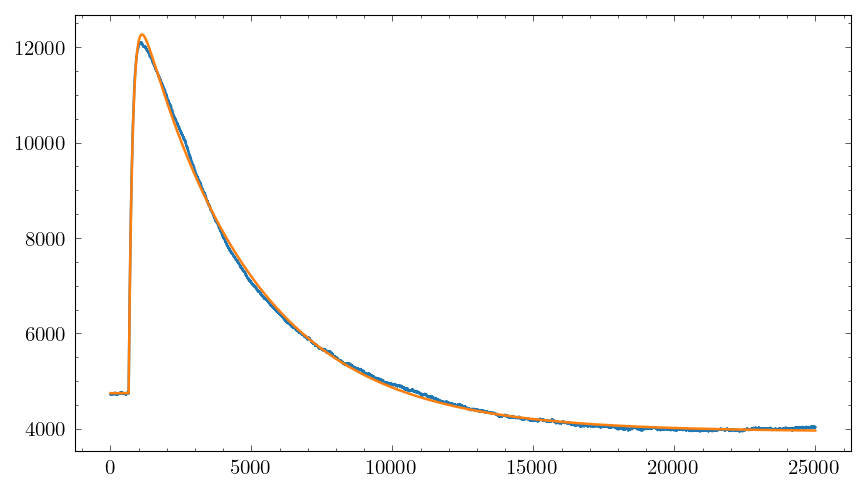

7516.7022526303845 
 8914.026317946229 
##############################


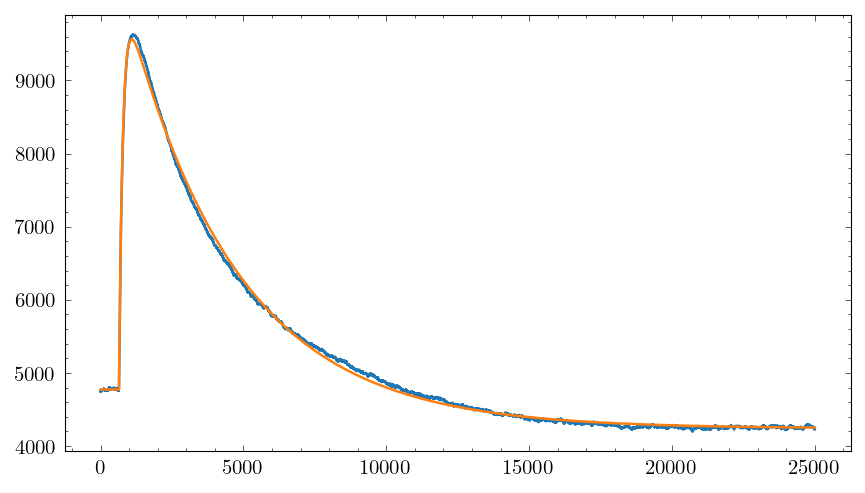

4789.464360887079 
 5645.373966329776 
##############################


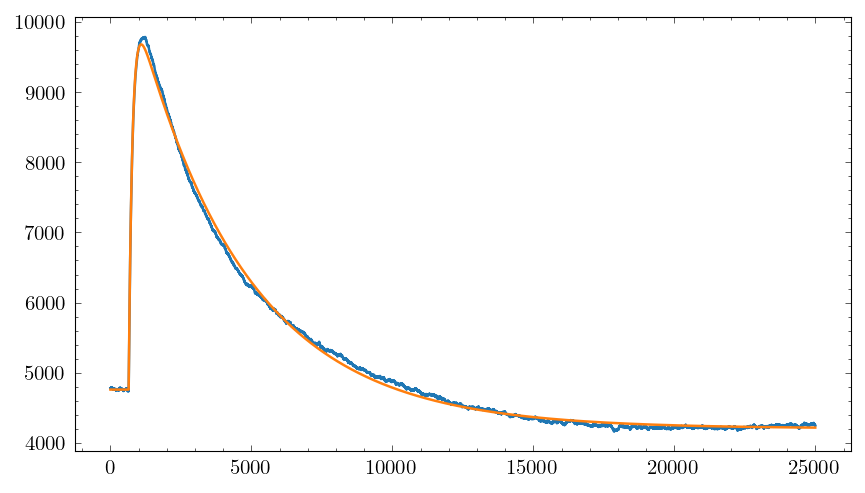

4918.849930330624 
 5789.286468576204 
##############################


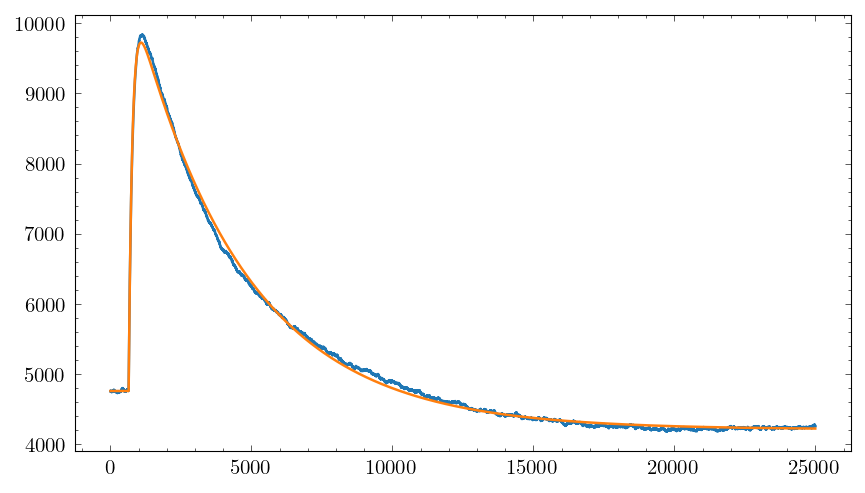

4961.506985464578 
 5821.696138667266 
##############################


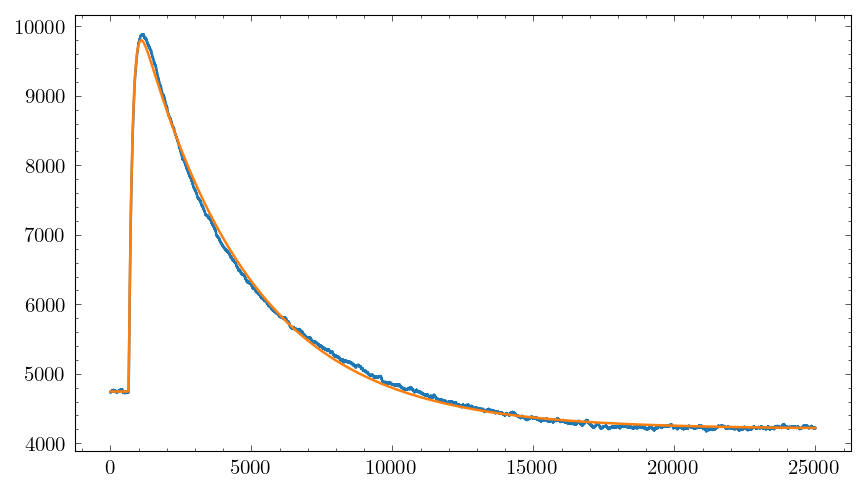

5055.663122534938 
 5946.418062362432 
##############################


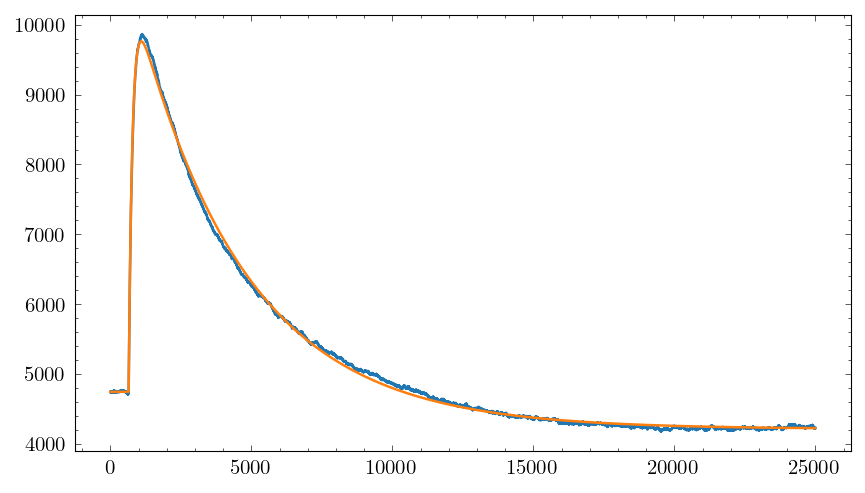

5018.921947149338 
 5907.213811681151 
##############################


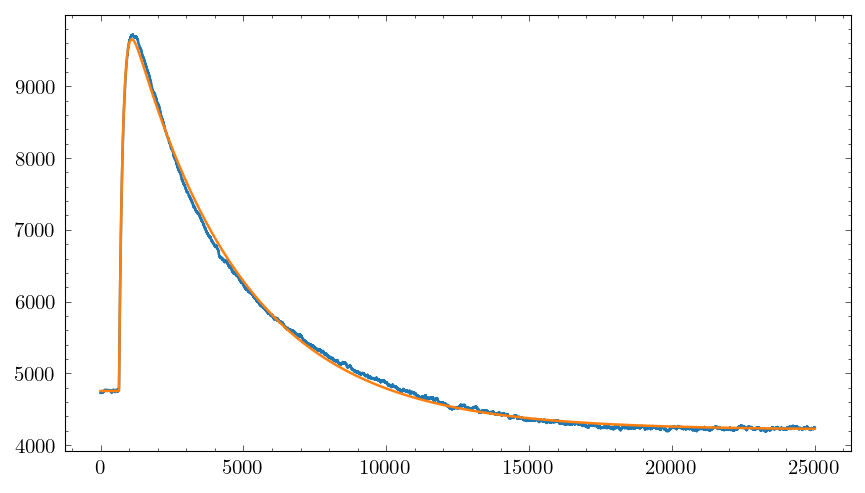

4901.091236710936 
 5777.929542452244 
##############################


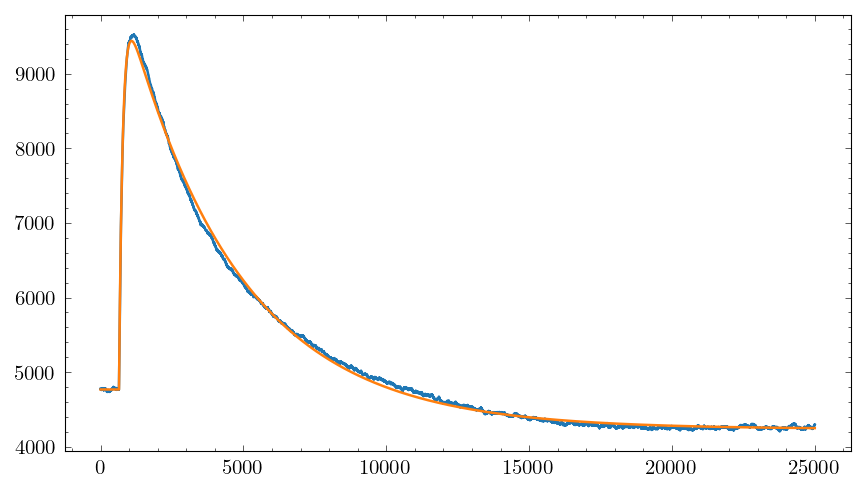

4671.006576741196 
 5475.511637682063 
##############################


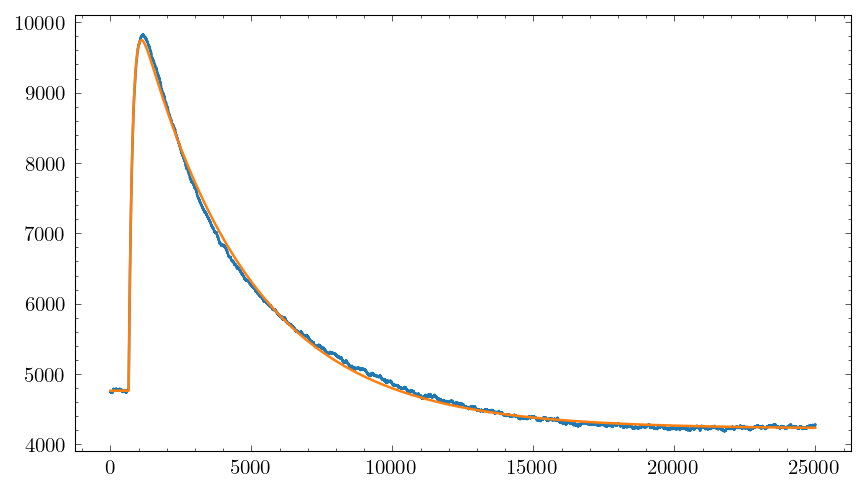

4982.323256560767 
 5891.202555198442 
##############################


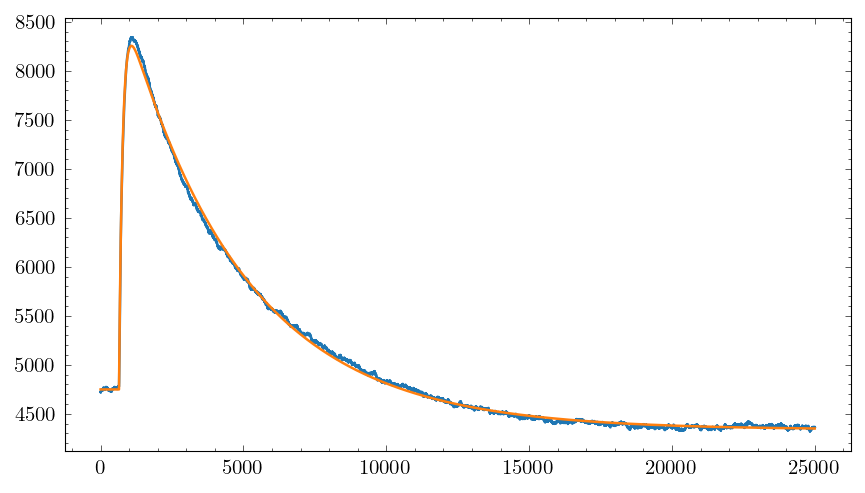

3505.8838945437783 
 4074.8893711676737 
##############################


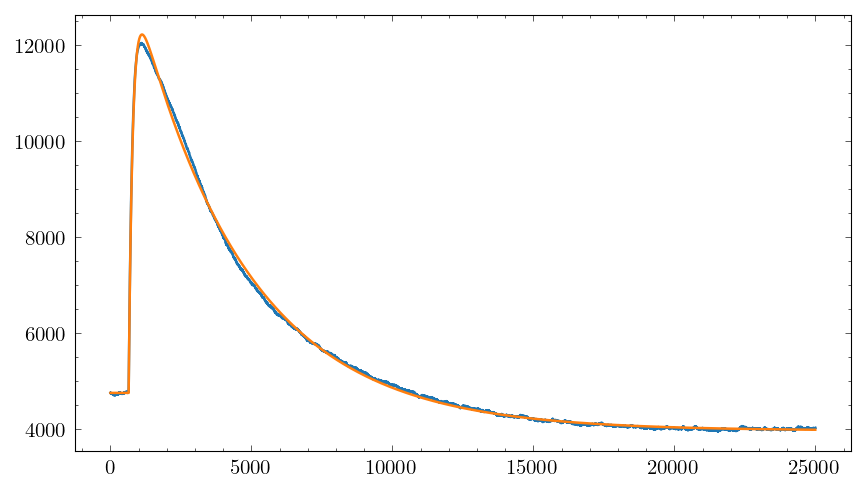

7464.345059409746 
 8869.224776191819 
##############################


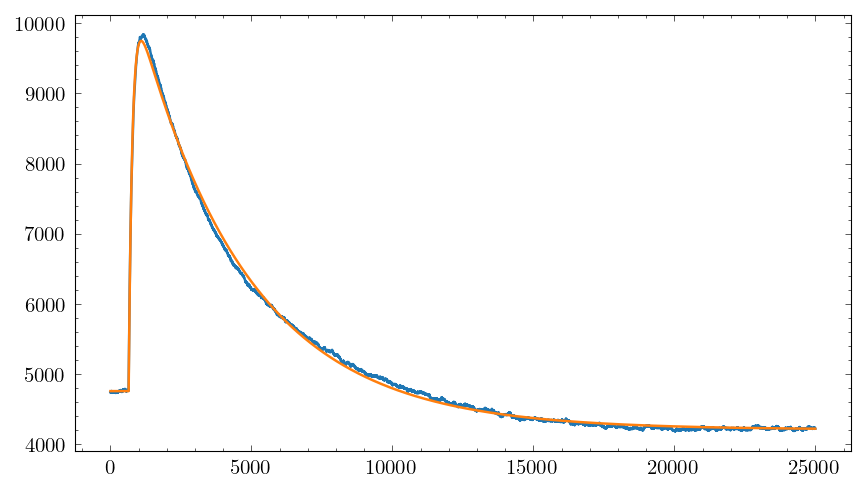

4986.428379538454 
 5860.5770150513235 
##############################


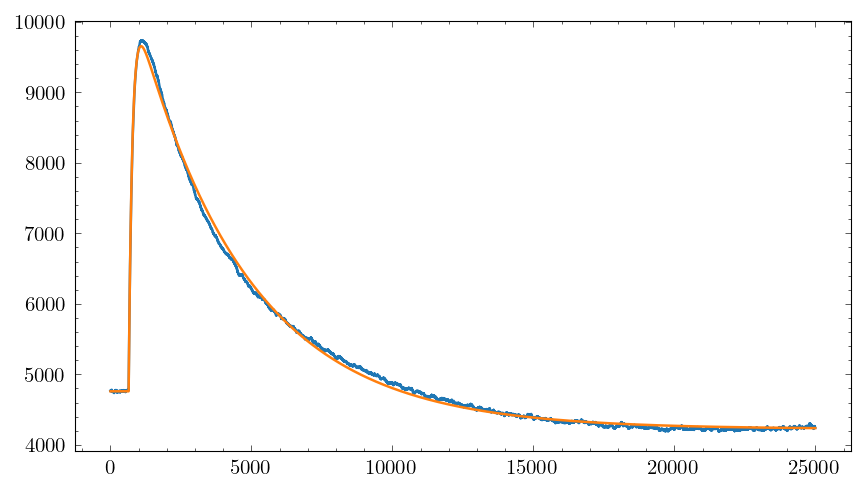

4895.768274653288 
 5747.785593470978 
##############################


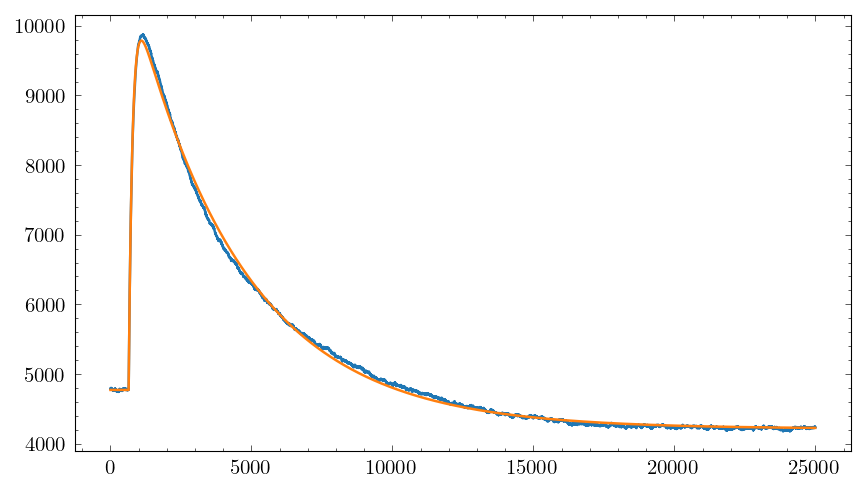

5015.931260458212 
 5918.178749186409 
##############################


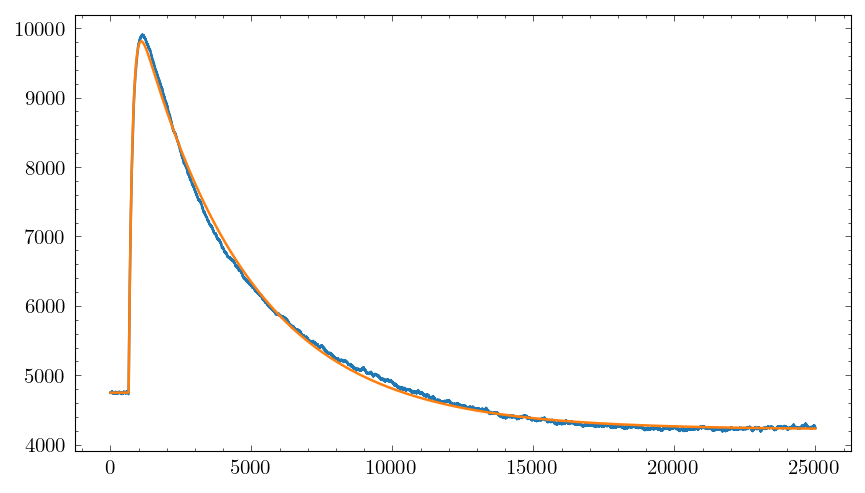

5058.395679907972 
 5954.06081222501 
##############################


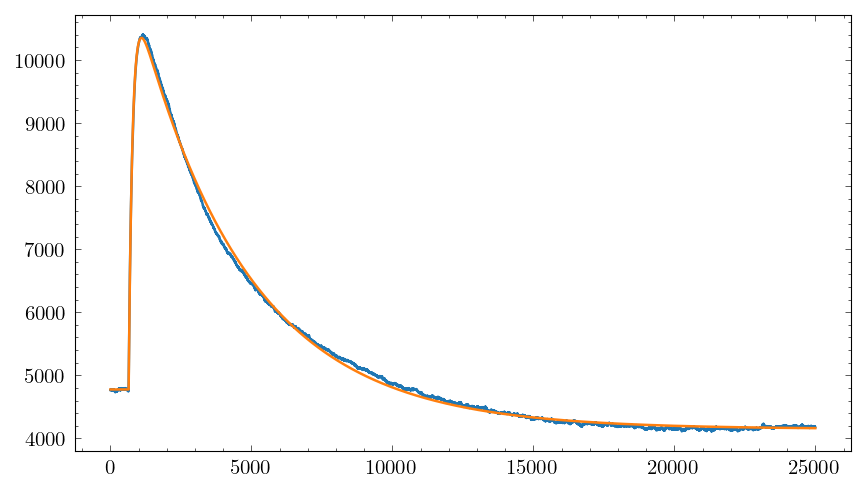

5575.6345260601 
 6591.115737181083 
##############################


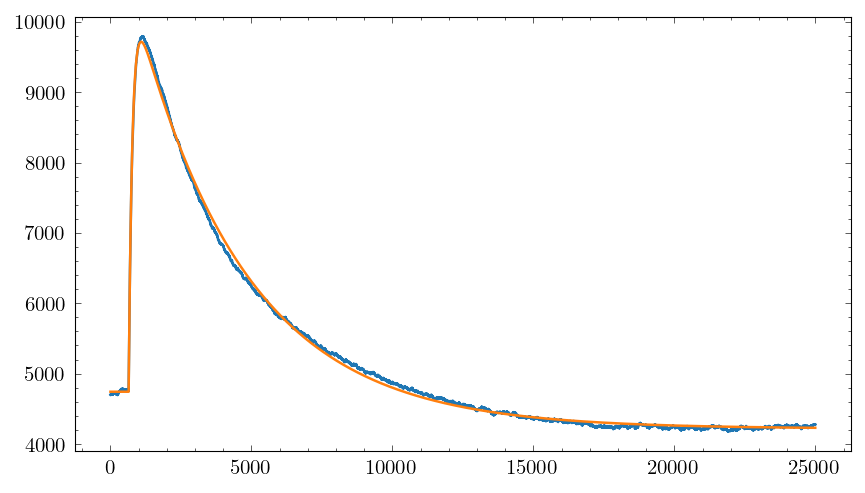

4973.745352593308 
 5844.142053043087 
##############################


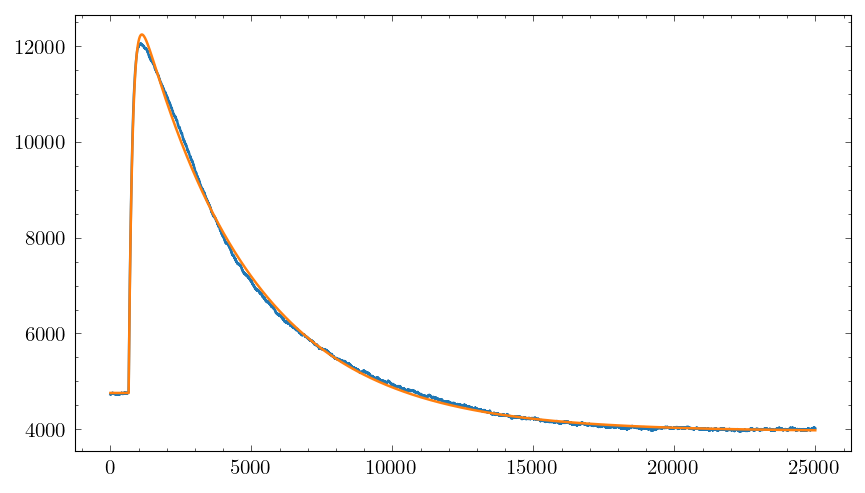

7483.457446301718 
 8855.356320621335 
##############################


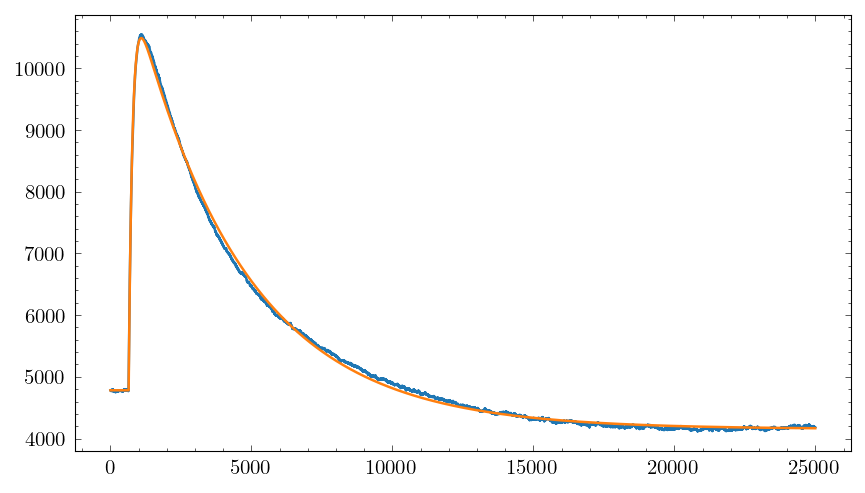

5706.925448549182 
 6729.061846309054 
##############################


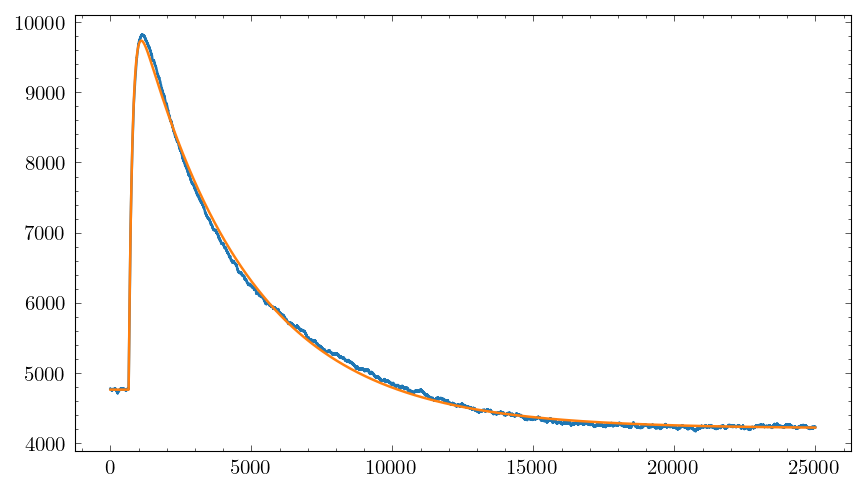

4968.840869787207 
 5858.16815305769 
##############################


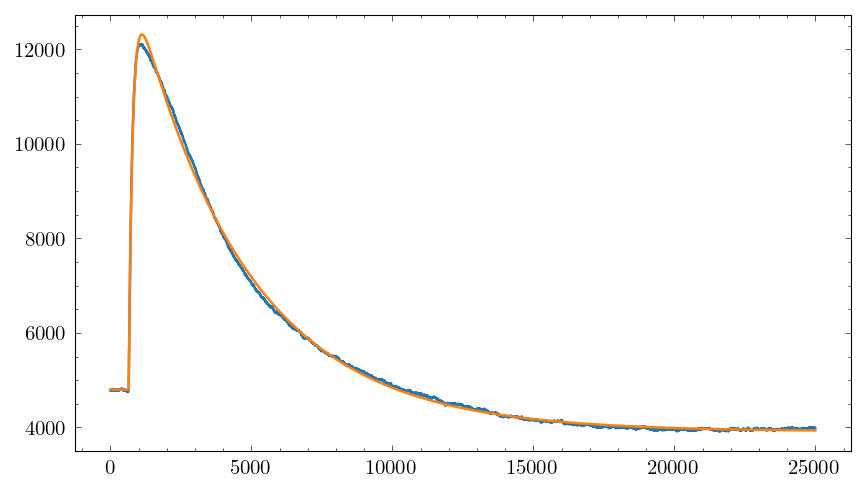

7513.080373848955 
 8922.059354034758 
##############################


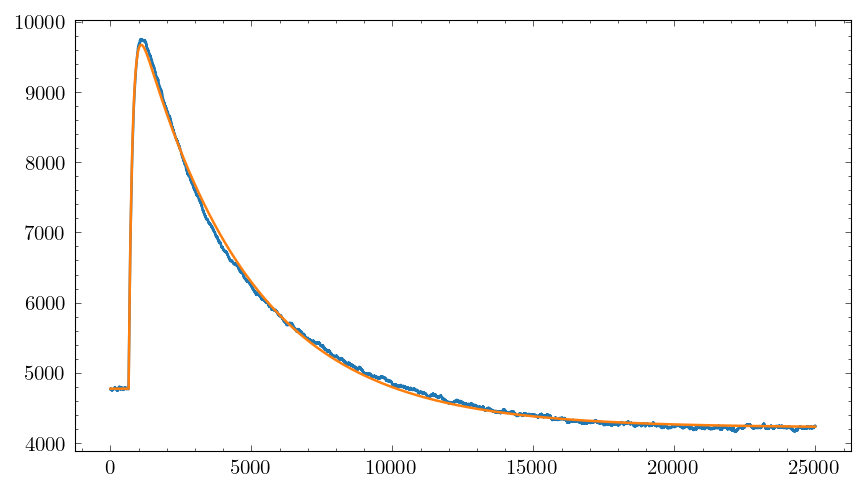

4898.846410889549 
 5769.609382276328 
##############################


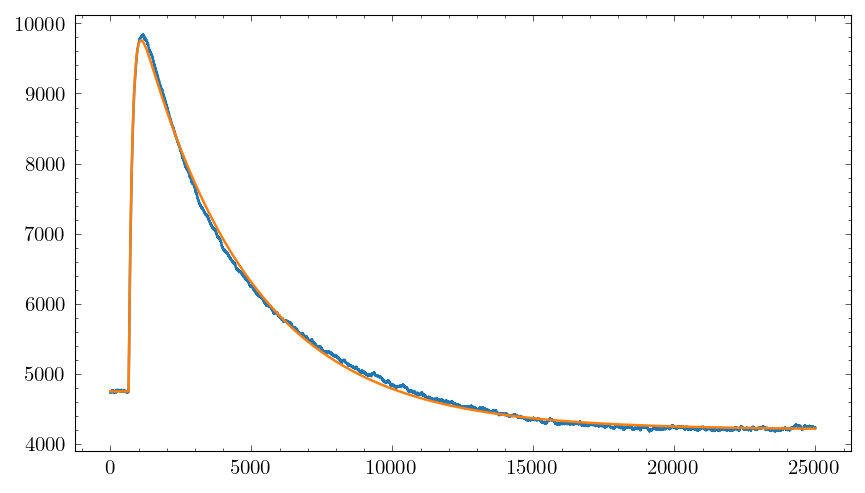

5008.720459344494 
 5892.480057221861 
##############################


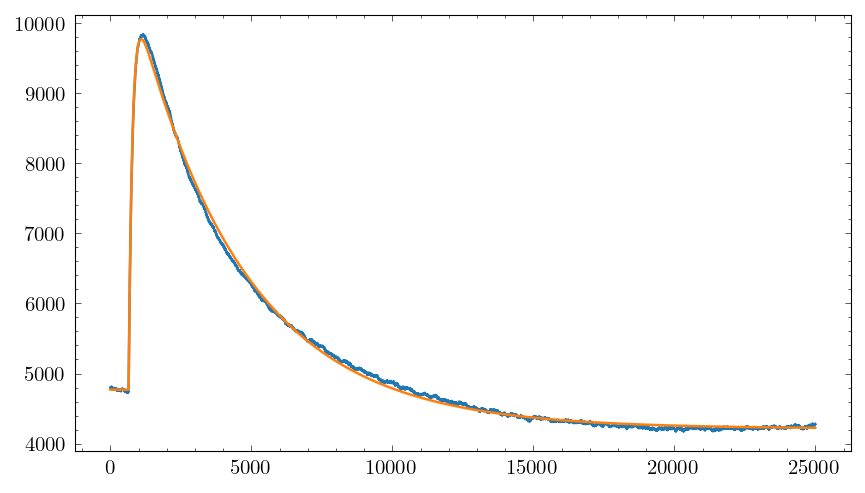

5003.097470261193 
 5904.536431434176 
##############################


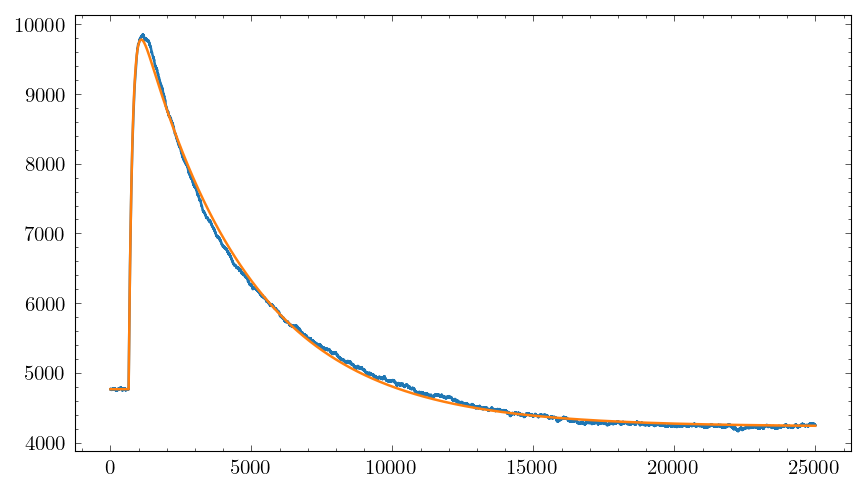

5015.410321068421 
 5917.835102461901 
##############################


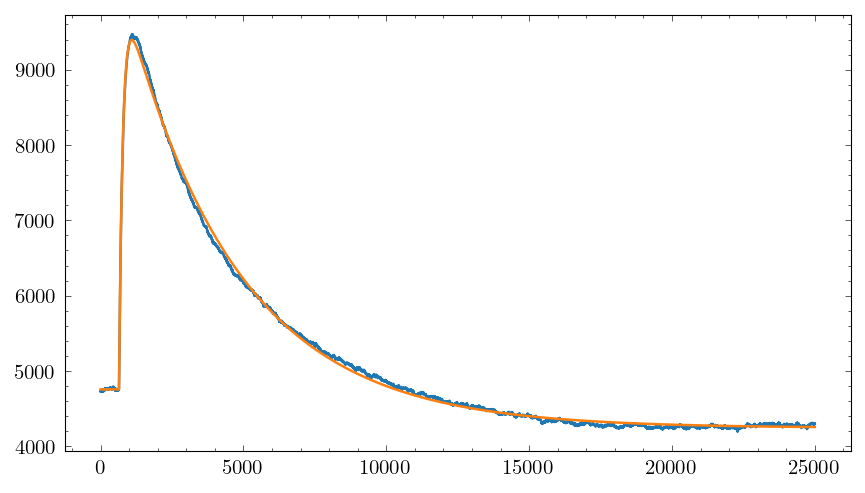

4637.773873729702 
 5455.61724193618 
##############################


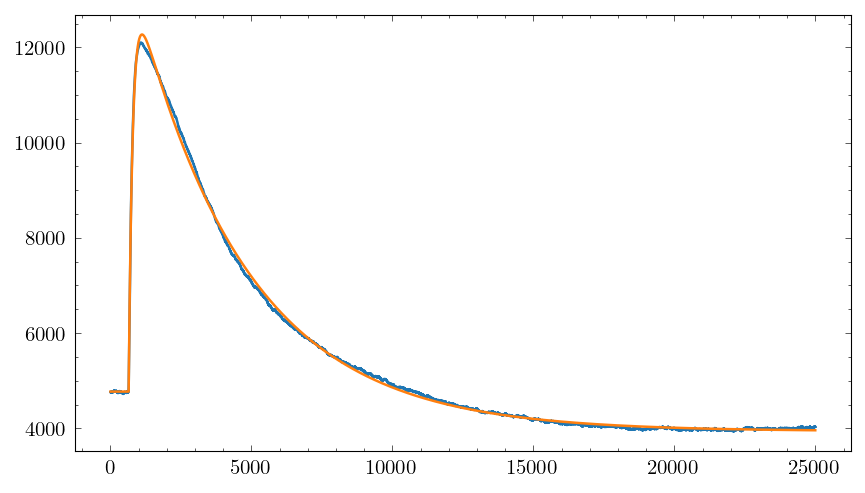

7499.892922500045 
 8905.383522452083 
##############################


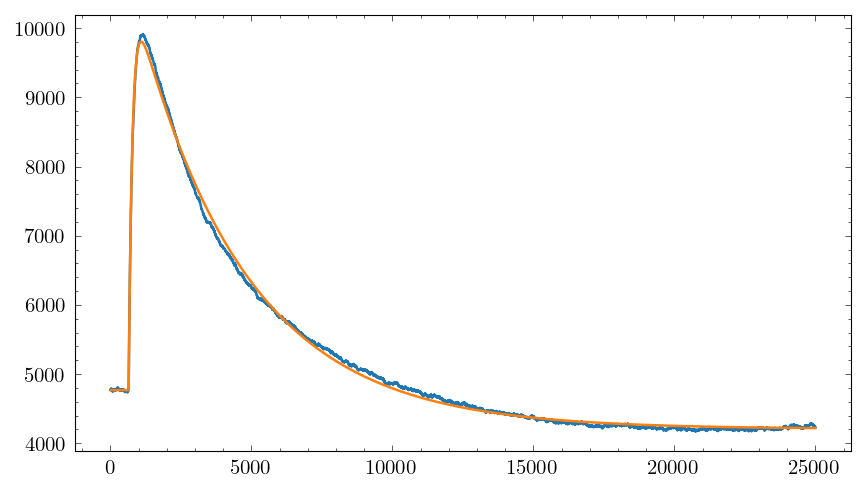

5036.526524134737 
 5928.337286072742 
##############################


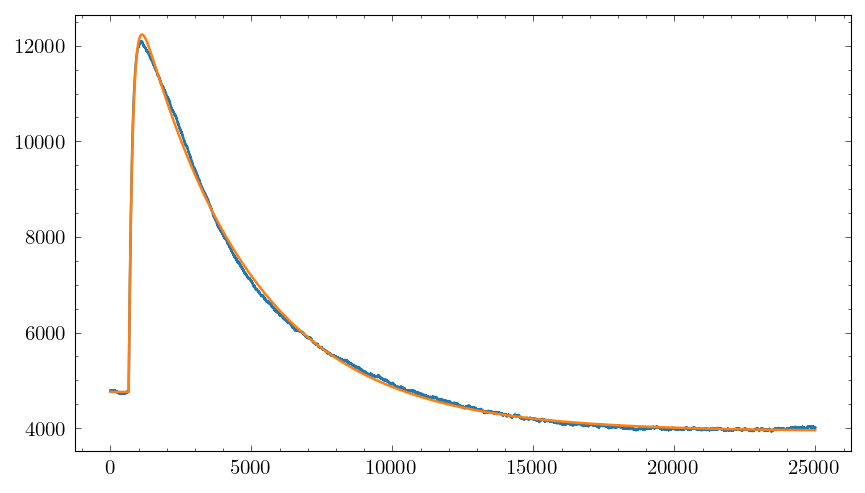

7478.254118118604 
 8865.747491518308 
##############################


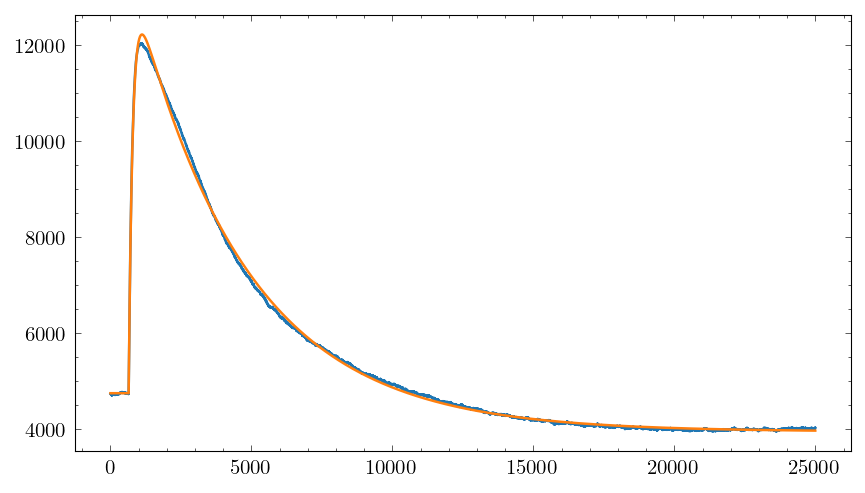

7470.1129922757145 
 8855.092623987137 
##############################


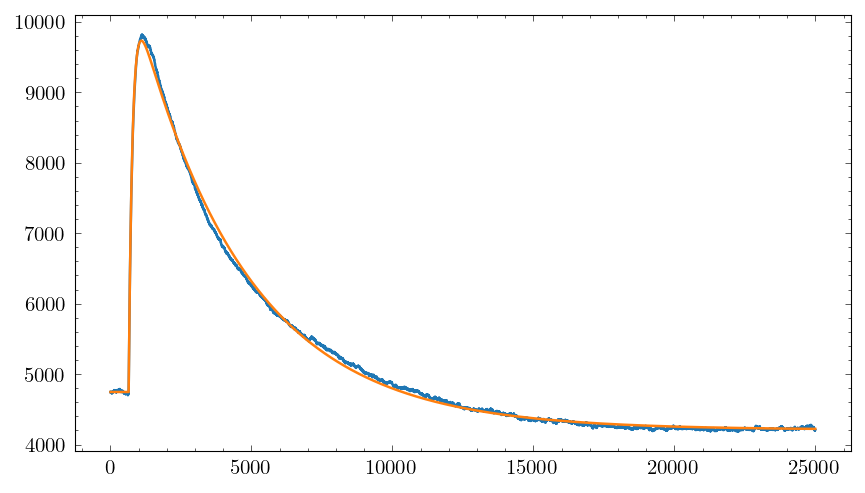

4986.567145748003 
 5880.817374317545 
##############################


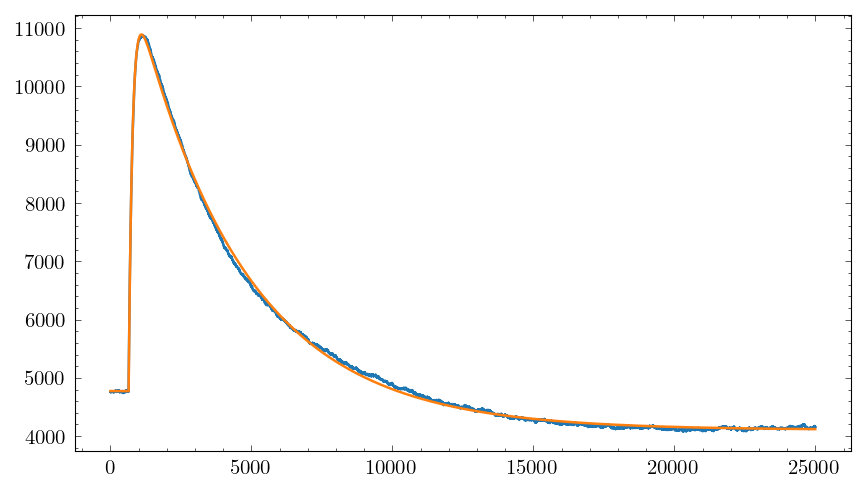

6117.468357028745 
 7235.177045472022 
##############################


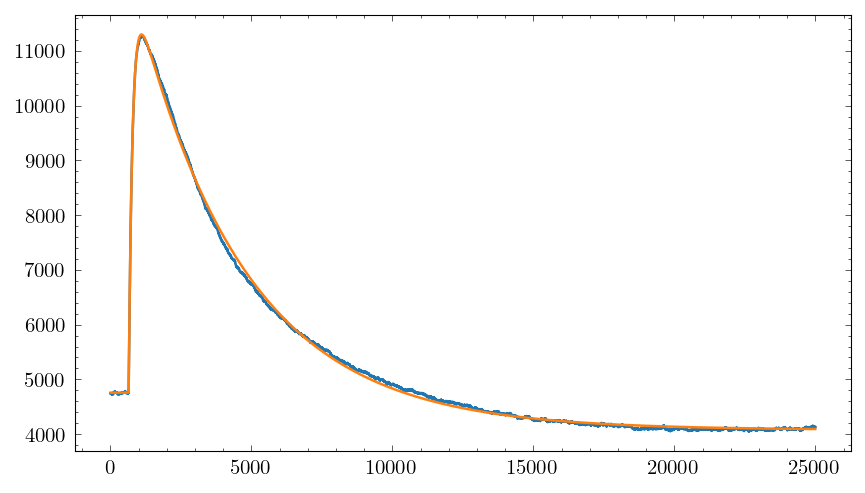

6542.969514779146 
 7735.10680436265 
##############################


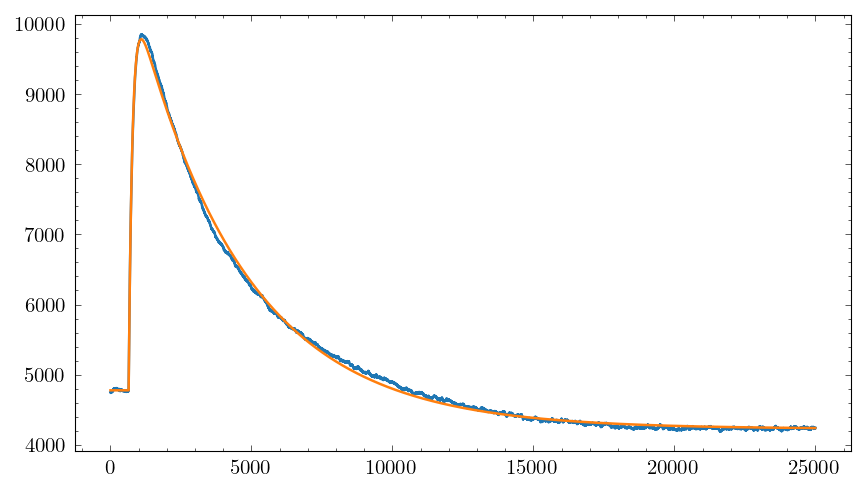

5001.231319200843 
 5903.415394160387 
##############################


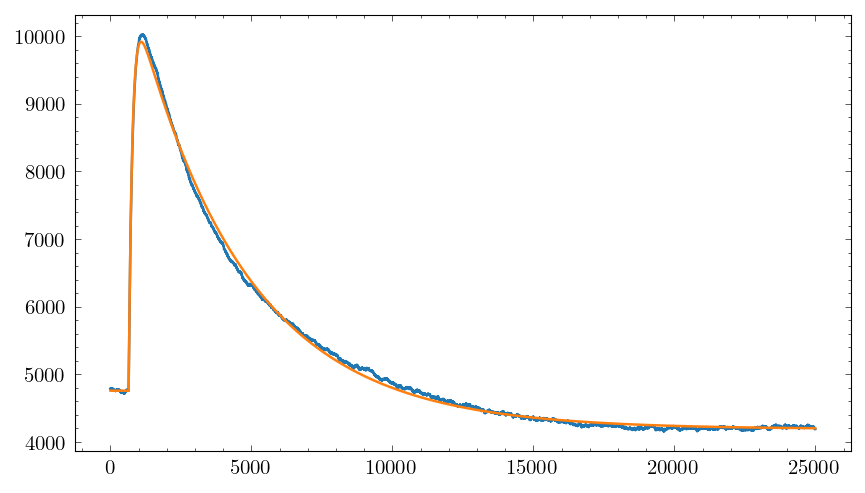

5158.277678741368 
 6060.597800422494 
##############################


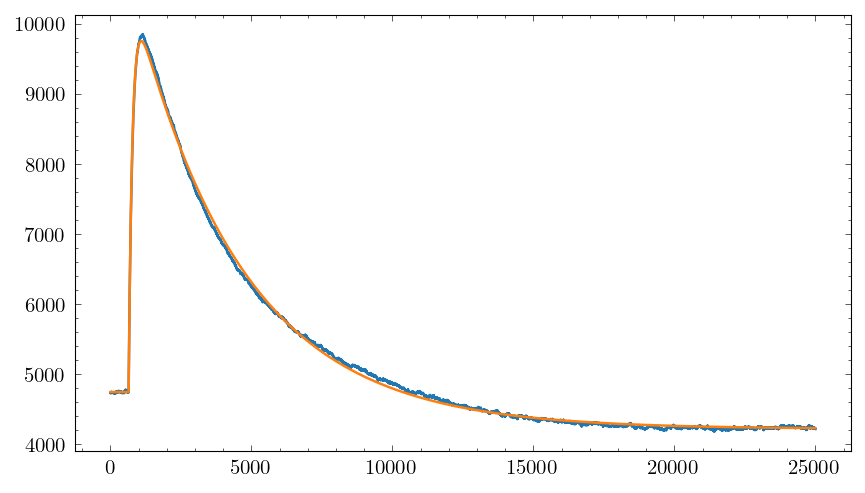

5004.3456822987055 
 5893.27298289245 
##############################


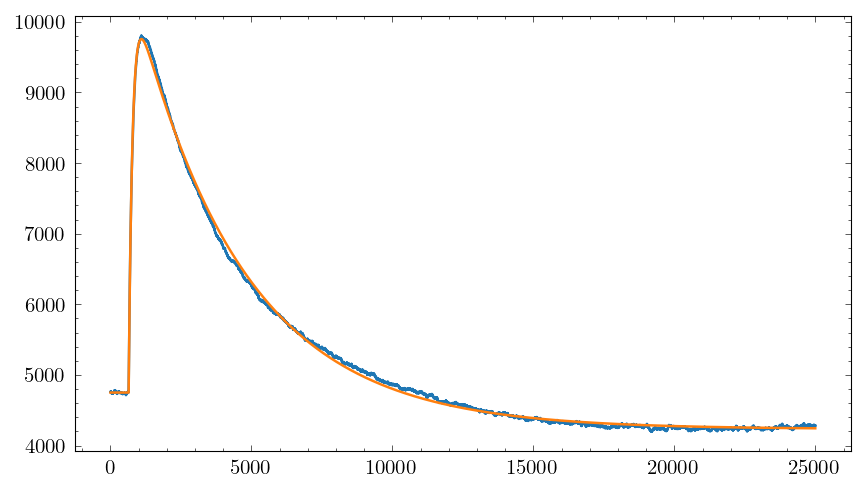

5005.976381691505 
 5916.176269169253 
##############################


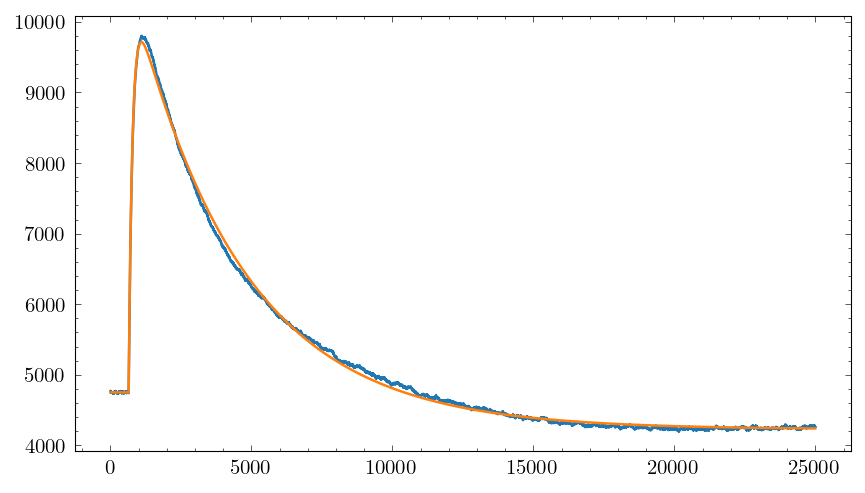

4962.314944824426 
 5851.745647044688 
##############################


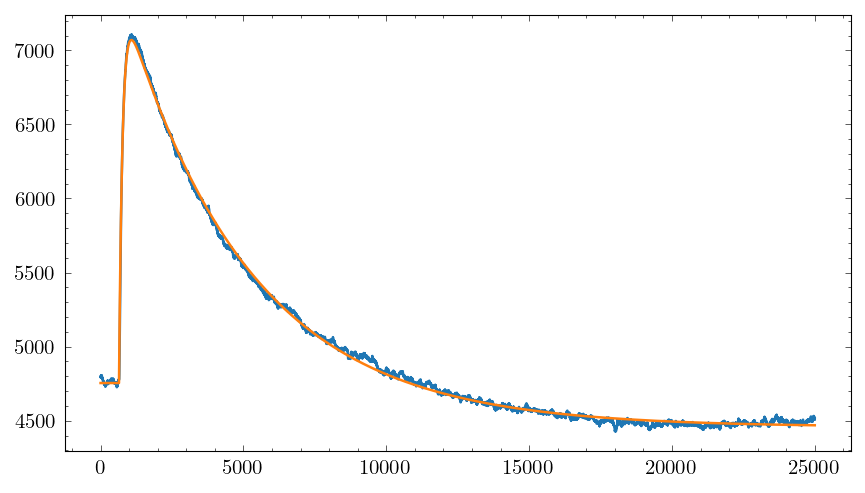

2315.479779704787 
 2667.727201349181 
##############################


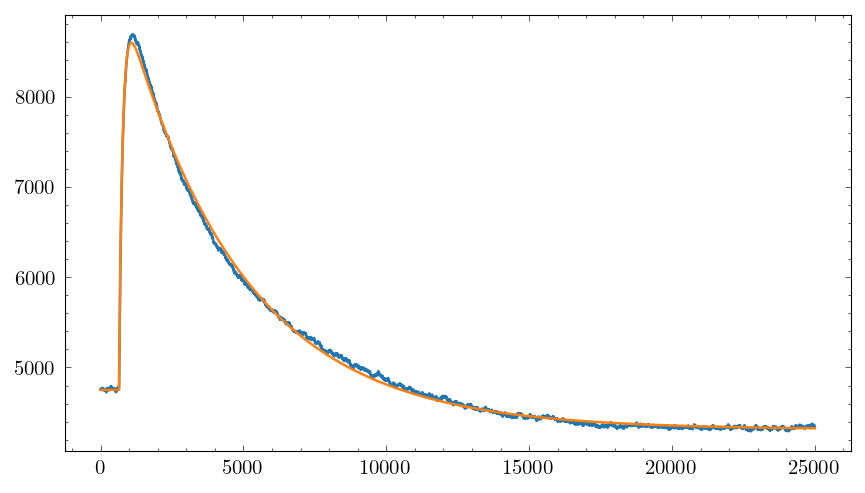

3844.6541323488646 
 4473.80965896259 
##############################


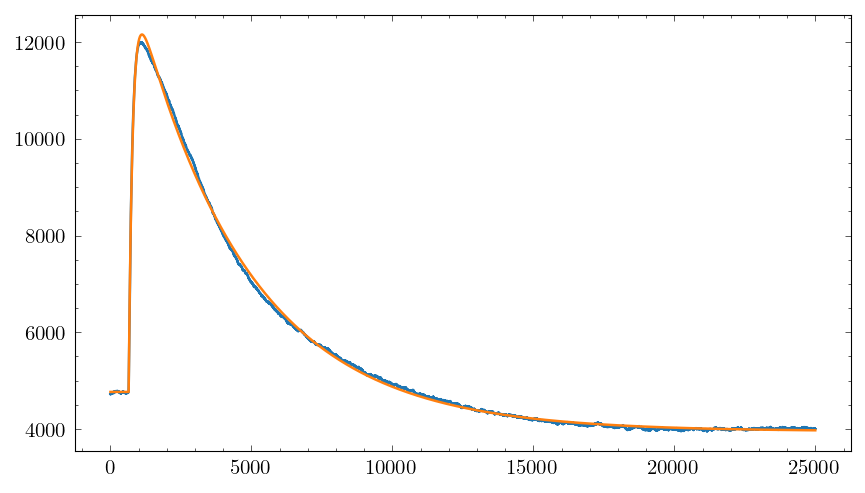

7389.451951694447 
 8751.57839556914 
##############################


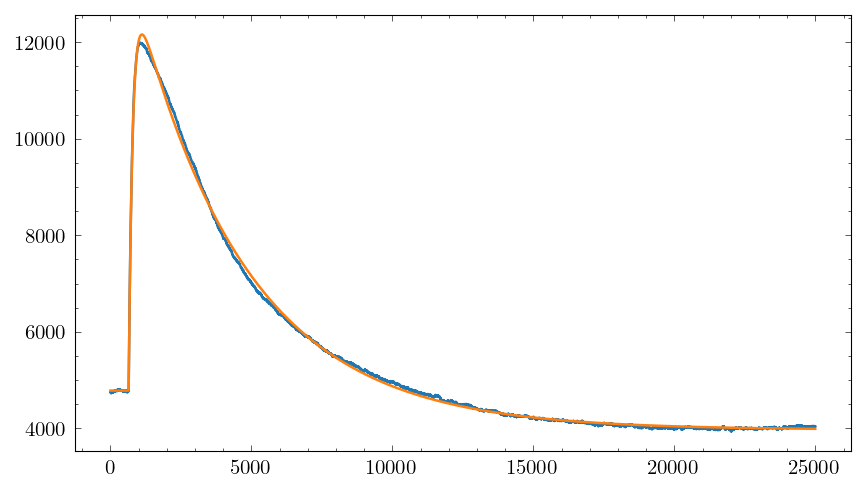

7371.987282876511 
 8740.85431685106 
##############################


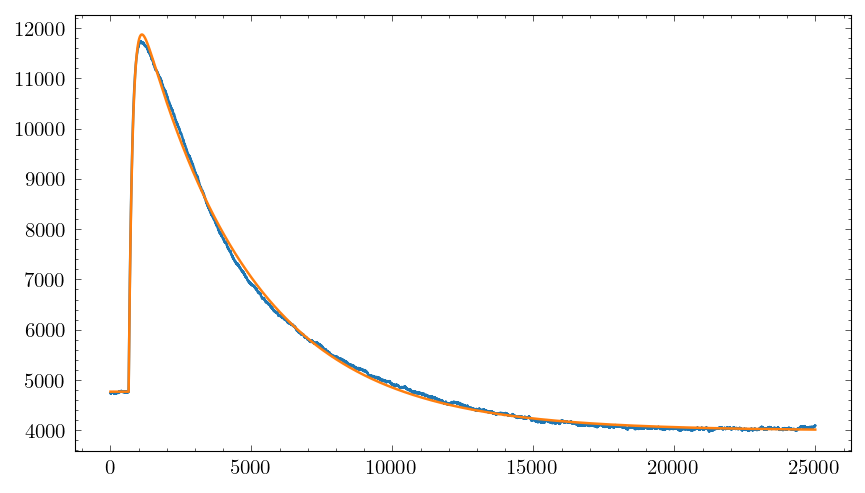

7105.68663671297 
 8429.523785222686 
##############################


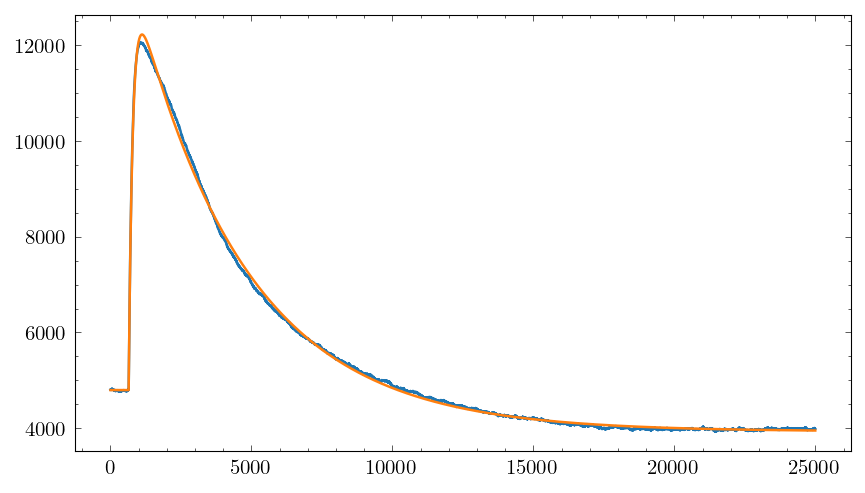

7431.43818557286 
 8836.30649357449 
##############################


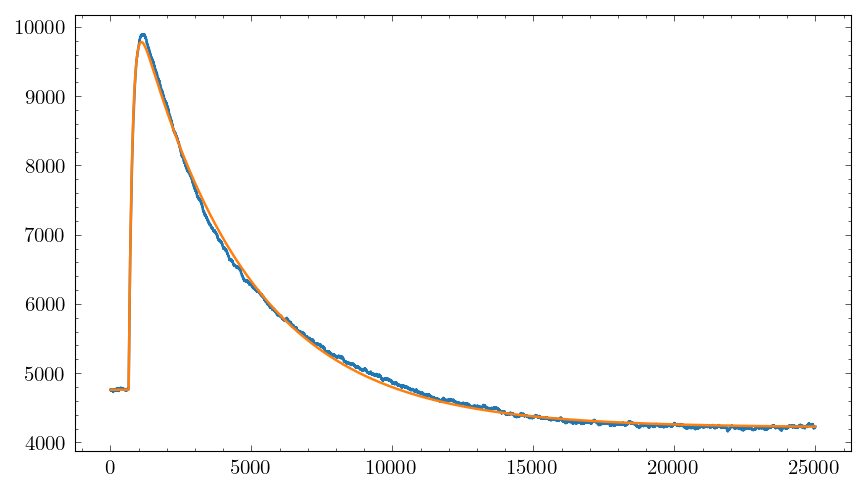

5018.720257456057 
 5929.032188955854 
##############################


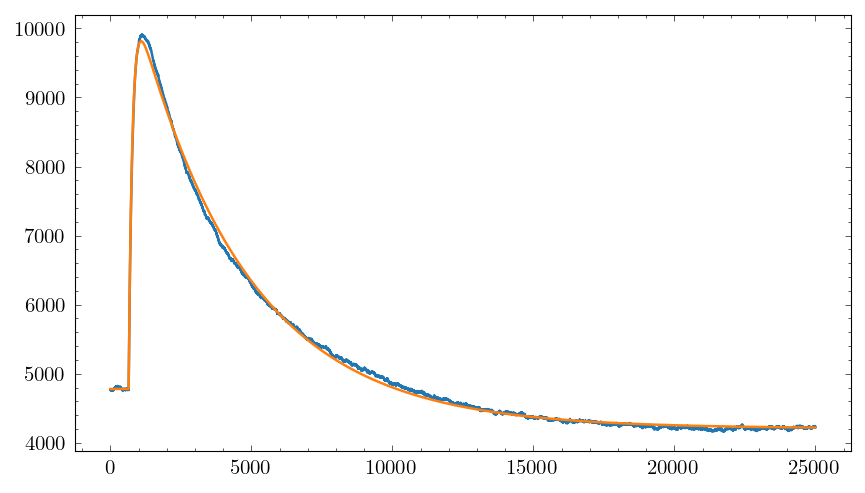

5035.589226994777 
 5926.418447508634 
##############################


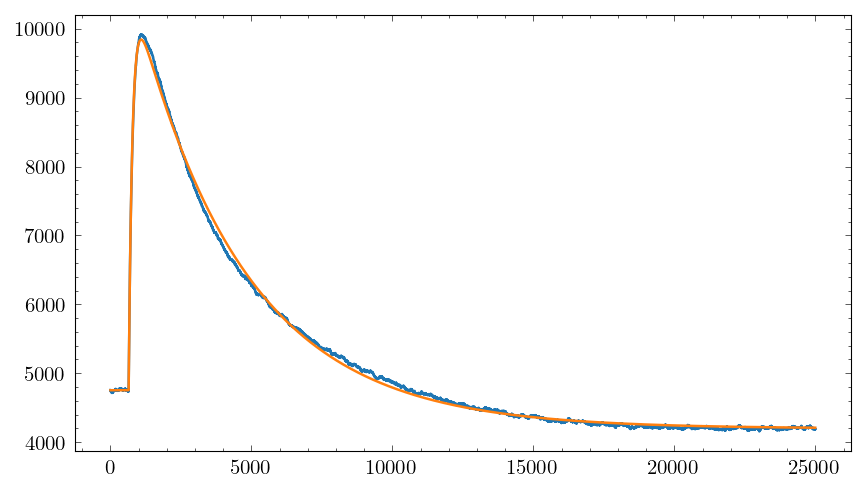

5088.426263661387 
 5987.766342970691 
##############################


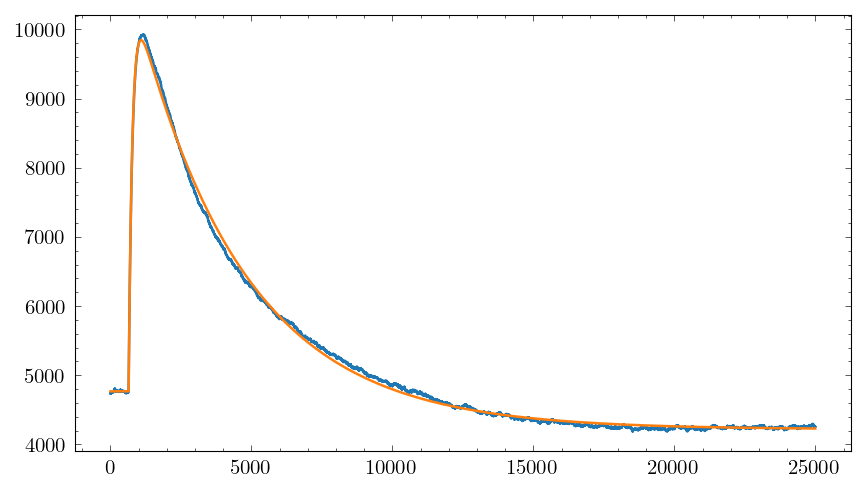

5076.812364128407 
 5976.86768912779 
##############################


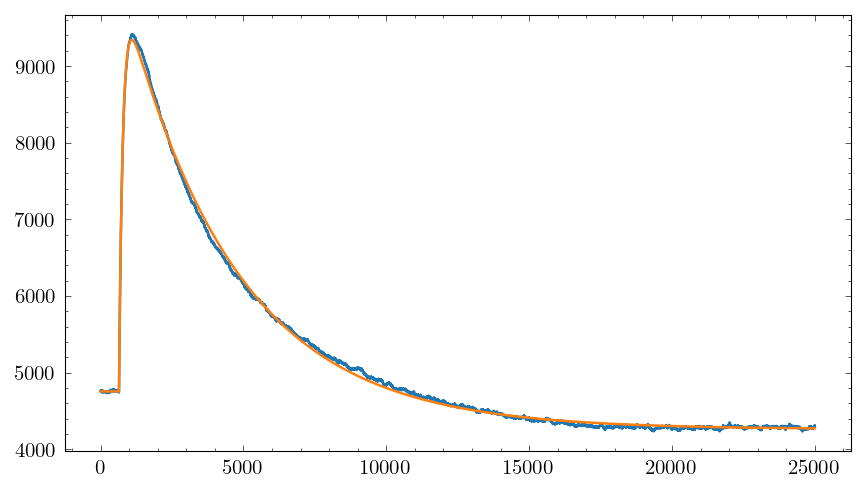

4590.310880142857 
 5407.232189692631 
##############################


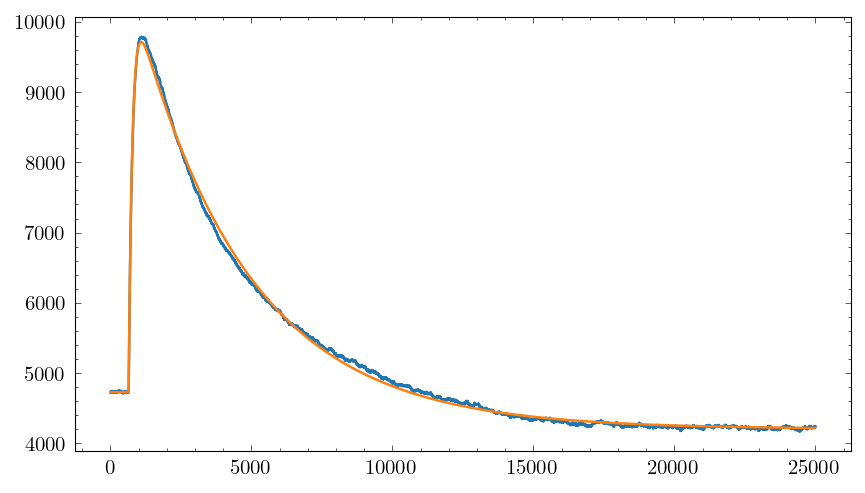

4983.605598373104 
 5844.130088154326 
##############################


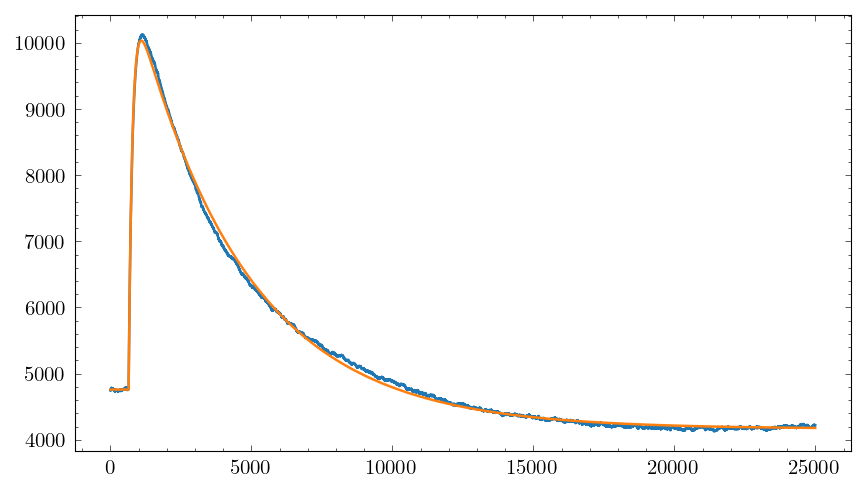

5273.149001607806 
 6208.798837751539 
##############################


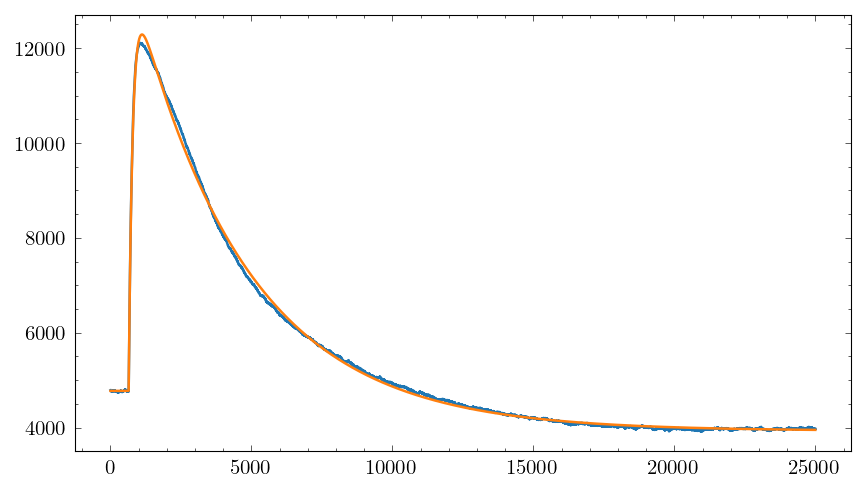

7511.548835114012 
 8907.428492486673 
##############################


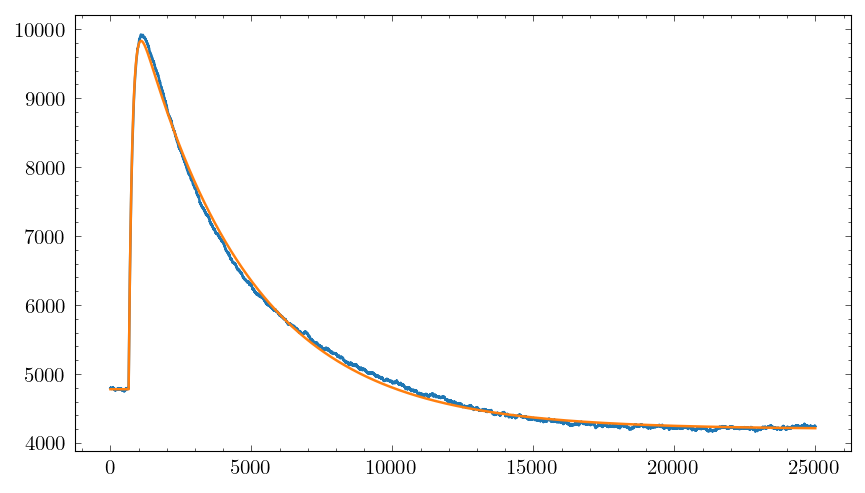

5052.360208751969 
 5936.103081338222 
##############################


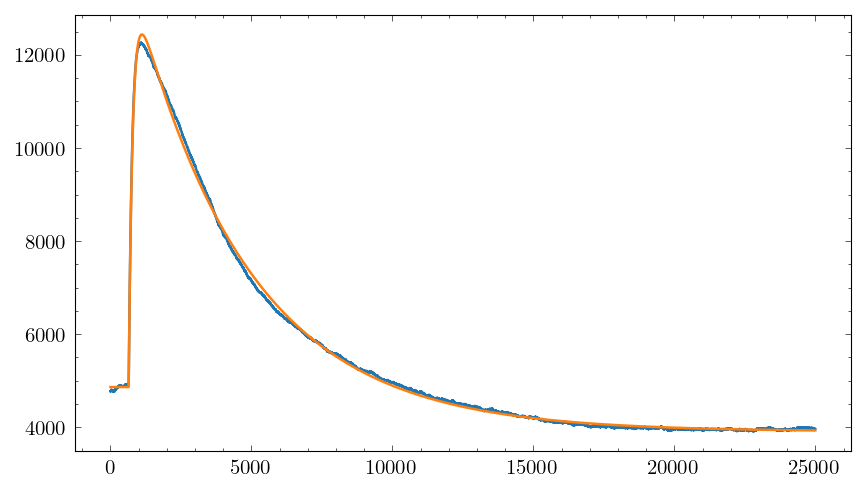

7574.737413197619 
 8963.552490466756 
##############################


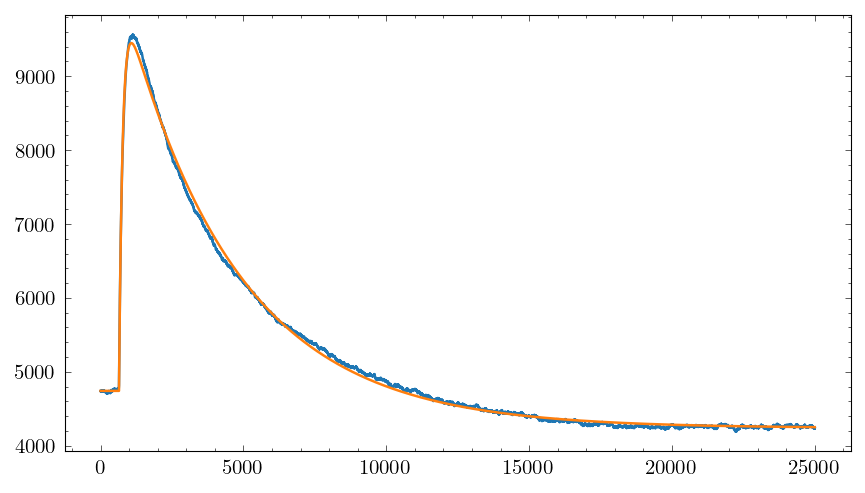

4705.549669663611 
 5499.045464777731 
##############################


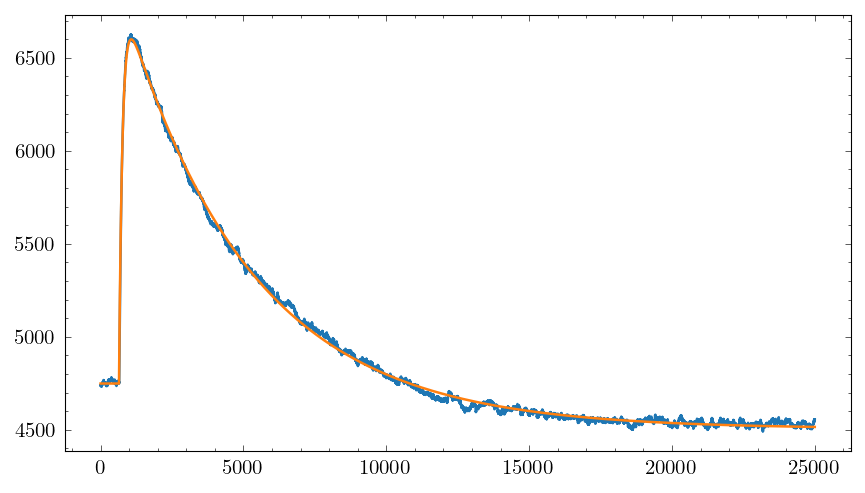

1849.5104803454478 
 2123.422285276863 
##############################


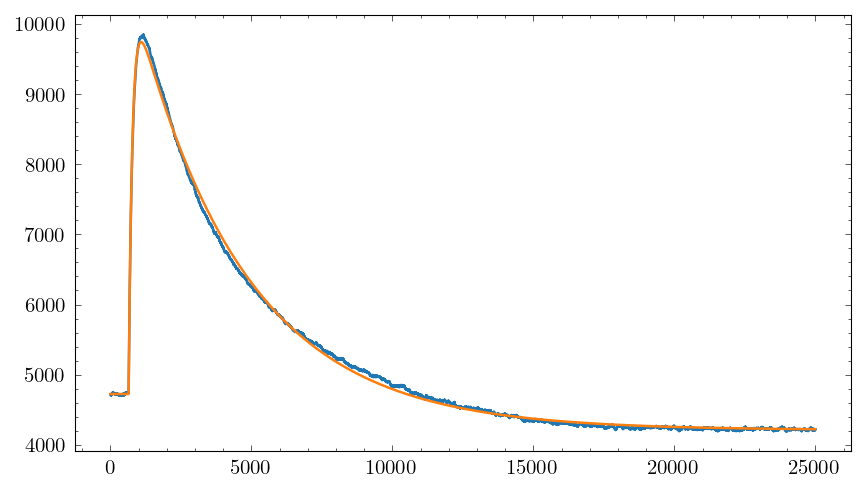

5014.39886233596 
 5891.052052789748 
##############################


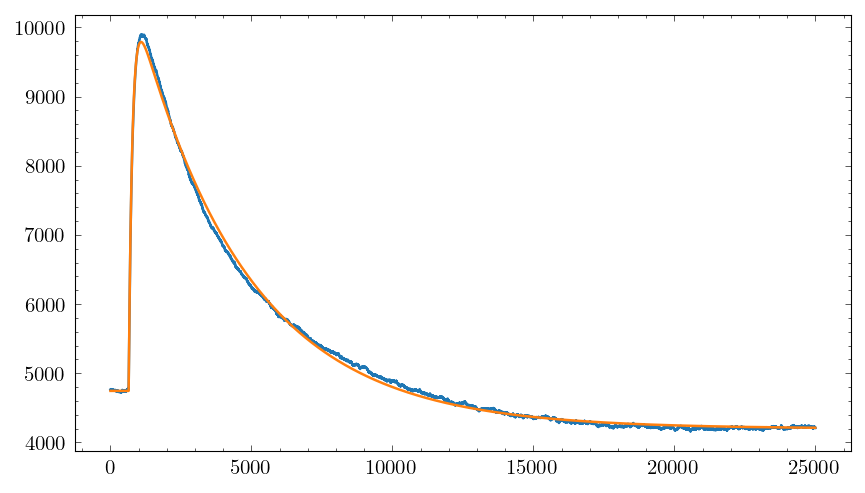

5045.326753459769 
 5913.690203537844 
##############################


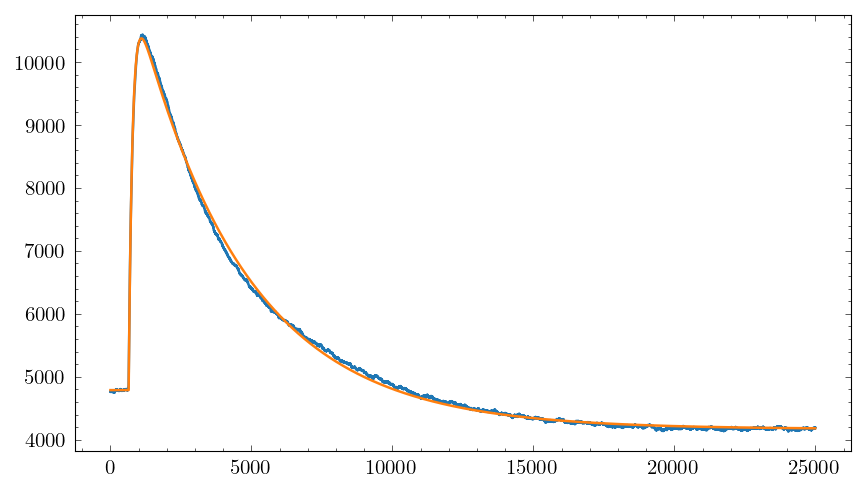

5587.158775133872 
 6612.993110438397 
##############################


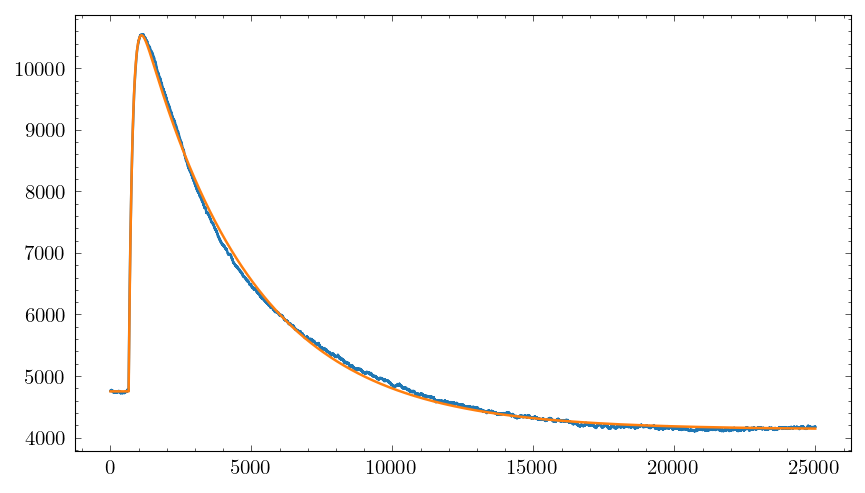

5787.125418555627 
 6847.427034992944 
##############################


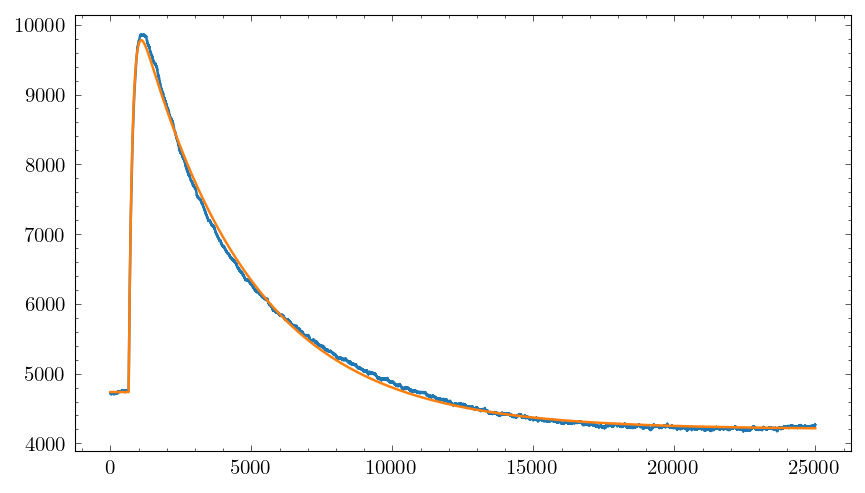

5042.276438328062 
 5929.284445382304 
##############################


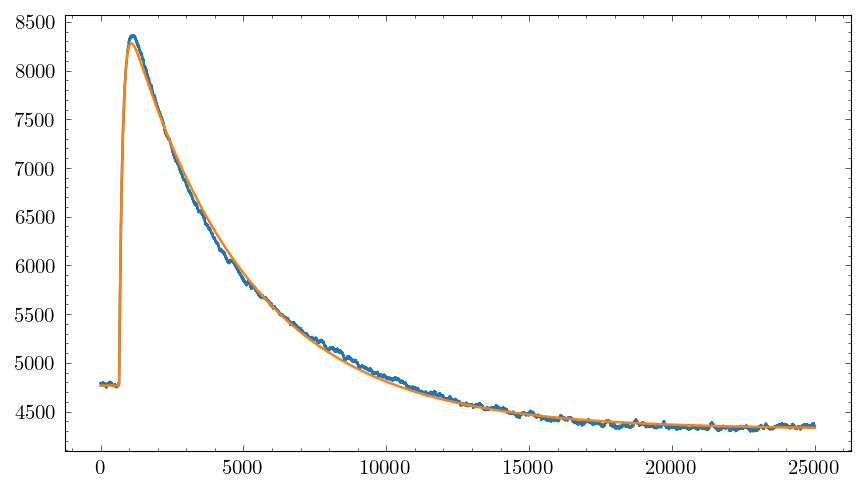

3512.2193855165606 
 4074.8063423598246 
##############################


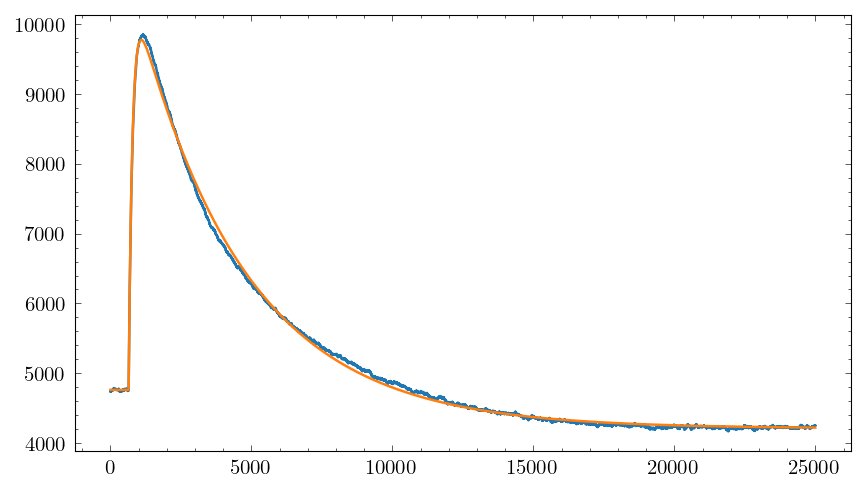

5012.896215927027 
 5914.459788789169 
##############################


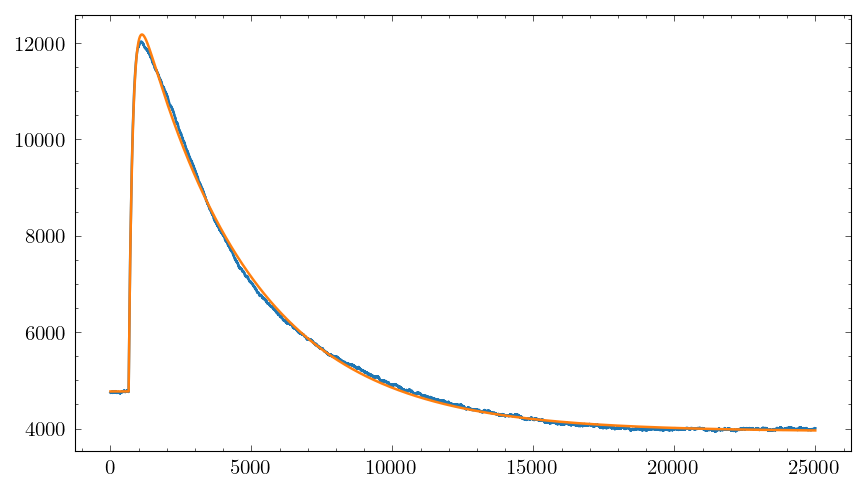

7404.981822387018 
 8784.617455840593 
##############################


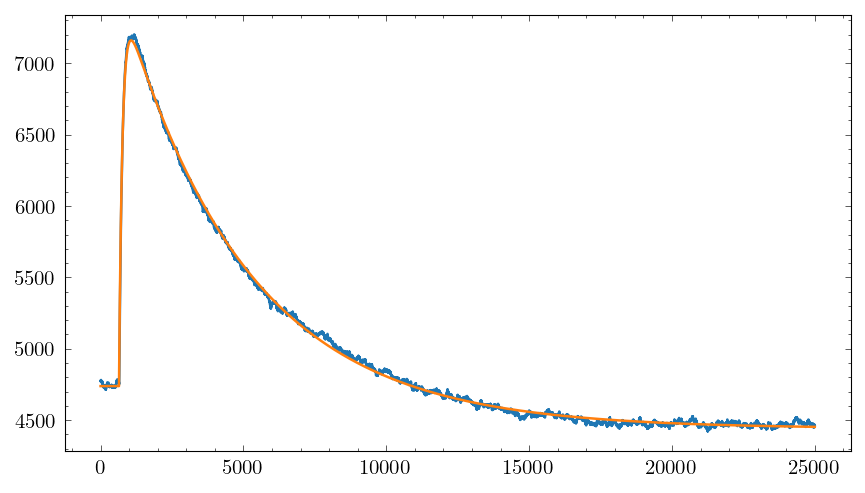

2421.582681784458 
 2779.543193699314 
##############################


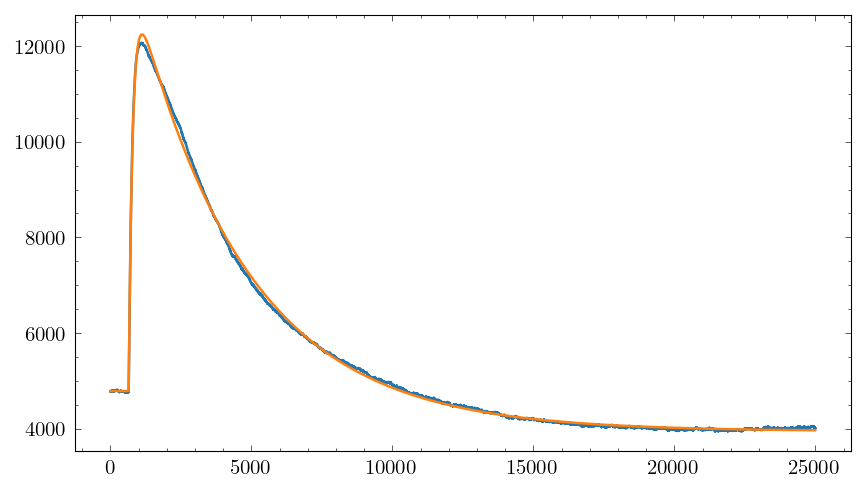

7451.399268354779 
 8860.52906071376 
##############################


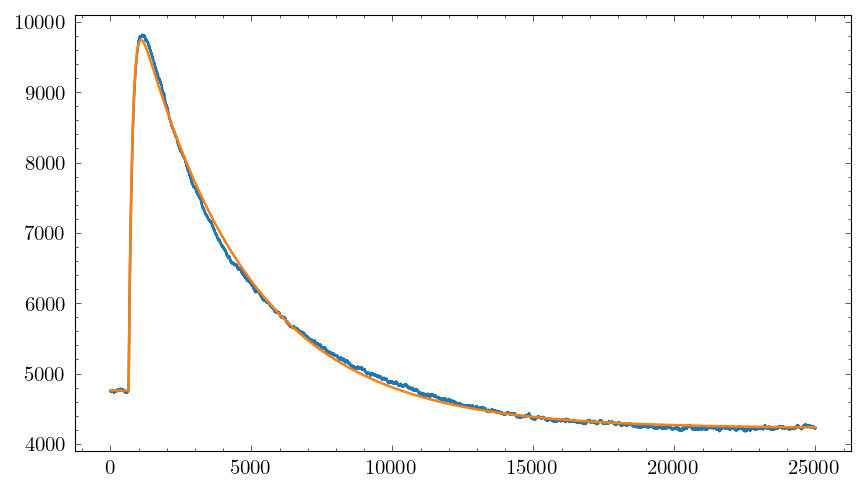

4982.550418082055 
 5859.5077759046235 
##############################


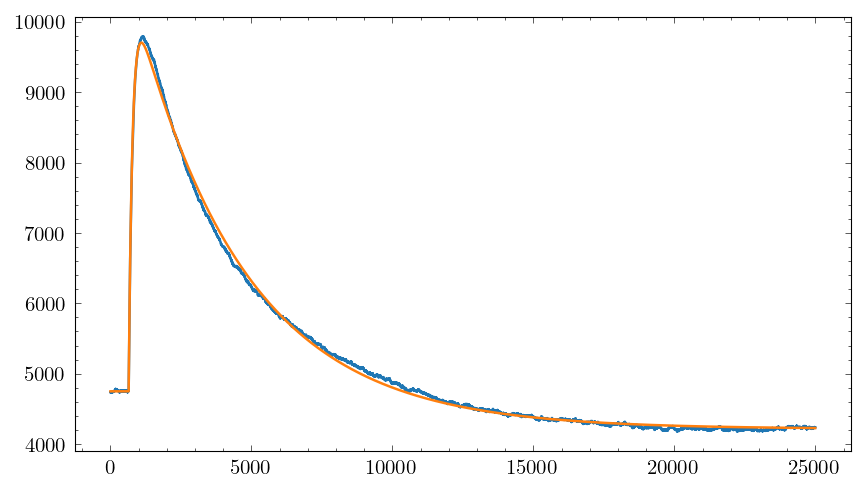

4954.863158598893 
 5836.864955558244 
##############################


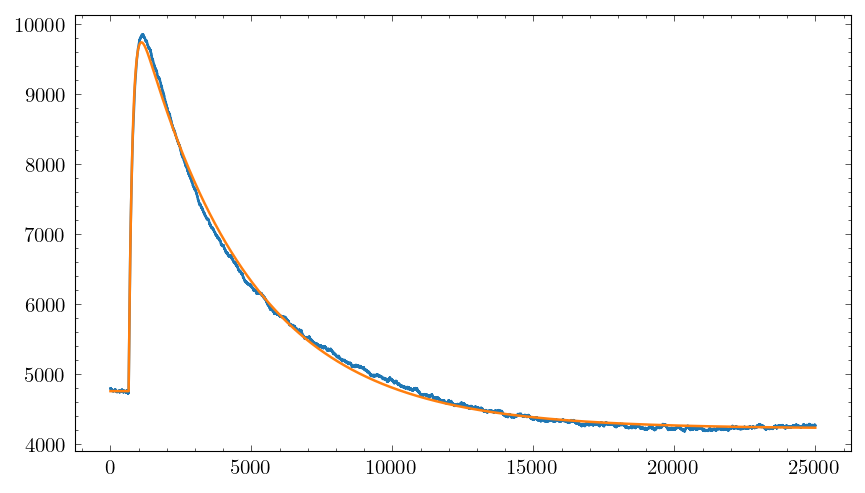

4983.921780789244 
 5885.30128379414 
##############################


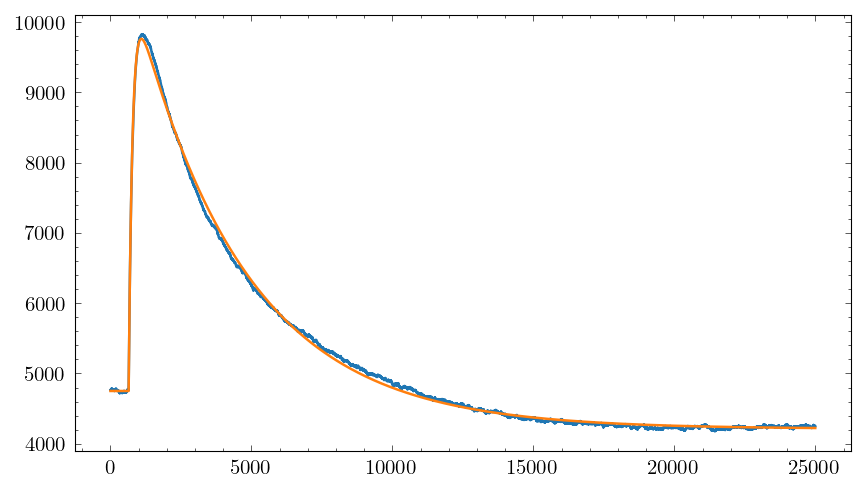

5010.182851261217 
 5911.65561734497 
##############################


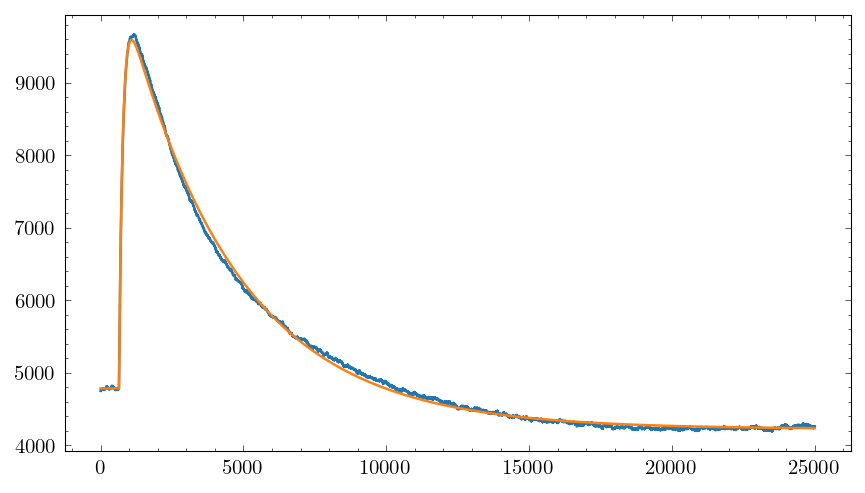

4804.538744227808 
 5657.271818746517 
##############################


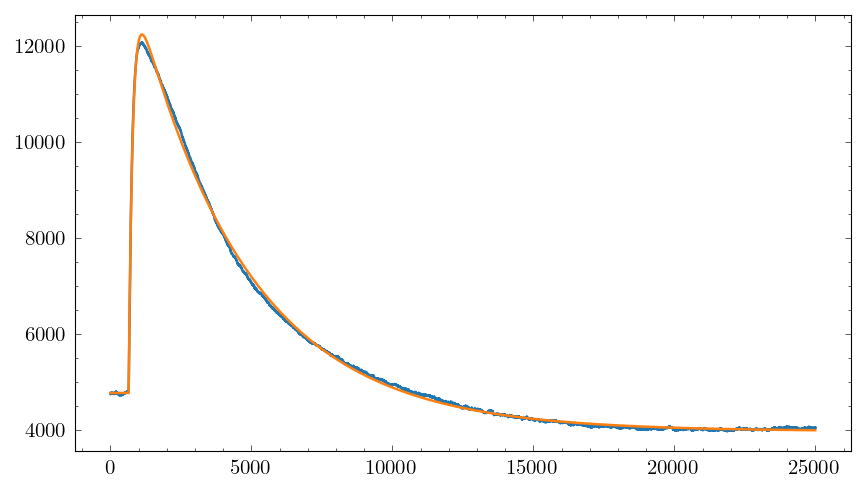

7468.69695246439 
 8856.219455877846 
##############################


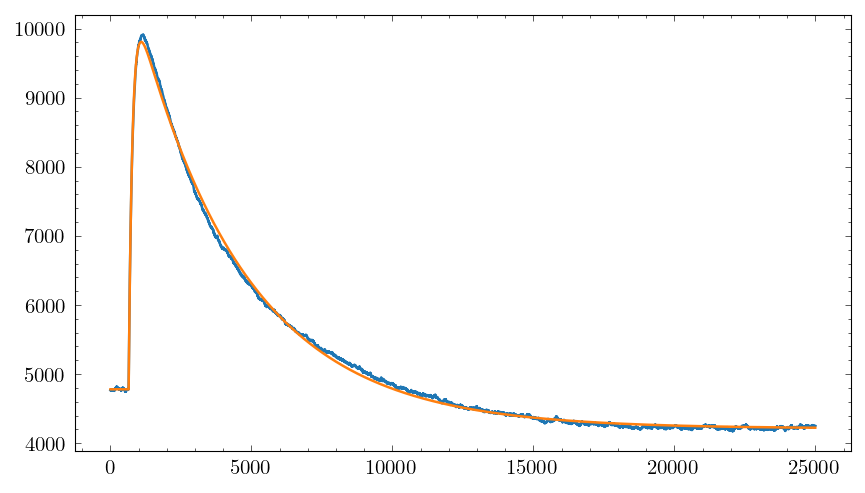

5026.164206243254 
 5927.694310209105 
##############################


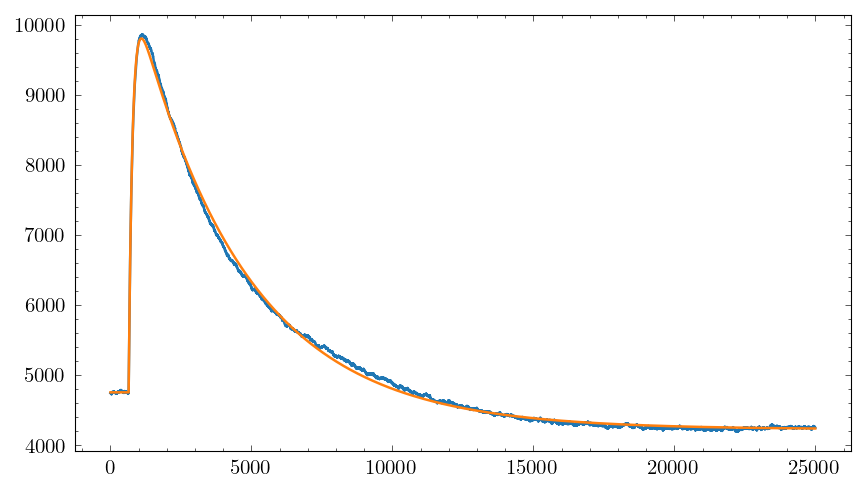

5050.797567220722 
 5966.925050389094 
##############################


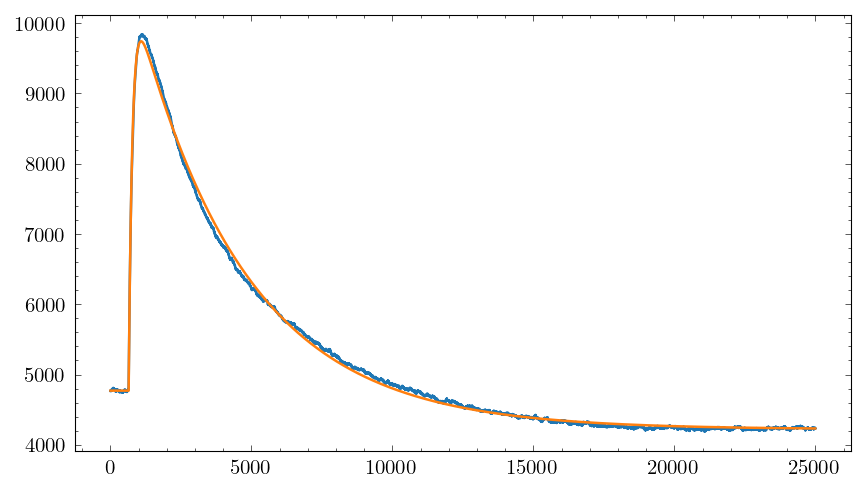

4970.489833086262 
 5843.544534281889 
##############################


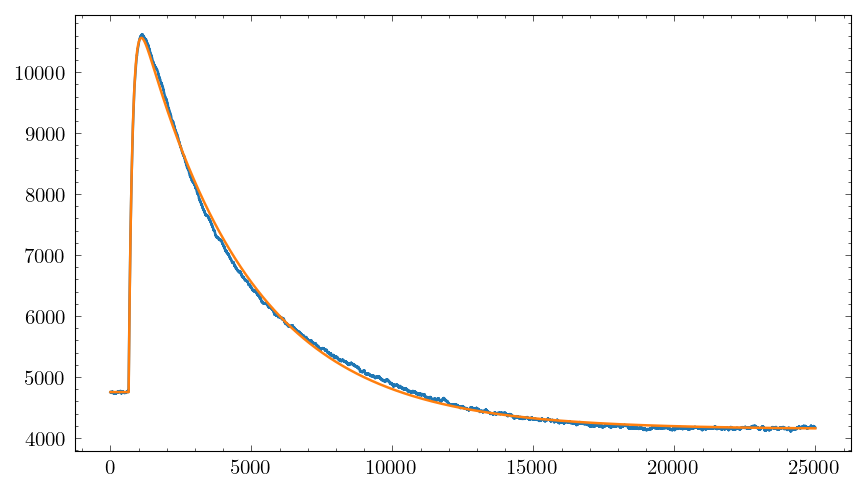

5809.7779554049375 
 6866.146706588002 
##############################


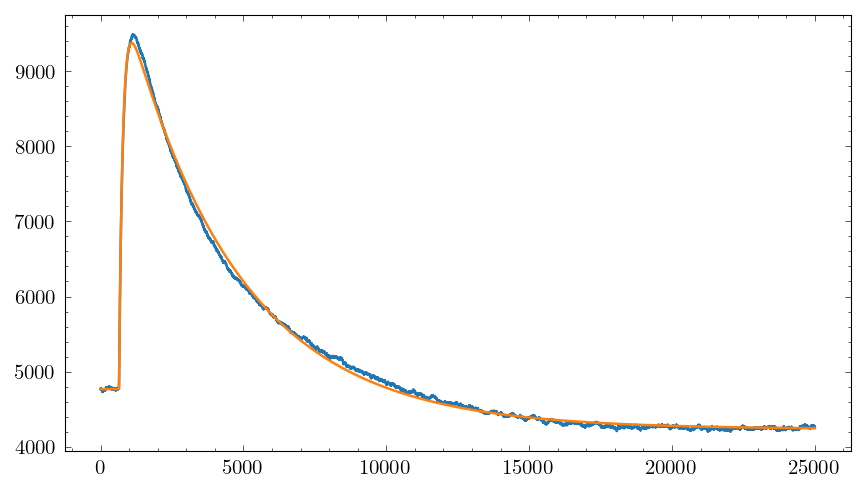

4607.558704995959 
 5424.857919540429 
##############################


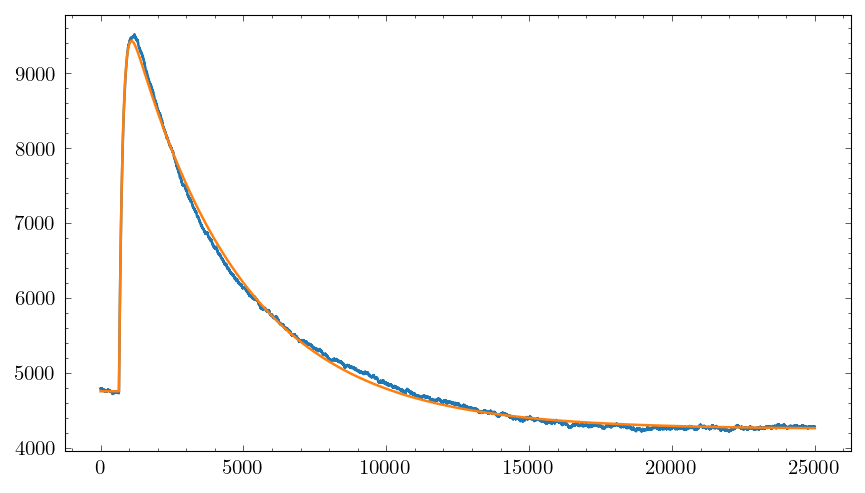

4676.159285350786 
 5495.241921667981 
##############################


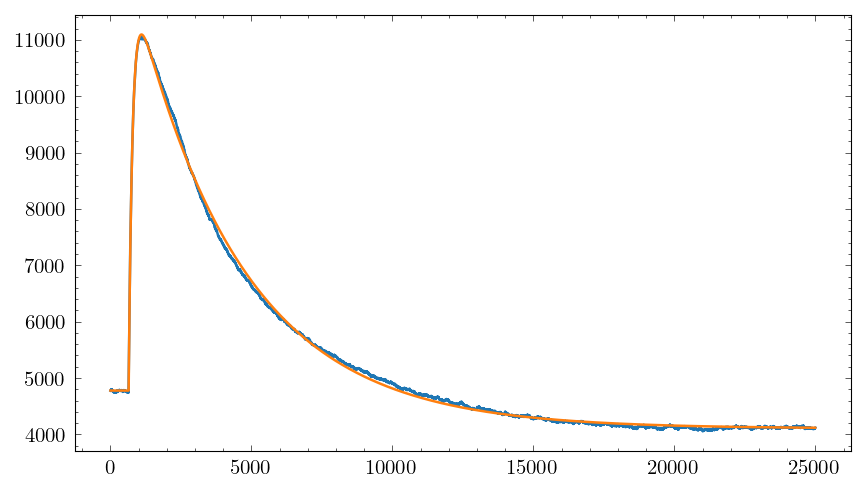

6317.082664229368 
 7488.189411037323 
##############################


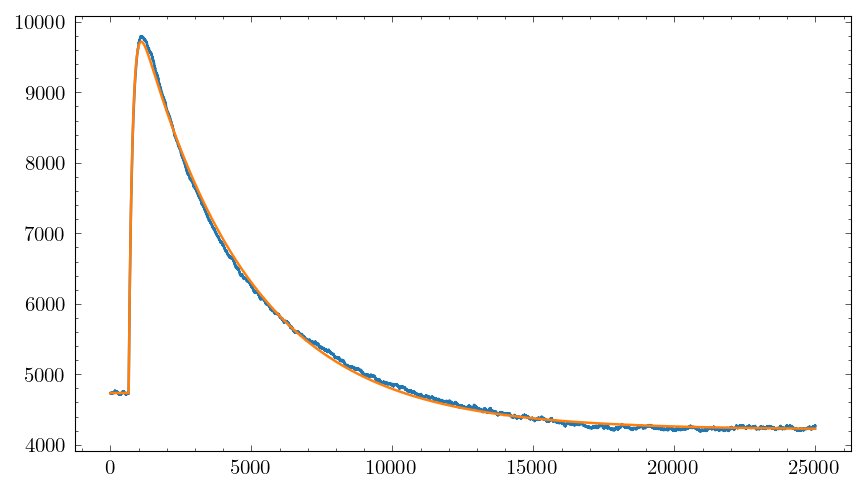

4983.78650551526 
 5872.178809954666 
##############################


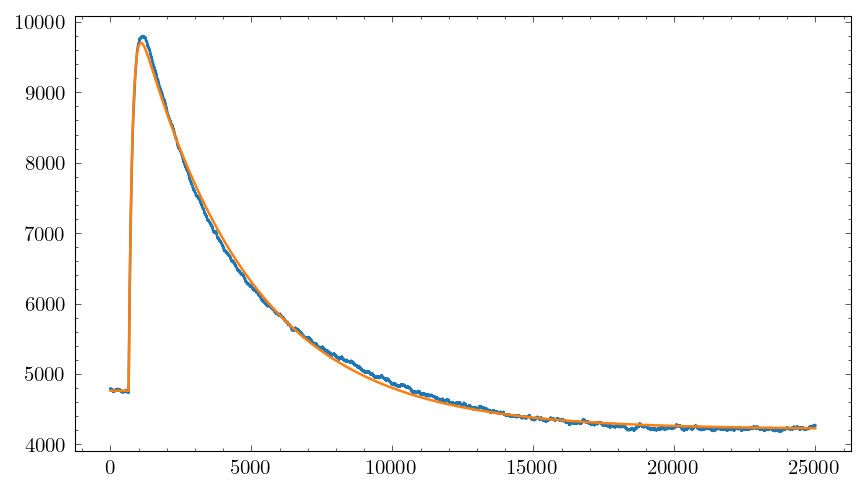

4940.284544611952 
 5791.038601281743 
##############################


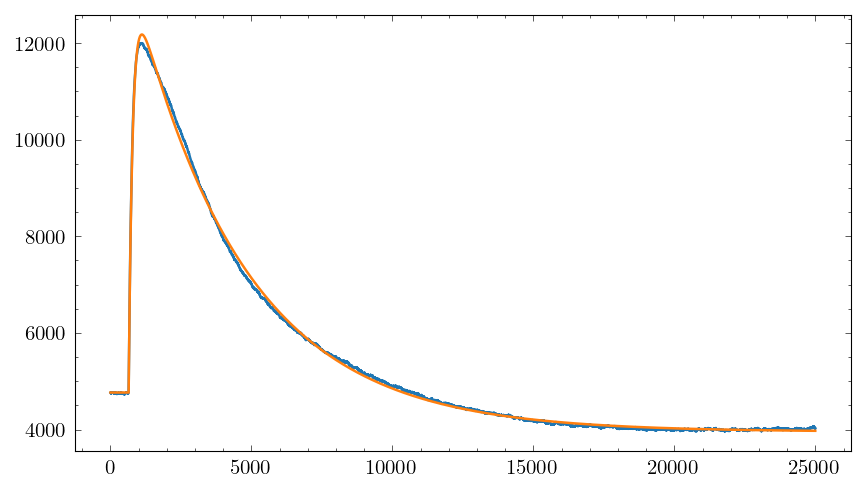

7412.825912312141 
 8791.795651030672 
##############################


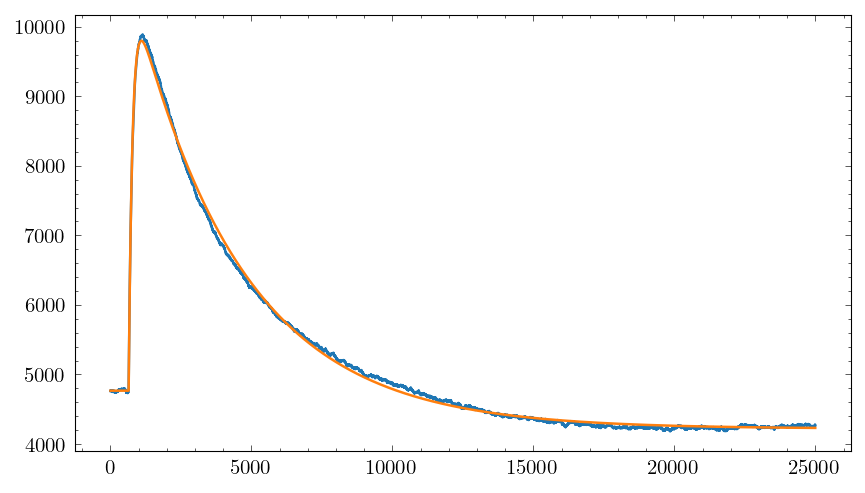

5031.902792950305 
 5952.781350665423 
##############################


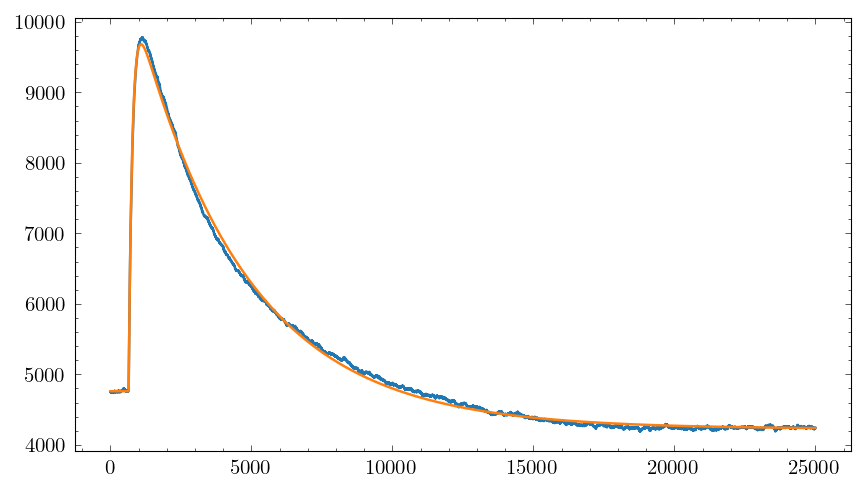

4921.363216570118 
 5783.816122043251 
##############################


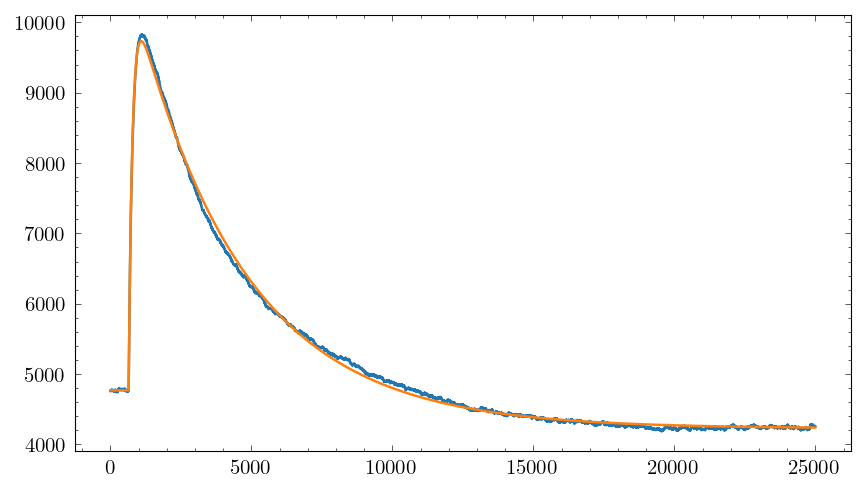

4963.1609290499255 
 5848.57937848297 
##############################


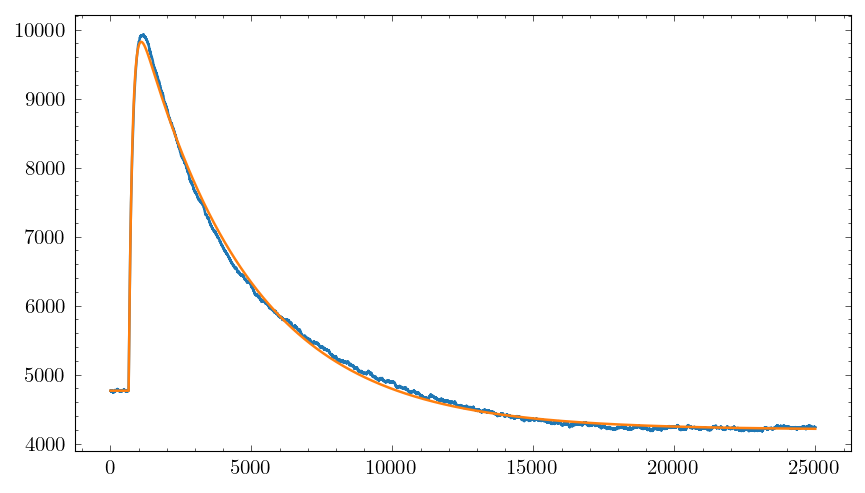

5054.8591812535415 
 5954.842141993412 
##############################


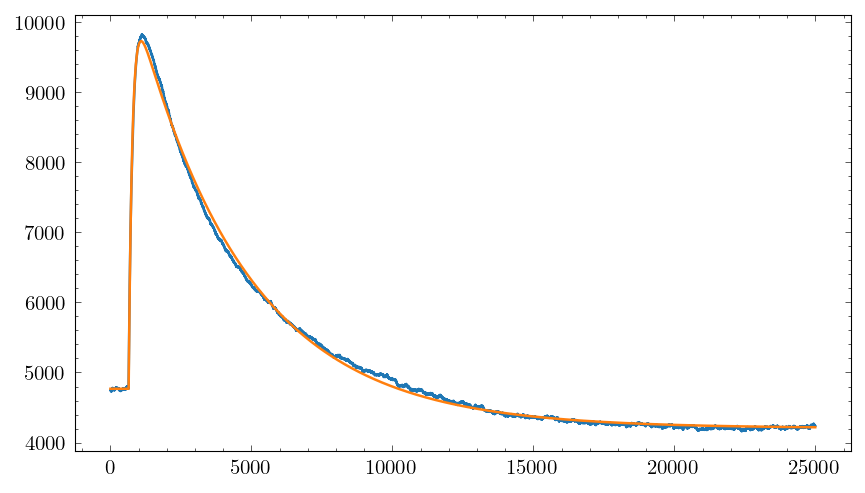

4958.891306384618 
 5825.237360560862 
##############################


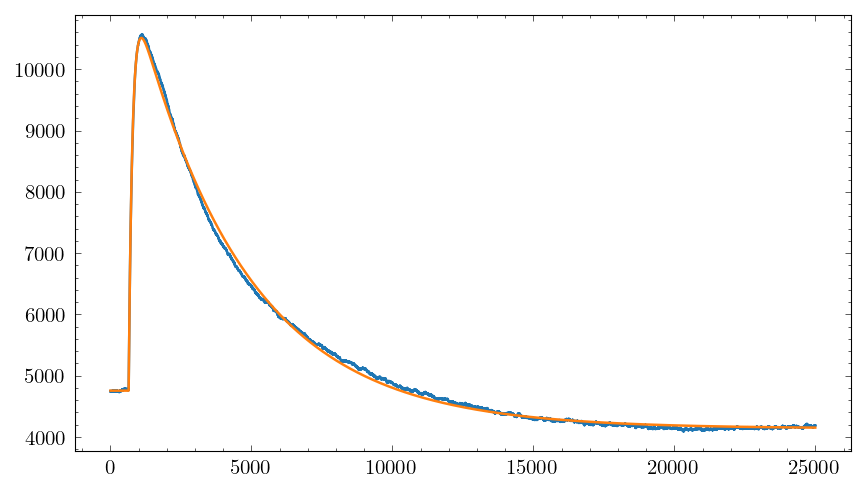

5755.277200263323 
 6792.423675717401 
##############################


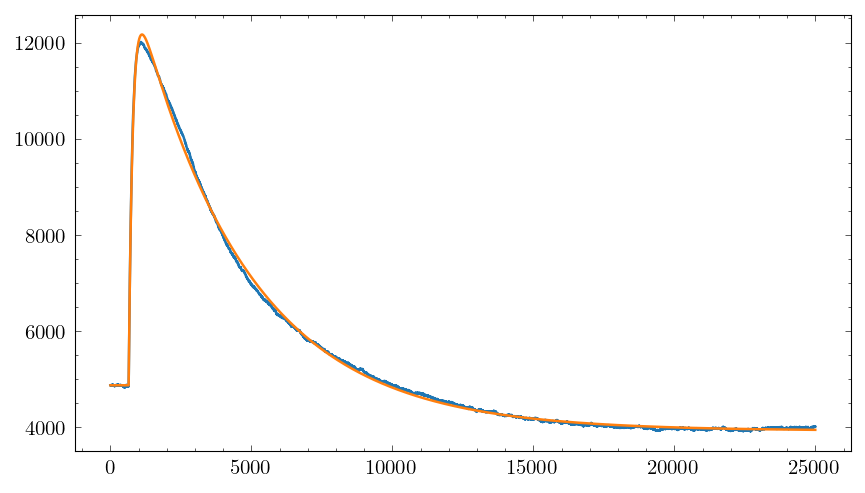

7289.868797920691 
 8686.28016283704 
##############################


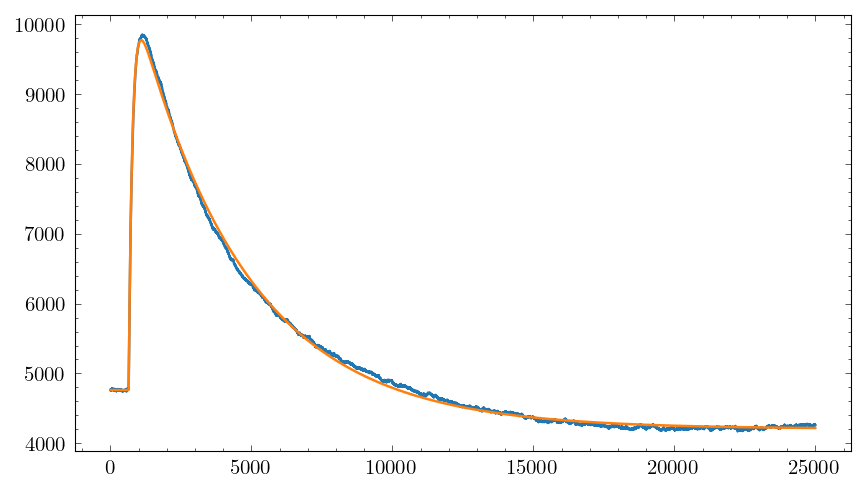

5008.388793653859 
 5903.909724704992 
##############################


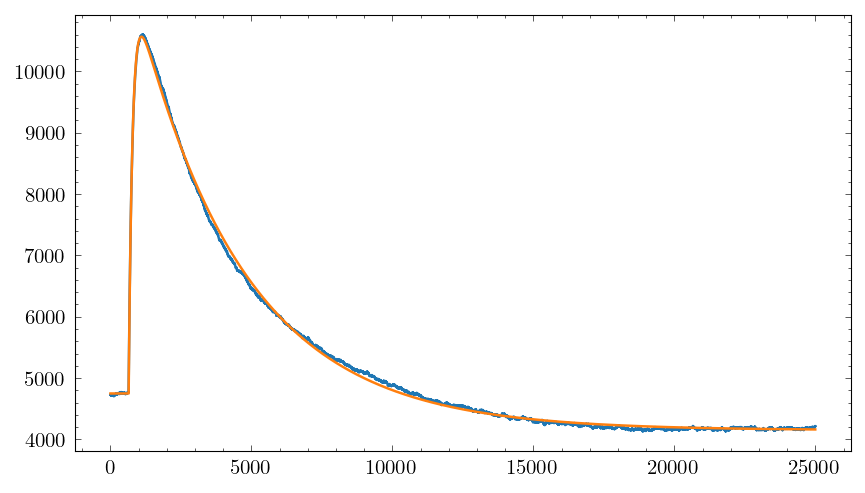

5817.36228868151 
 6886.8989440770965 
##############################


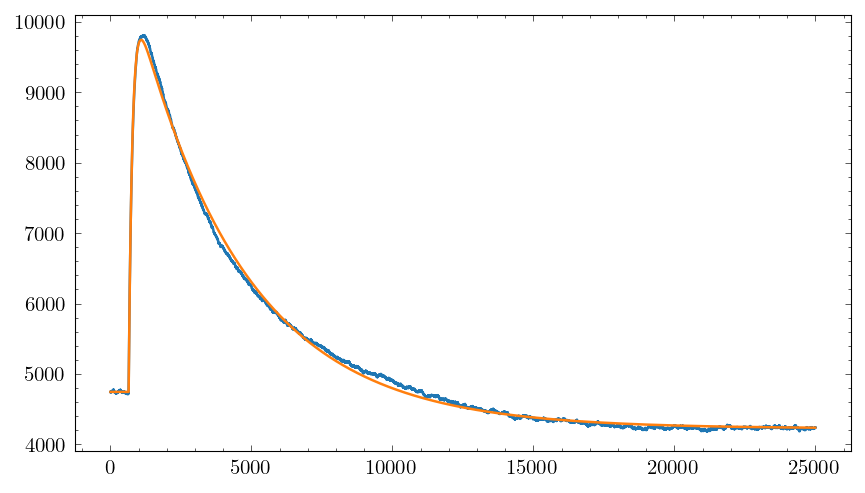

4999.284533890413 
 5881.698228152116 
##############################


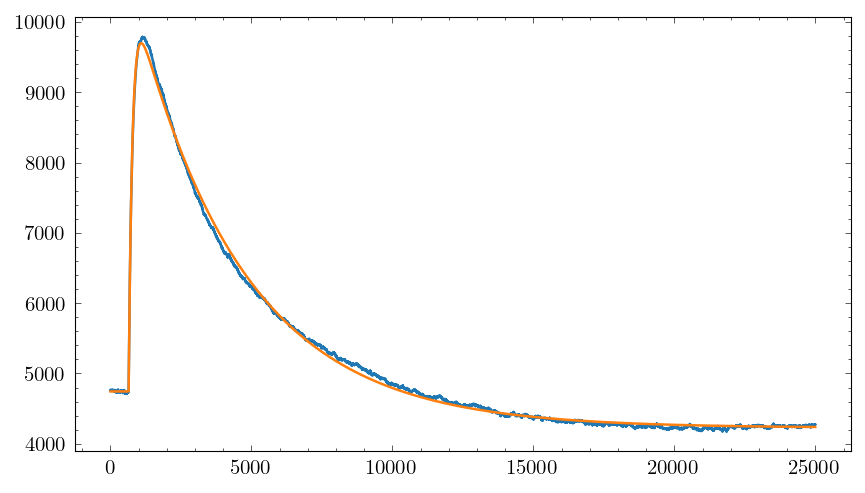

4952.367940899026 
 5834.622180210221 
##############################


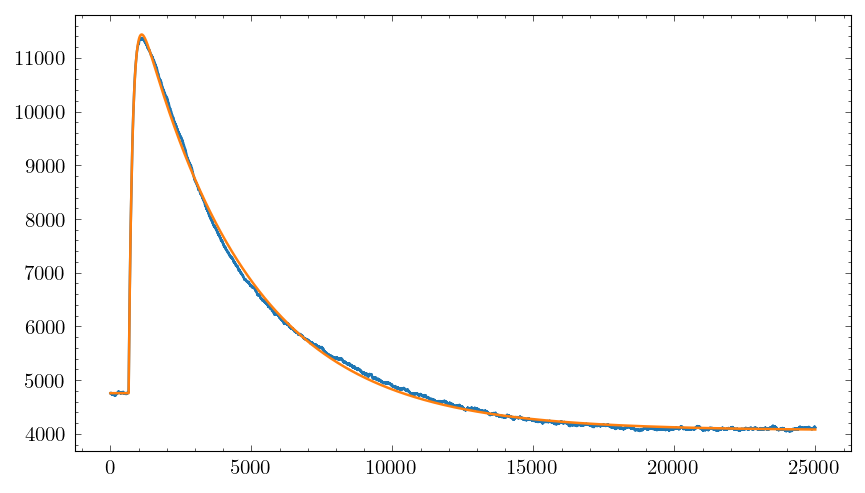

6679.743056314817 
 7923.003006264024 
##############################


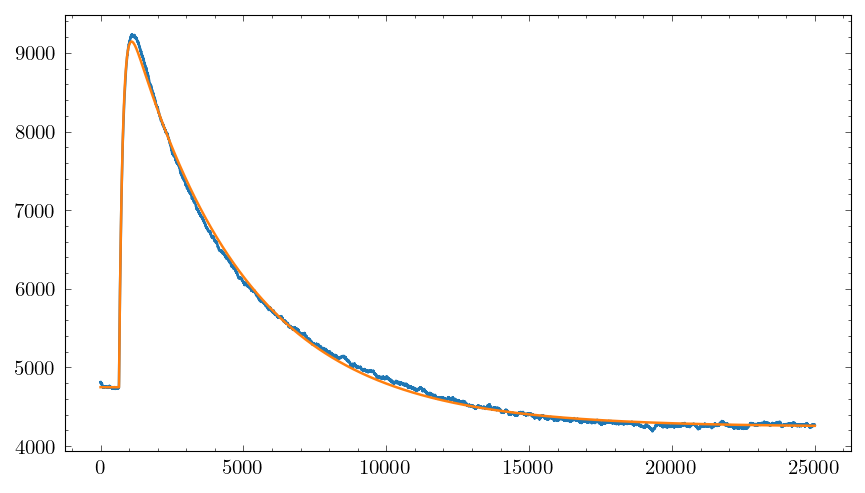

4395.541082513991 
 5140.73004279224 
##############################


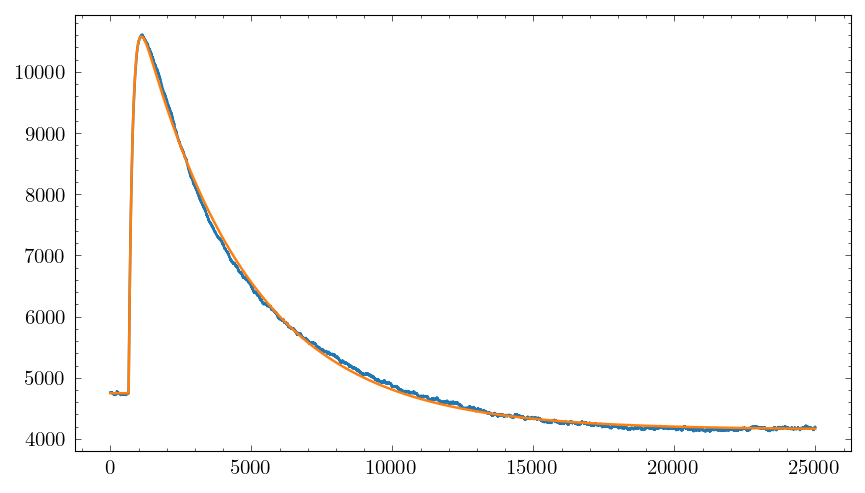

5832.388147432116 
 6903.146606658834 
##############################


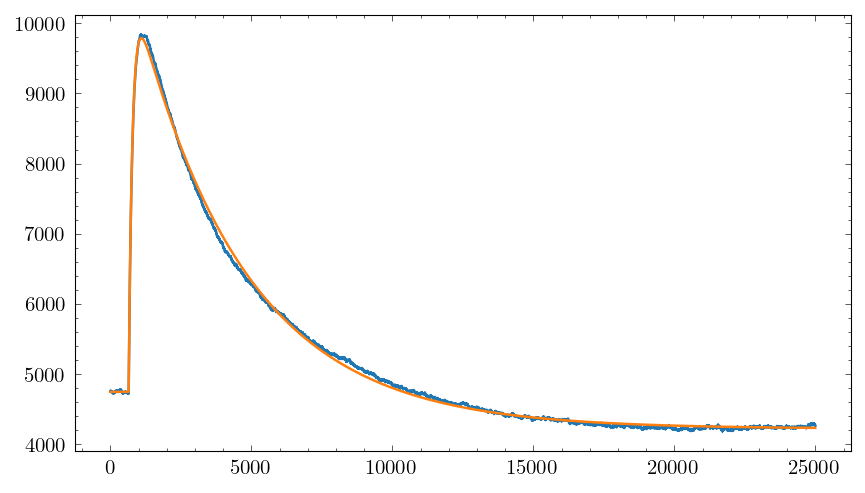

5041.499924081577 
 5951.655118955891 
##############################


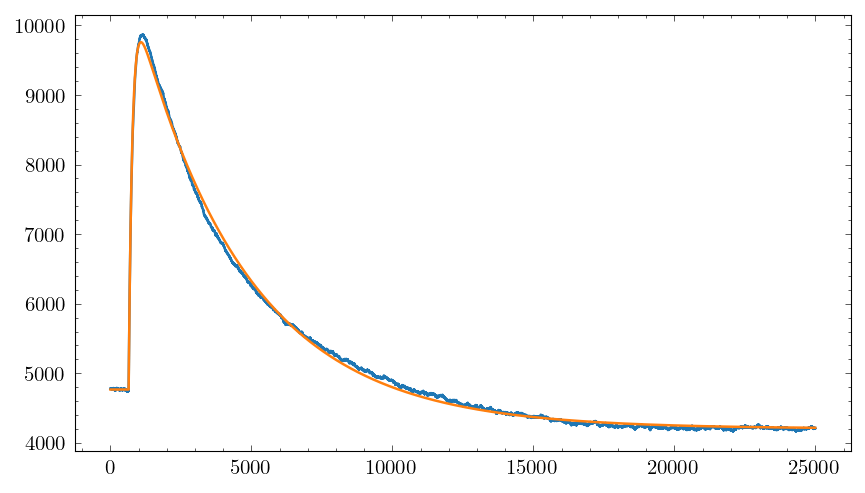

4991.150264548791 
 5847.232126034337 
##############################


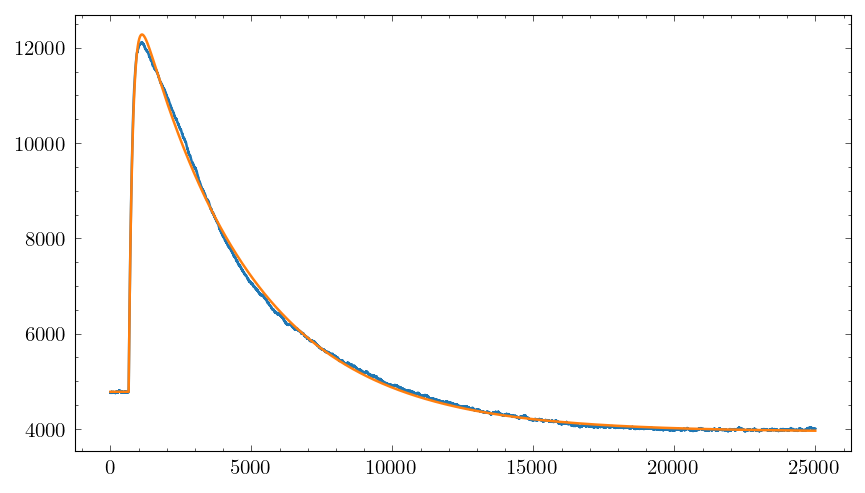

7495.6359629017825 
 8890.117267436512 
##############################


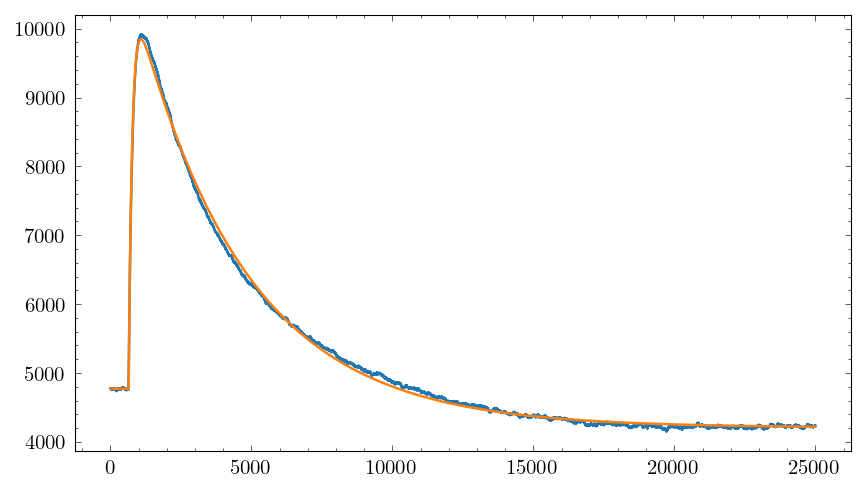

5072.339337796448 
 5952.266875961621 
##############################


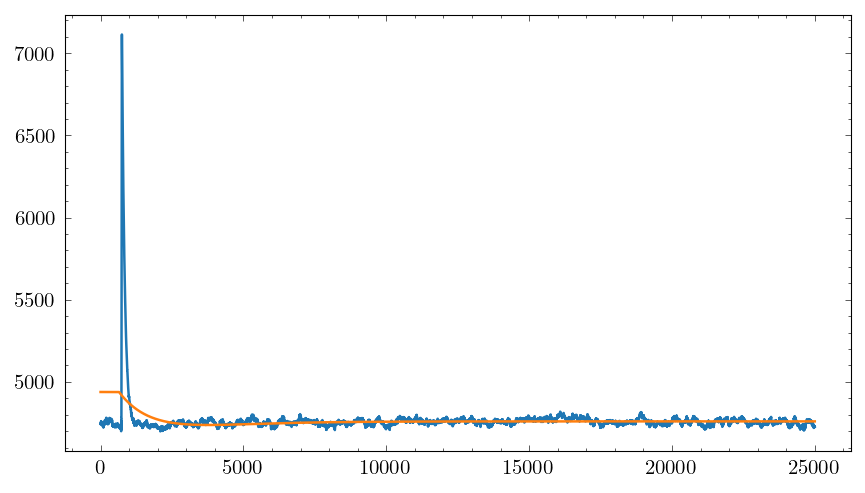

0.0 
 -8547.914549434212 
##############################


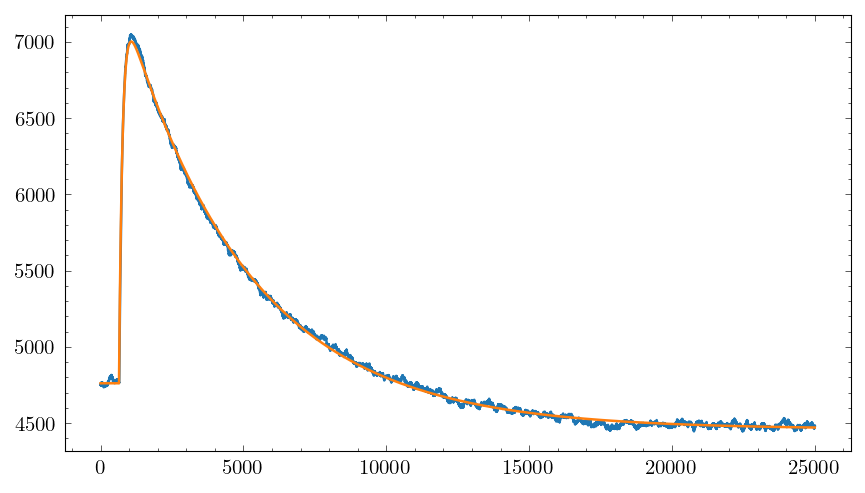

2240.4552432570918 
 2582.478274784439 
##############################


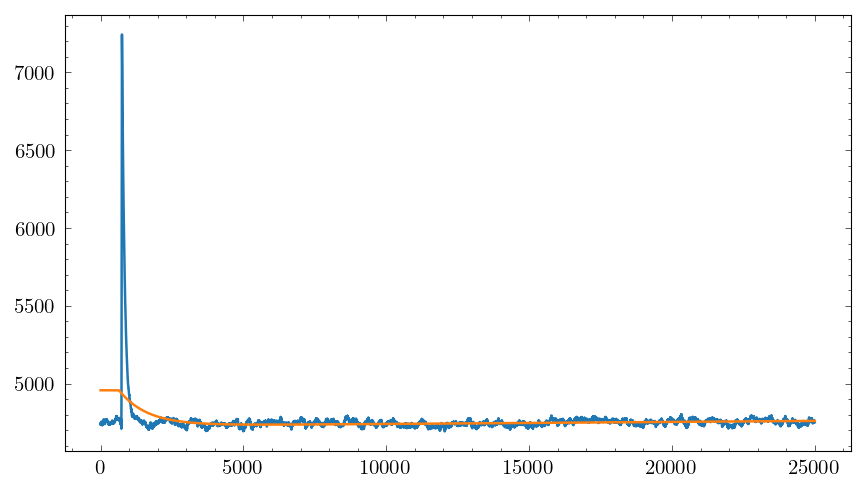

0.0 
 -228.8438191689925 
##############################


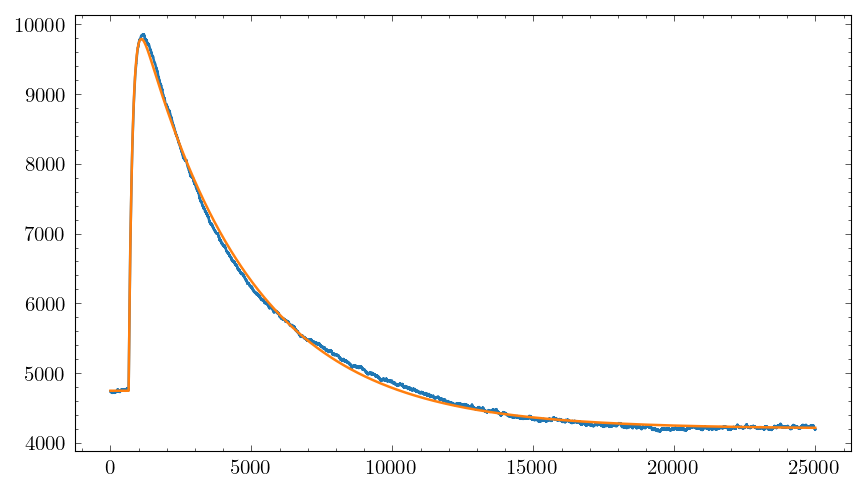

5043.10160328925 
 5955.554454655106 
##############################


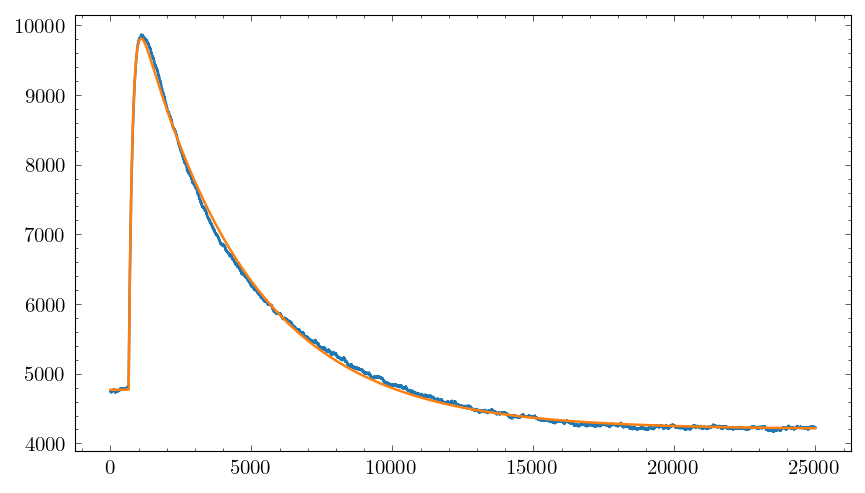

5038.902853046639 
 5933.787939625183 
##############################


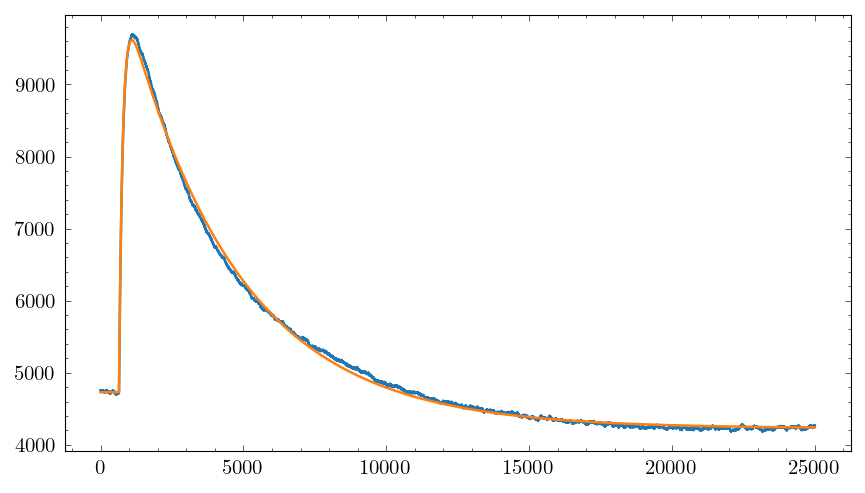

4887.266320657787 
 5756.844629711047 
##############################


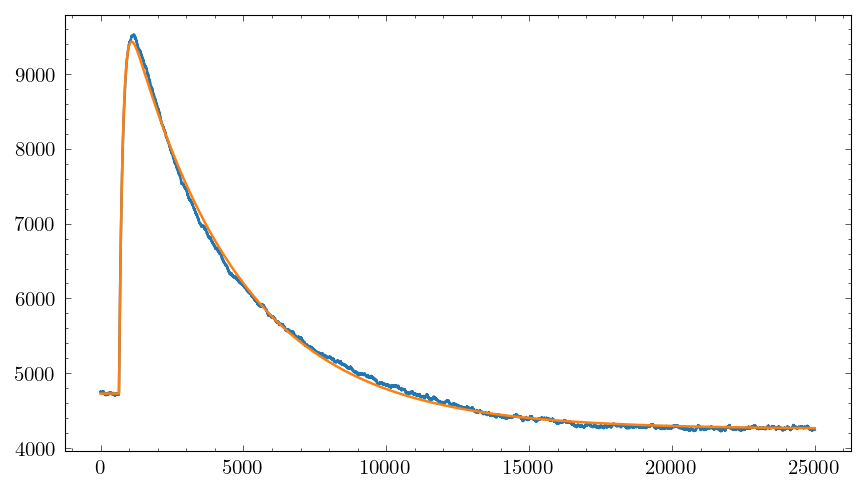

4706.35868875659 
 5537.738337839663 
##############################


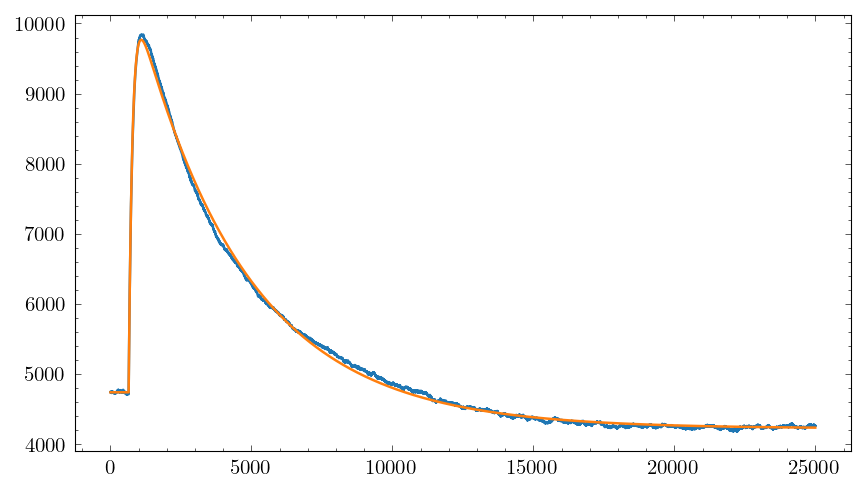

5029.621513508811 
 5923.395198451249 
##############################


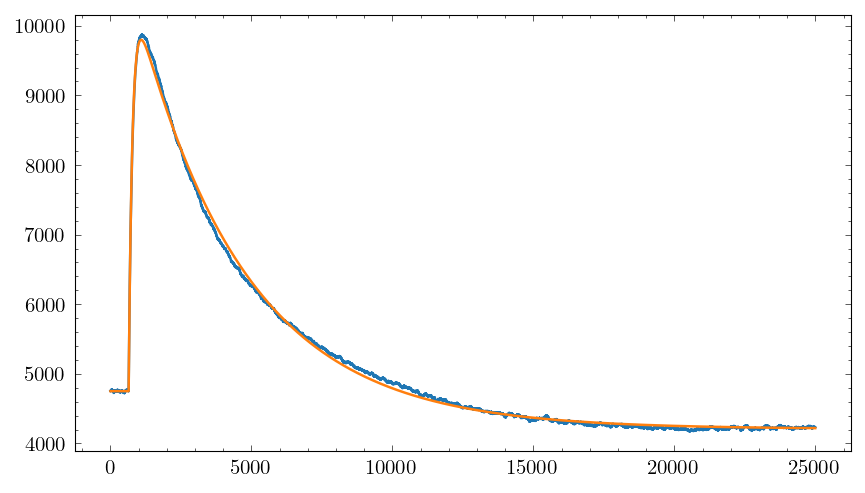

5046.475458681422 
 5938.973339545879 
##############################


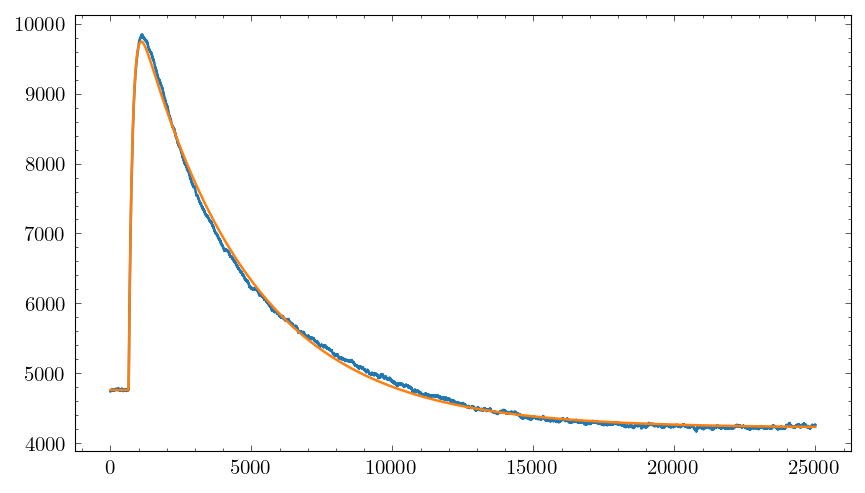

4985.435338296494 
 5872.163694659542 
##############################


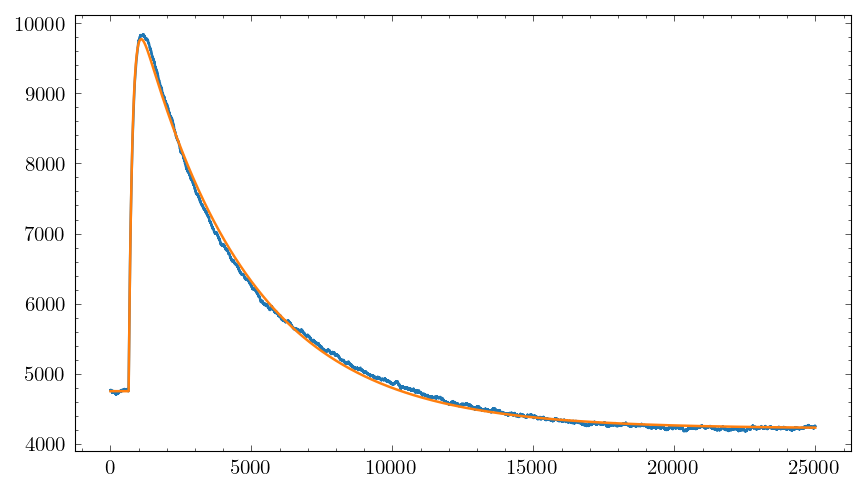

5019.355562280595 
 5912.631713502946 
##############################


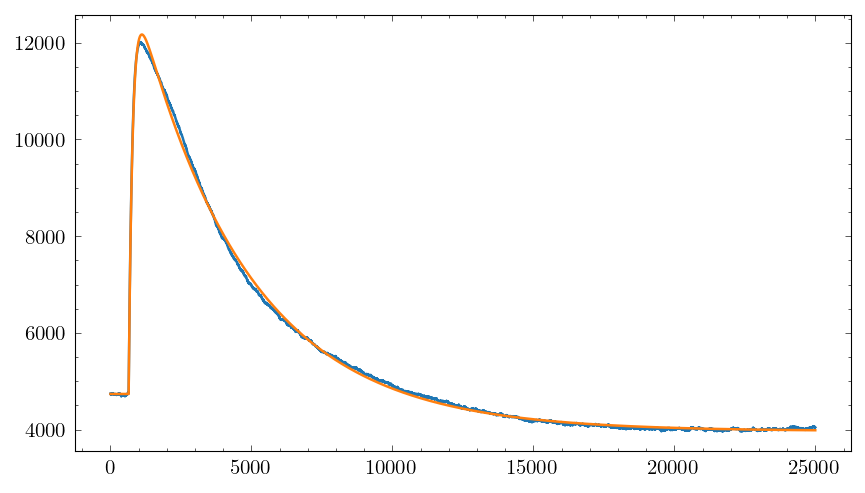

7431.163384516357 
 8812.093836979071 
##############################


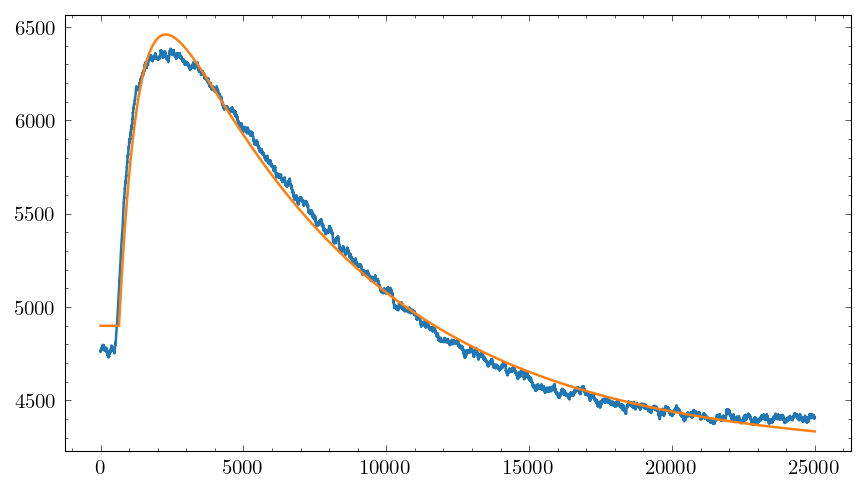

1560.6699175386584 
 2437.3065820698025 
##############################


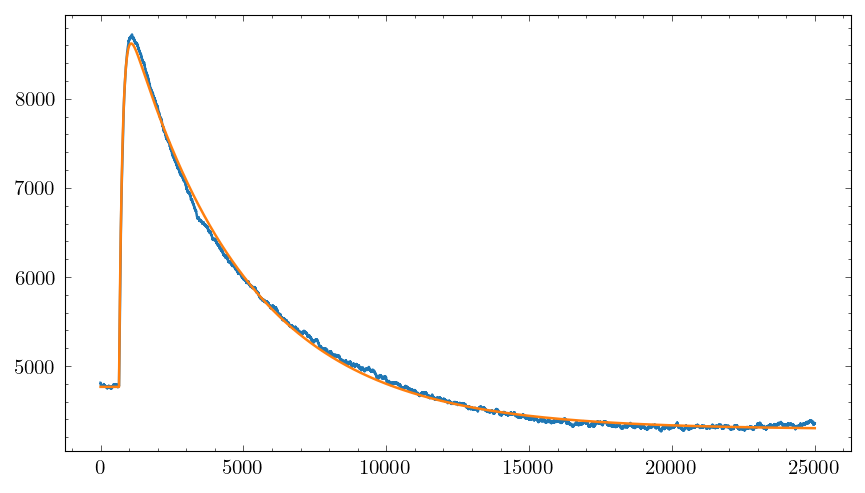

3856.0064327047075 
 4474.550091693127 
##############################


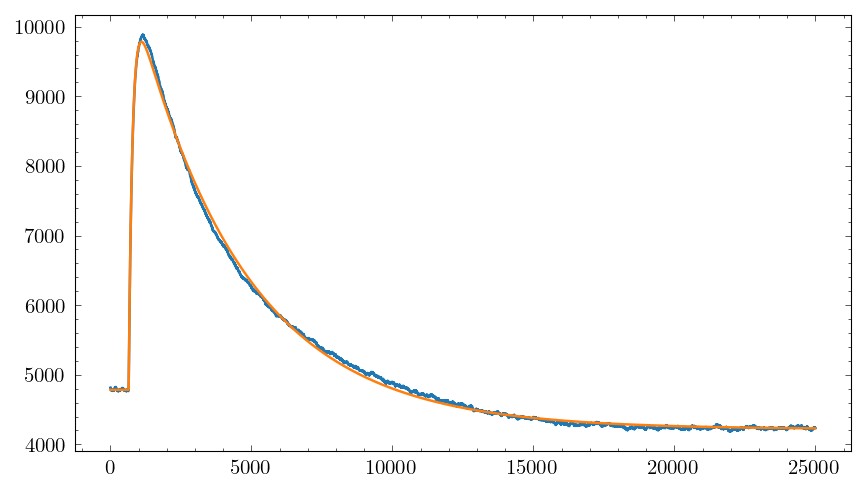

4999.277393294922 
 5911.1669732229475 
##############################


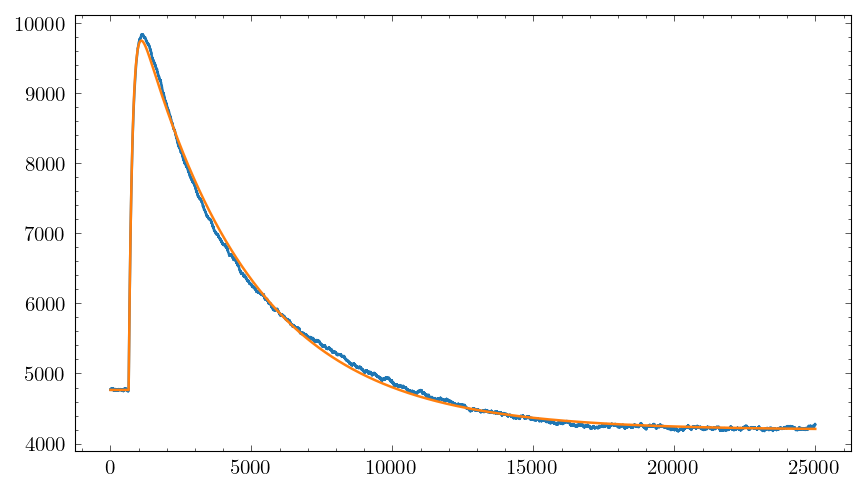

4983.832755982457 
 5864.67550564613 
##############################


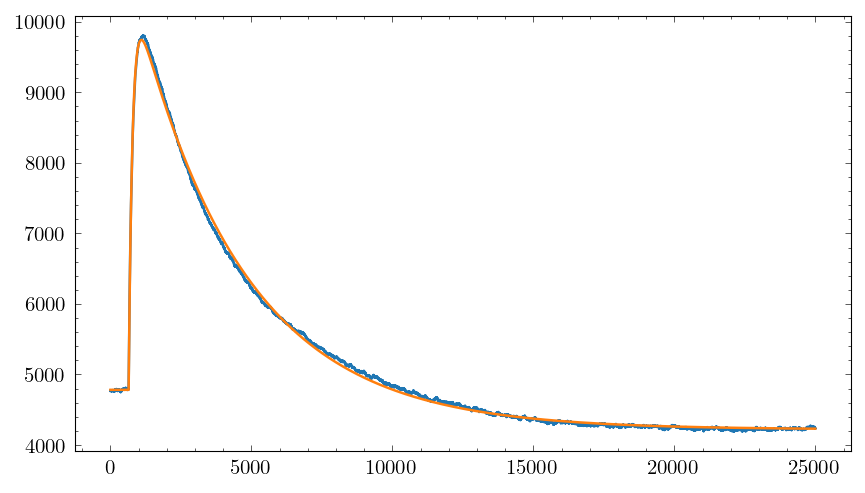

4962.544073231856 
 5872.770729525796 
##############################


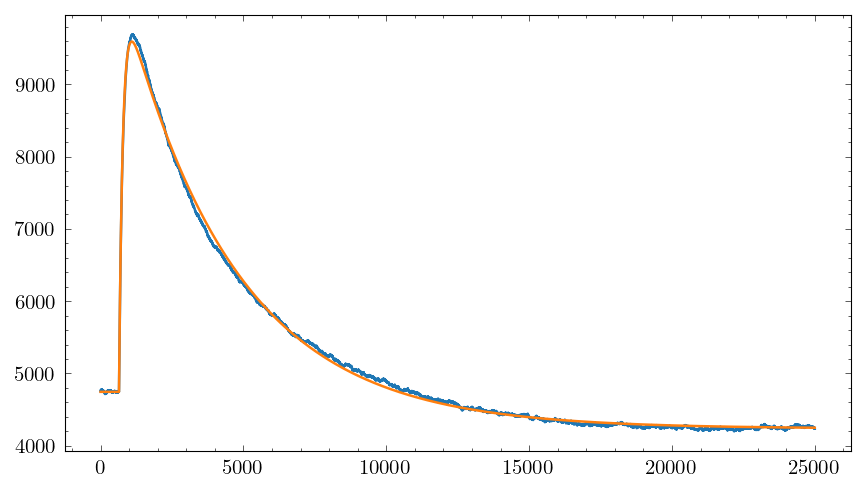

4847.05205025974 
 5705.105853803621 
##############################


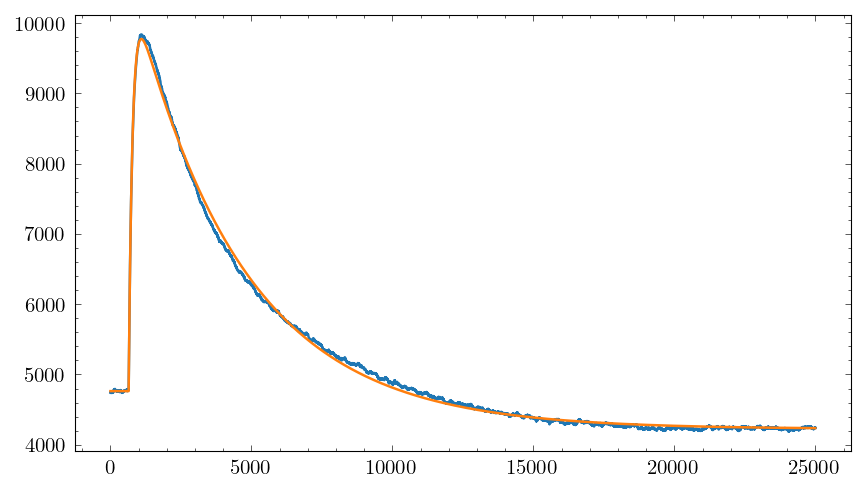

5010.708489767704 
 5907.359103464501 
##############################


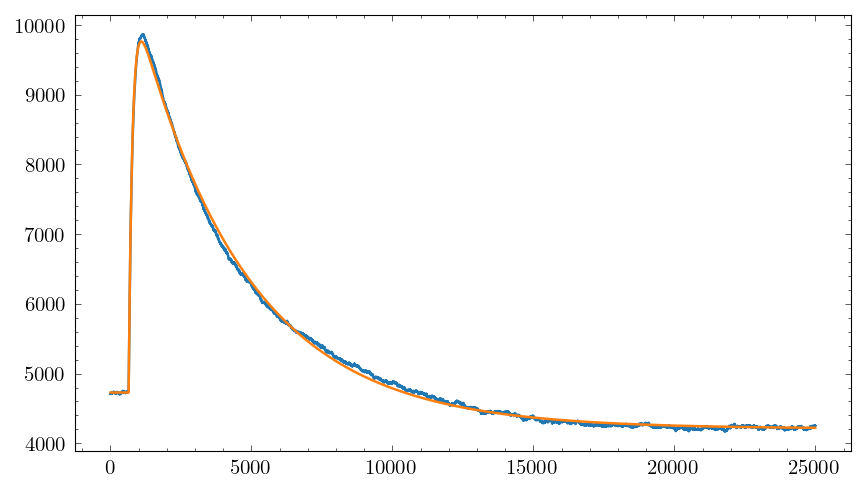

5035.841494583734 
 5929.224613648045 
##############################


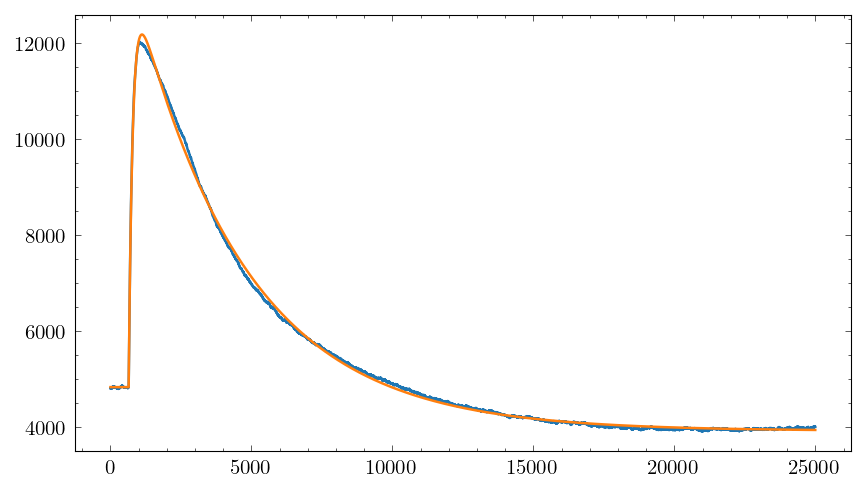

7337.745673761194 
 8728.182998207192 
##############################


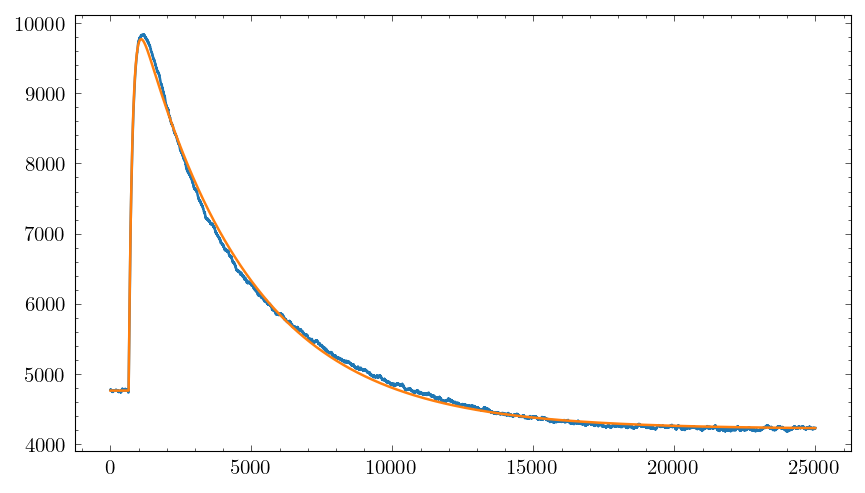

5004.591520755342 
 5890.844260817862 
##############################


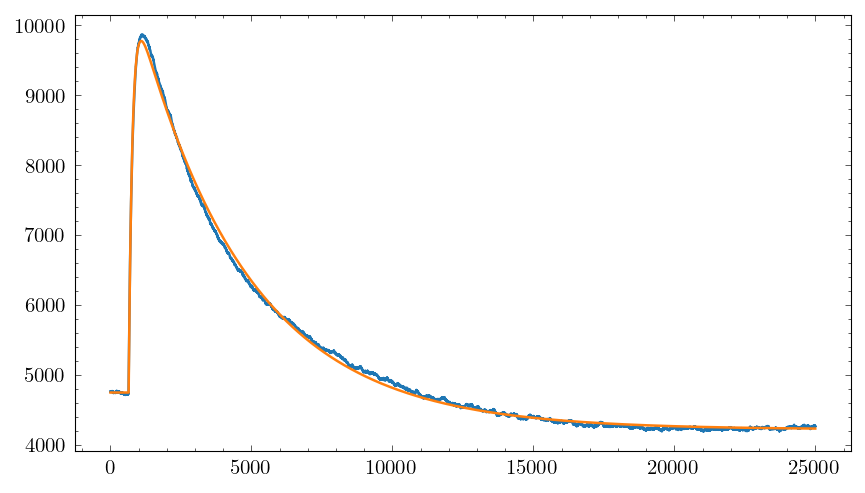

5026.864498320252 
 5906.585229939218 
##############################


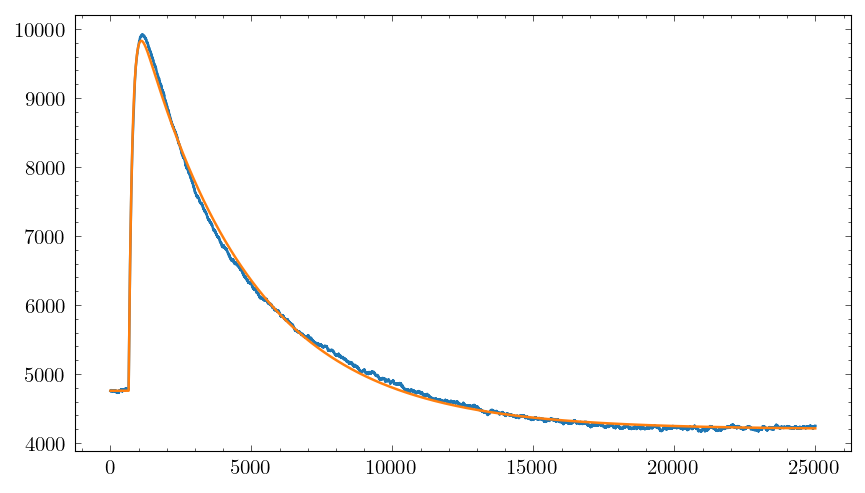

5072.832391241237 
 5971.251077526999 
##############################


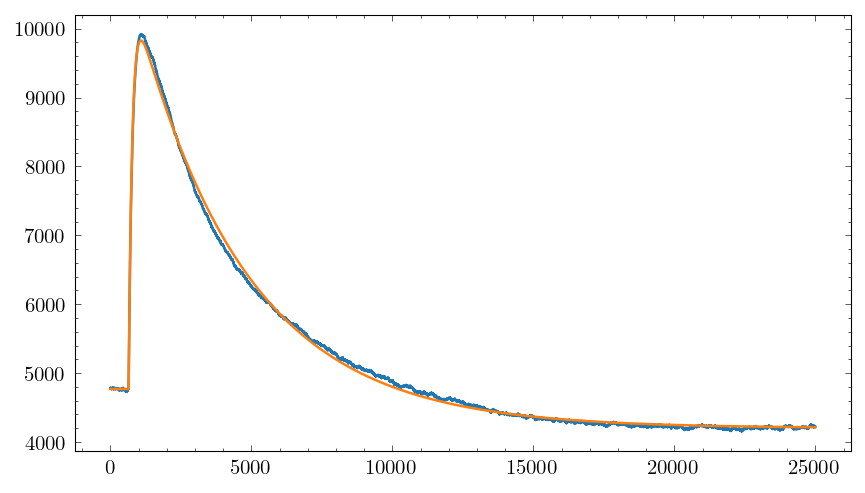

5058.234225706294 
 5930.699964659084 
##############################


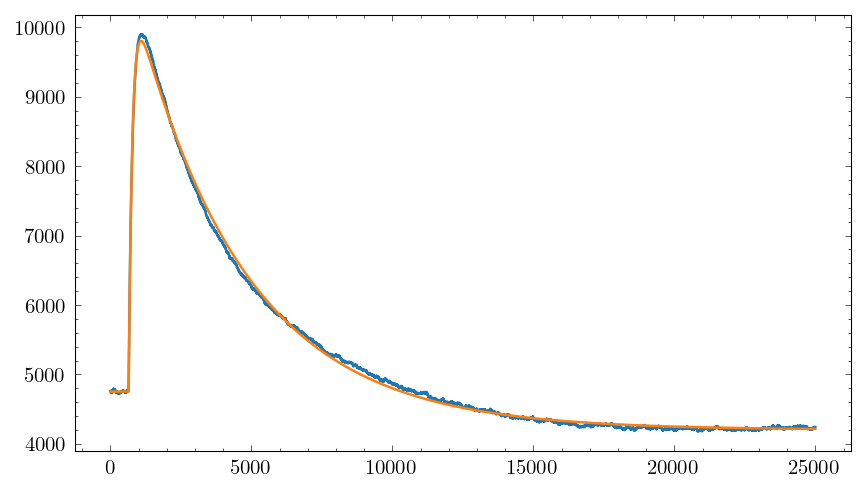

5053.046330162523 
 5924.824328214168 
##############################


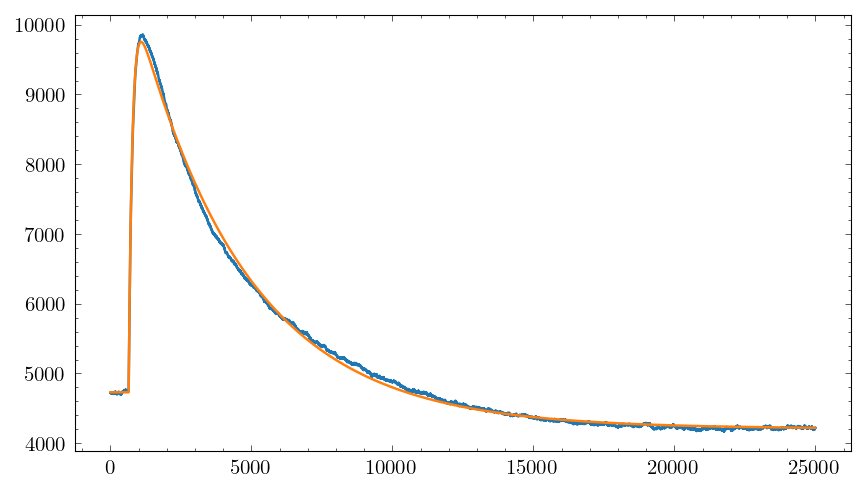

5023.365103083159 
 5892.83658170887 
##############################


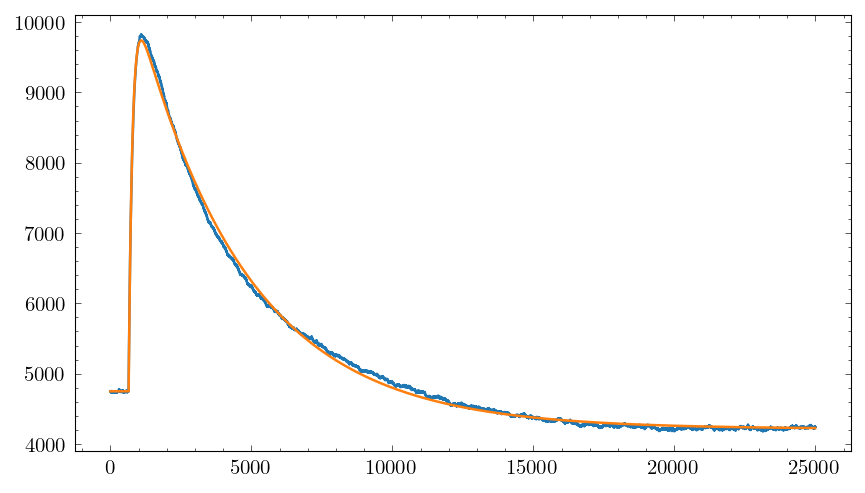

4990.407584600119 
 5871.777418381314 
##############################


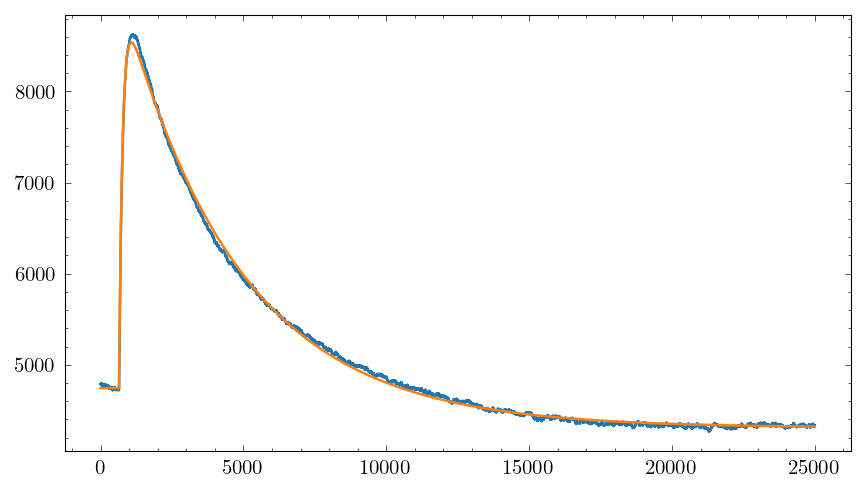

3793.972210348449 
 4412.779450274208 
##############################


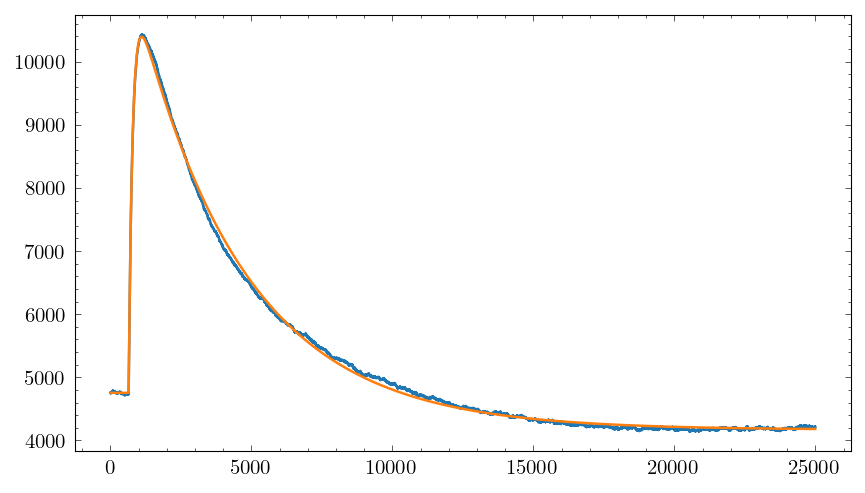

5638.816803447701 
 6696.253076442681 
##############################


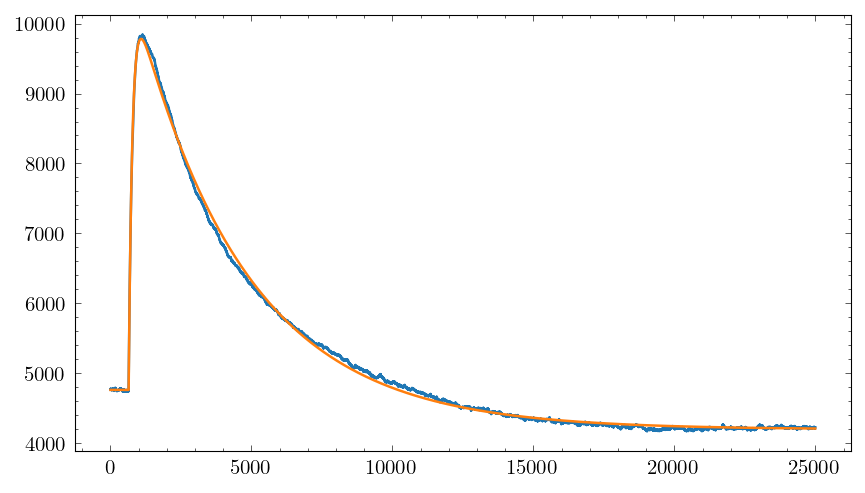

5018.230331674569 
 5895.855803207138 
##############################


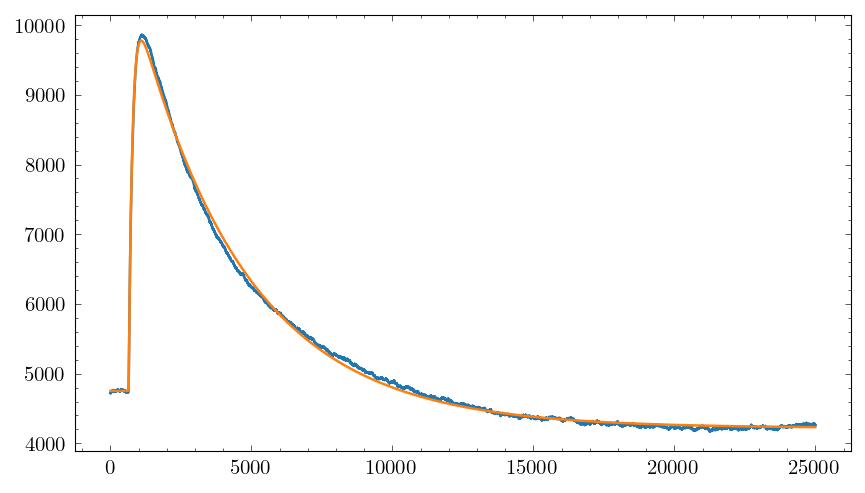

5023.774342506212 
 5914.969566425729 
##############################


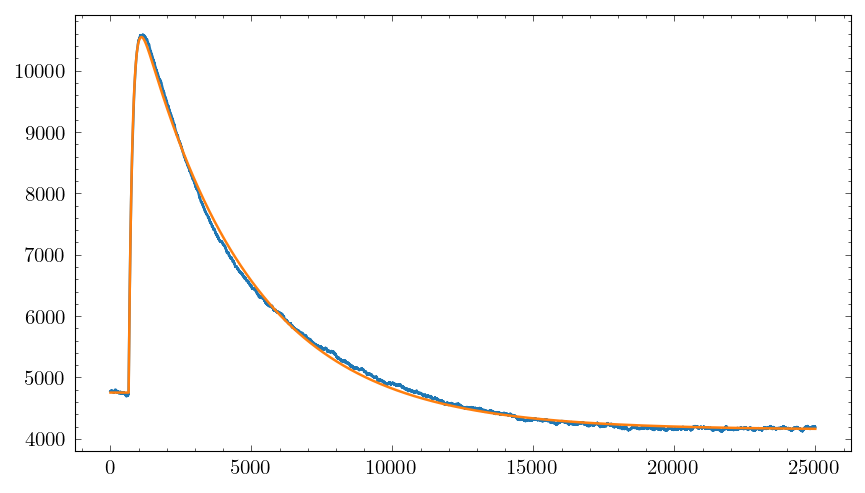

5792.527270379192 
 6835.9333854093875 
##############################


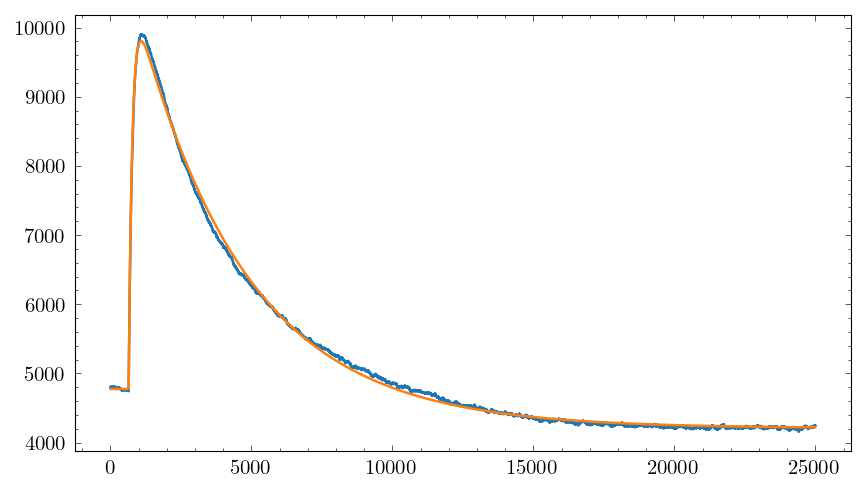

5027.482489943958 
 5915.6147492160735 
##############################


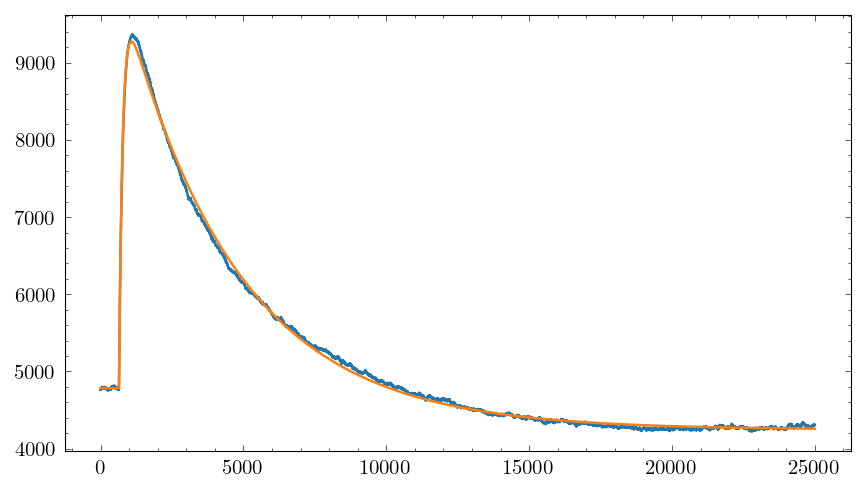

4489.9413957400075 
 5258.638126244627 
##############################


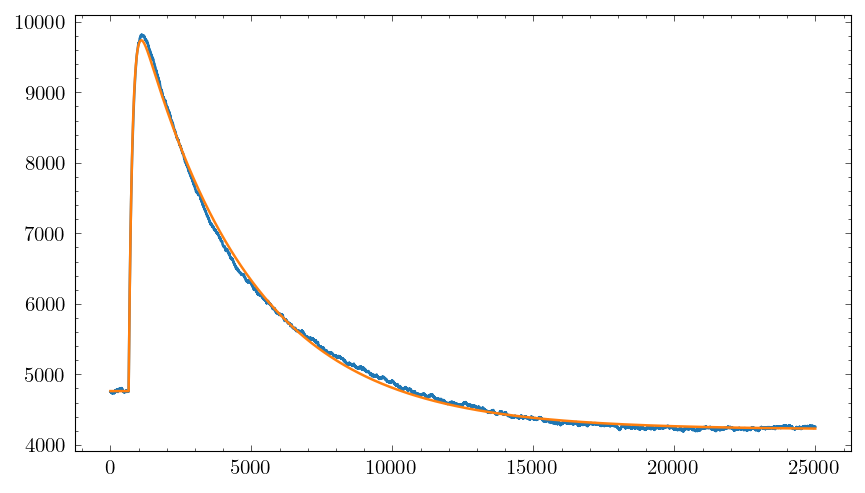

4976.0965050608565 
 5858.597728080989 
##############################


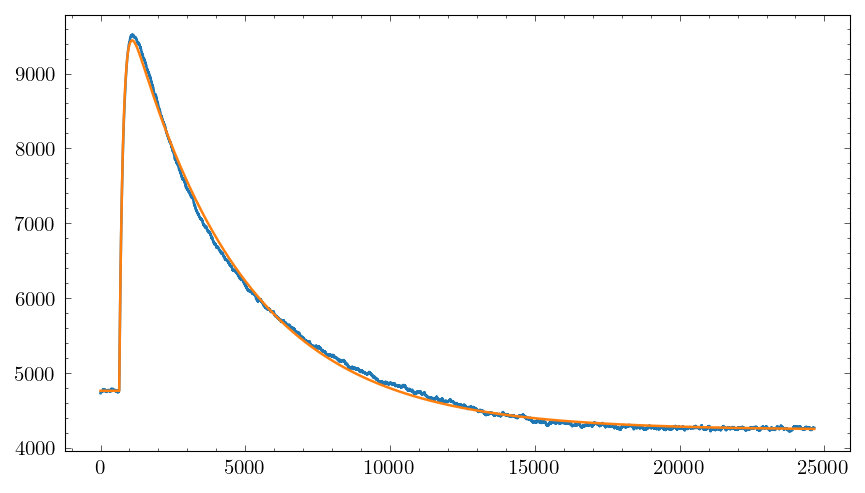

4680.934394097543 
 5508.697007436811 
##############################


In [14]:
# plot waveforms + fit

for i in data_raw_wf:
    waveform = np.array(list(map(int,data_raw_wf[i]['waveform'][1:-2])))
    x = np.linspace(0, len(waveform)-1, len(waveform))
    popt, pcov = data_raw_wf[i]['fit_3']
    
    plt.plot(x,waveform)
    plt.plot(x, fit_complete(x,popt[0],popt[1],popt[2],popt[3],popt[4],popt[5]))
    #plt.xlim(600,700)
    plt.show()
    maximum = np.amax(fit_complete(x,popt[0],popt[1],popt[2],popt[3],popt[4],popt[5]))-popt[1]
    data_raw_wf[i]['fit_max']= maximum
    print(maximum,'\n',popt[2],'\n'+30*'#')

/home/jo/monxe/monxe_software/monxeana/monxeana.py:407: RuntimeWarning: invalid value encountered in double_scalars
  return N * A* (B - ((x-mu)/(sigma)))**(-n)
/home/jo/monxe/monxe_software/monxeana/monxeana.py:311: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if counts_errors != "":
/home/jo/monxe/monxe_software/monxeana/monxeana.py:324: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if counts_errors != "":



########################################
peak: 0
########################################

isotope_data
   label : 210Po
   latex_label : $^{210}\mathrm{Po}$
   energy_in_MeV : 6.0

fit_data
   mu : 5011.2701612963565
   sigma : 30.095816542721558
   alpha : 0.6849828778507326
   n : 4.881400056627395
   N : 27.324240780794

fit_data_errors
   mu : 6.646289273358549
   sigma : 5.090030933511088
   alpha : 0.31786828532185724
   n : 6.304985940355801
   N : 3.580252680419816

graph_data
   np.ndarray of length 4000

resolution
   resolution_in_percent : 1.4142169506990117
   resolution_error : 0.23919036529078103

counts
   left_border_adc : 4650.120362783698
   right_border_adc : 5101.557610924521
   counts : 193




########################################
peak: 1
########################################

isotope_data
   label : 218Po
   latex_label : $^{218}\mathrm{Po}$
   energy_in_MeV : 6.0

fit_data
   mu : 6803.261523805694
   sigma : 36.65382723444945
   alpha : 2.3535774480551

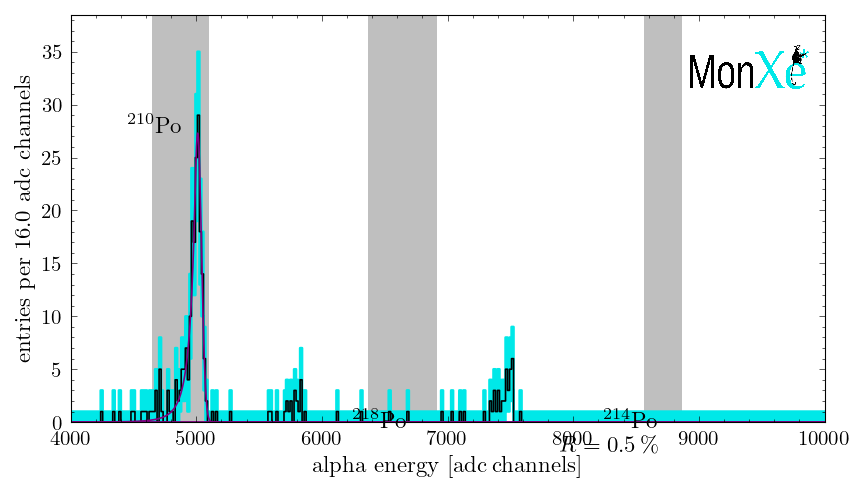

In [15]:
mode = ['fit_max','asymptotic','wf_max']
data_test = create_array(data_raw_wf,mode = mode[0])
#print(data_test)
flag_executethiscell = True
if flag_executethiscell == True:


    # generating rebinned histogram data
    data_histogram_rebinned = monxeana.get_histogram_data_from_timestamp_data(
        timestamp_data = data_test,
        number_of_bins = int(monxeana.n_adc_channels/16))


    # figure formatting
    fig, ax1 = plt.subplots(figsize=miscfig.image_format_dict["16_9"]["figsize"], dpi=150)
    y_lim = [0, 1.1*(max(data_histogram_rebinned["counts"]) + max(data_histogram_rebinned["counts_errors"]))]
    ax1.set_ylim(y_lim)
    x_lim = [4000, 10000]
    x_width = x_lim[1] -x_lim[0]
    y_width = y_lim[1] -y_lim[0]
    ax1.set_xlim(x_lim)
    #ax1.set_yscale('log')
    ax1.set_xlabel("alpha energy $[\mathrm{adc\,channels}]$")
    binwidth = float(data_histogram_rebinned['bin_centers'][2]-data_histogram_rebinned['bin_centers'][1])
    ax1.set_ylabel("entries per " +f"{binwidth:.1f}" +" adc channels")


    # data fitting
    # 'monxeana.fit_range_mult_crystal_ball()' outputs a dictionary containing the fit parameters for the respective peaks
    fit_param_dict = monxeana.fit_range_mult_crystal_ball(
        n = 3, # <--------------------------------------------- EDIT THIS!
        histogram_data = data_histogram_rebinned,
        fit_range = [4000, 9000],
        p0 = (5000, 25, 1, 1, 100, 6800, 25, 1, 1, 100, 8800, 25, 1, 1, 100)) # mu, sigma, alpha, n, N 
    monxeana.add_graph_data_to_fpd(fit_parameter_dictionary=fit_param_dict) # adding plottable graph data to 'fit_param_dict'


    # defining the isotope data corresponding to the peaks
    peak_data_dict = {
        "0": {
            "isotope_data" : {
                "label" : "210Po",
                "latex_label" : r"$^{210}\mathrm{Po}$",
                "energy_in_MeV" : 6.0,
            }
        },
        "1": {
            "isotope_data" : {
                "label" : "218Po",
                "latex_label" : r"$^{218}\mathrm{Po}$",
                "energy_in_MeV" : 6.0,
            }
        },
        "2": {
            "isotope_data" : {
                "label" : "214Po",
                "latex_label" : r"$^{214}\mathrm{Po}$",
                "energy_in_MeV" : 6.0,
            }
        },
    }


    # merging the 'fit_param_dict' into 'peak_data_dict'
    for i in range(len([*peak_data_dict])):
        peak_data_dict[str(i)].update(fit_param_dict[str(i)])


    # peak data calculations (i.e. determine resolution, number of counts, etc...)
    monxeana.calc_peak_data(peak_data_dictionary=peak_data_dict, timestamp_data_ndarray=data_raw)

    
    # plotting the stepized histogram
    bin_centers, counts, counts_errors, bin_centers_mod, counts_mod = monxeana.stepize_histogram_data(
        bincenters=data_histogram_rebinned["bin_centers"],
        counts=data_histogram_rebinned["counts"],
        counts_errors=data_histogram_rebinned["counts_errors"],
        flag_addfirstandlaststep = True)
    plt.plot(
        bin_centers_mod,
        counts_mod,
        linewidth=monxeana.linewidth_histogram_std,
        color=monxeana.color_histogram,
        linestyle='-',
        zorder=1,
        label="fdfa")


    # plotting the Poissonian errors
    plt.fill_between(
        bin_centers,
        counts-counts_errors,
        counts+counts_errors,
        color=monxeana.color_histogram_error,
        alpha=1,
        zorder=0,
        interpolate = True)


    # plotting the fit data
    for key, val in peak_data_dict.items():
        plt.plot(
            peak_data_dict[key]["graph_data"]["x"],
            peak_data_dict[key]["graph_data"]["y"],
            linewidth = monxeana.linewidth_histogram_std,
            color = "purple",
            linestyle = '-',
            zorder = 1,
            label = key)


    # annotationg the MonXe logo
    miscfig.image_onto_plot(
        filestring = "monxe_logo__transparent_bkg.png",
        ax=ax1,
        position=(x_lim[0]+0.90*(x_lim[1]-x_lim[0]),y_lim[0]+0.87*(y_lim[1]-y_lim[0])),
        pathstring = pathstring_miscellaneous_figures +"monxe_logo/",
        zoom=0.02,
        zorder=0)


    # annotating
    for key, val in peak_data_dict.items():
        plt.text(
            x = peak_data_dict[key]["fit_data"]["mu"] -0.02*x_width,
            y = 1.02*monxeana.function_crystal_ball_one(x=peak_data_dict[key]["fit_data"]["mu"], **peak_data_dict[key]["fit_data"]) ,
            #transform = ax1.transAxes,
            s = peak_data_dict[key]["isotope_data"]["latex_label"],
            color = "black",
            fontsize = 11,
            verticalalignment = 'center',
            horizontalalignment = 'right')


    # annotating 
    plt.text(
        x = peak_data_dict["2"]["fit_data"]["mu"] -0.02*x_width,
        y = 1.02*monxeana.function_crystal_ball_one(x=peak_data_dict["2"]["fit_data"]["mu"], **peak_data_dict["2"]["fit_data"]) -0.06*y_width,
        #transform = ax1.transAxes,
        s = r"$R=" +f"{peak_data_dict['2']['resolution']['resolution_in_percent']:.1f}" +r"\,\%$",
        color = "black",
        fontsize = 11,
        verticalalignment = 'center',
        horizontalalignment = 'right')


    # annotating 
    for key, val in peak_data_dict.items():
        ax1.axvspan(peak_data_dict[key]["counts"]["left_border_adc"], peak_data_dict[key]["counts"]["right_border_adc"], alpha=0.5, linewidth=0, color='grey', zorder=-50)


    # printing the legend
    #plt.legend()




    # saving and printing the output
    #plt.show()
    fig.savefig(monxeana.pathstring_output_relative +monxeana.filename_histogram_png +"__fit.png")
    #fig.savefig("/home/daniel/Desktop/arbeitsstuff/20200420__conferences_workshops_excursions/20200909__darwin_collaboration_meeting_2020/talk_monxe/images/" +monxeana.filename_histogram_png +"__fit.png")
    monxeana.print_peak_data_dict_contents(pdd = peak_data_dict)